<a href="https://colab.research.google.com/github/AngieDuarteA01/Ciencia-de-datos-/blob/main/Proyecto_Final_LOL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Proyecto Final League of Legends (Jose Pulido)

##Introducción

In [ ]:
!pip install --upgrade seaborn matplotlib pandas scipy statsmodels wquantiles

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.6/8.6 MB 28.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.1/13.1 MB 34.0 MB/s eta 0:00:00
  Attempting uninstall: pandas
    Found existing installation: pandas 2.2.2
    Uninstalling pandas-2.2.2:
      Successfully uninstalled pandas-2.2.2
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.10.0
    Uninstalling matplotlib-3.10.0:
      Successfully uninstalled matplotlib-3.10.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 2.2.3 which is incompatible.


In [ ]:
from tabulate import tabulate
import pandas as pd
import numpy as np
import plotly.express as px
import seaborn as sns
import wquantiles
import matplotlib.pyplot as plt
import os
from math import pi

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df= pd.read_excel('/content/drive/MyDrive/lol_data_Uwuowoarfarf (1).xlsx')
df

,match_id,champion,win,kills,deaths,assists,kda,cs,vision_score,gold_earned,...,team_position,items,summoner_spells,damage_to_champs,damage_taken,dragons_killed,barons_killed,turret_kills,wards_placed,wards_destroyed
0,LA1_1621435296,Lillia,True,6,4,11,4.25,239,29,13962,...,JUNGLE,"[4633, 3157, 3175, 1011, 6653, 1052, 3364]","[11, 4]",30402,58886,4,1,1,5,6
1,LA1_1621431721,JarvanIV,False,4,6,13,2.83,213,21,12892,...,JUNGLE,"[6610, 6692, 3047, 3075, 3110, 0, 3364]","[11, 4]",17871,39918,3,0,0,6,4
2,LA1_1621113482,JarvanIV,True,4,5,7,2.20,160,20,10628,...,JUNGLE,"[6610, 6692, 3047, 1029, 3211, 3067, 3364]","[11, 4]",13333,29392,2,1,0,2,6
3,LA1_1621096016,Nocturne,False,11,9,12,2.56,197,26,16242,...,JUNGLE,"[3073, 6631, 3111, 3071, 6333, 0, 3364]","[11, 4]",37127,72313,1,1,0,1,8
4,LA1_1621045947,JarvanIV,True,7,6,30,6.17,193,33,17073,...,JUNGLE,"[3065, 6692, 6610, 3110, 3111, 3075, 3364]","[11, 4]",36707,54133,1,1,0,11,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,LA1_1610047585,Lillia,False,7,10,7,1.40,218,27,14574,...,JUNGLE,"[4633, 3157, 3175, 6653, 4632, 0, 3364]","[11, 4]",36754,61045,0,0,1,2,6
96,LA1_1610046282,Lillia,False,0,0,0,0.00,1,1,531,...,JUNGLE,"[1102, 0, 0, 0, 0, 0, 3364]","[11, 4]",0,452,0,0,0,0,1
97,LA1_1610032079,Rengar,False,10,8,10,2.50,200,22,14128,...,JUNGLE,"[3142, 6698, 3171, 6695, 3036, 0, 3364]","[11, 4]",35237,45689,3,1,0,3,5
98,LA1_1609994466,Rengar,False,6,2,4,5.00,171,15,10499,...,JUNGLE,"[3142, 6698, 3035, 3158, 6670, 0, 3364]","[11, 4]",17715,34685,1,0,0,1,4


In [ ]:
!GET https://<region>.api.riotgames.com/lol/match/v5/matches/<matchId>

/bin/bash: -c: line 1: syntax error near unexpected token `newline'
/bin/bash: -c: line 1: `GET https://<region>.api.riotgames.com/lol/match/v5/matches/<matchId>'


##Features


In [ ]:
df.columns

Index(['match_id', 'champion', 'win', 'kills', 'deaths', 'assists', 'kda',
       'cs', 'vision_score', 'gold_earned', 'game_duration', 'queue_id',
       'team_position', 'items', 'summoner_spells', 'damage_to_champs',
       'damage_taken', 'dragons_killed', 'barons_killed', 'turret_kills',
       'wards_placed', 'wards_destroyed'],
      dtype='object')

In [ ]:
def contar(df, feature):
    return df[feature].value_counts().reset_index()
    # reset_index() convierte la Serie en un DataFrame para tabulate

for column in df.columns:
    conteo_df = contar(df, column)
    conteo_df.columns = [column, "Frecuencia"]  # Renombramos las columnas del DataFrame resultante
    tabla = tabulate(conteo_df, headers="keys", tablefmt="fancy_grid", showindex=False)
    print(f"\nConteo de la columna: {column}\n")
    print(tabla)


Conteo de la columna: match_id

╒════════════════╤══════════════╕
│ match_id       │   Frecuencia │
╞════════════════╪══════════════╡
│ LA1_1621435296 │            1 │
├────────────────┼──────────────┤
│ LA1_1621431721 │            1 │
├────────────────┼──────────────┤
│ LA1_1621113482 │            1 │
├────────────────┼──────────────┤
│ LA1_1621096016 │            1 │
├────────────────┼──────────────┤
│ LA1_1621045947 │            1 │
├────────────────┼──────────────┤
│ LA1_1620950197 │            1 │
├────────────────┼──────────────┤
│ LA1_1620942357 │            1 │
├────────────────┼──────────────┤
│ LA1_1620937348 │            1 │
├────────────────┼──────────────┤
│ LA1_1620197035 │            1 │
├────────────────┼──────────────┤
│ LA1_1620185947 │            1 │
├────────────────┼──────────────┤
│ LA1_1620139773 │            1 │
├────────────────┼──────────────┤
│ LA1_1620138323 │            1 │
├────────────────┼──────────────┤
│ LA1_1619888904 │            1 │
├──────────────

- match_id
  - LA1_16099*****
- champion
  - str()
- win
  - True: Ganador
  - False: Perdio
- kills: Cantidad de Asesinatos
  - int()
- deaths: Cantidad de veces que murio
  - int()
- assists: Cantidad de veces qeu ayudo a producir un asesinato
  - int()
- kda: Relación de Kills, deaths y assists
  - (Kills+Assists)/Deaths
  - float()
- cs: Cantidad de subditos y cantidad de monstruos neutros eliminados.
  - int()
- vision_score: Todas las unidades que permiten observar el mapa.
  - Puntuación de visión = (1 punto por minuto de vida útil del pupilo proporcionado) + (1 punto por minuto de vida útil del pupilo denegado)
  - int()
- gold_earned: Cantidad de Oro obtenido
  - int()
- game_duration: Duración de la partida
  - int()
- queue_id: Tipo de partida jugada
  - int()
- team_position: Tipo de rol jugado
  - str()
- items: Objetos comprados en la partida
  - int()
- summoner_spells: Hechizos del invocador
  - int()
- damage_to_champs: Daño a Campeones
  - int()
- damage_taken: Daño recibido en la partida
  - int()
- dragons_killed: Cantidad de dragones asesinados en la partida
  - int()
- barons_killed: Cantidad de Barons asesinados por partida
  - int()
- turret_kills: Cantidad de Torres destruidas en la partida
  - int()
- wards_placed: Cantidad de wards colocados
  -  int()
- wards_destroyed: Cantidad de wards destruidos
  - int()

In [ ]:
#Cambiar el True y False de WIN con 1 y 2
df['win'] = df['win'].replace({True: 1, False: 0})

<ipython-input-8-fc9e650c39b4>:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['win'] = df['win'].replace({True: 1, False: 0})


##Filtrar

###Hay datos NaN?

In [ ]:
#Datos que tienen NaN
df.isnull().sum()

,0
match_id,0
champion,0
win,0
kills,0
deaths,0
assists,0
kda,0
cs,0
vision_score,0
gold_earned,0


In [ ]:
#Mostrar los datos NaN de team_position
df[df['team_position'].isnull()]

,match_id,champion,win,kills,deaths,assists,kda,cs,vision_score,gold_earned,...,team_position,items,summoner_spells,damage_to_champs,damage_taken,dragons_killed,barons_killed,turret_kills,wards_placed,wards_destroyed
61,LA1_1615633791,Fiora,1,17,9,13,3.33,89,0,19637,...,NaN,"[3078, 3074, 6333, 3047, 1033, 6610, 0]","[32, 4]",30315,46411,0,0,2,0,0
62,LA1_1615525387,Tristana,1,19,9,28,5.22,91,0,18708,...,NaN,"[3087, 3006, 6676, 3094, 3072, 3031, 2052]","[7, 4]",53050,32509,0,0,4,0,0
63,LA1_1615076887,Azir,1,21,7,35,8.00,88,0,18237,...,NaN,"[3115, 3157, 3020, 6653, 4645, 4630, 2052]","[32, 4]",70940,25489,0,0,0,0,0
94,LA1_1610376689,Gragas,1,14,13,22,2.77,15,0,13956,...,NaN,"[6655, 1052, 6657, 3020, 4645, 1058, 2052]","[32, 4]",32557,41146,0,0,0,0,0


- Datos Nan son de Aram, por ende no tienen carril y son datos que no se van a tomar en cuenta

In [ ]:
df=df.dropna()

In [ ]:
df[df['team_position'].isnull()]

,match_id,champion,win,kills,deaths,assists,kda,cs,vision_score,gold_earned,...,team_position,items,summoner_spells,damage_to_champs,damage_taken,dragons_killed,barons_killed,turret_kills,wards_placed,wards_destroyed


###Que Roles juega? Cuales son pertinentes?

In [ ]:
#Cuales team_position hay?
df['team_position'].unique()

array(['JUNGLE', 'TOP'], dtype=object)

In [ ]:
#Cantidad de team_position por posicion
df['team_position'].value_counts()

,count
team_position,
JUNGLE,91
TOP,5


###Que Campeones de Jungla juega?

In [ ]:
#Campeones segun team_position
jungle_df = df[df['team_position'] == 'JUNGLE']
jungle_champion_counts = jungle_df['champion'].value_counts()
print(jungle_champion_counts)

champion
JarvanIV    33
Lillia      29
Rengar      13
Nocturne     9
Gwen         3
Viego        2
Amumu        1
Graves       1
Name: count, dtype: int64


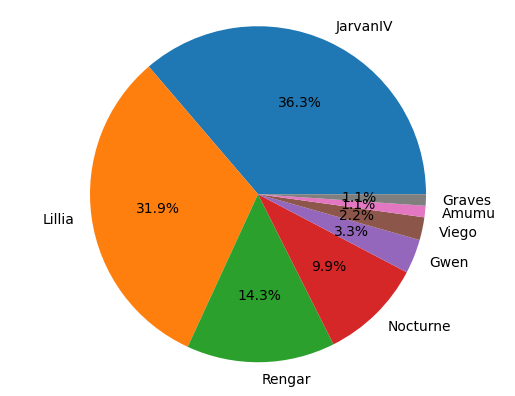

In [ ]:
#Grafica de pastel segun jungle_champion_counts
plt.pie(jungle_champion_counts, labels=jungle_champion_counts.index, autopct='%1.1f%%')
plt.axis('equal')
plt.show()

In [ ]:
#Saber que campeones de jungla son pertinentes
jungle_champion_counts[jungle_champion_counts > 10]

,count
champion,
JarvanIV,33
Lillia,29
Rengar,13


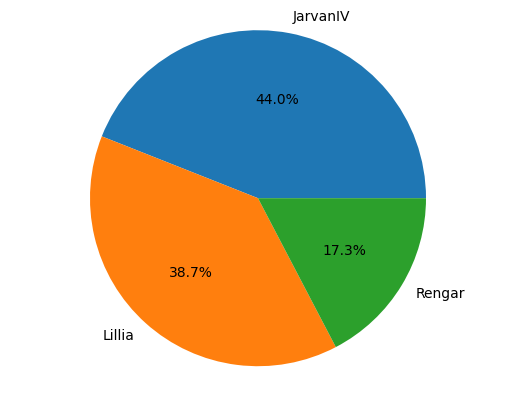

In [ ]:
#Grafica de los campeones principales que se juegan
plt.pie(jungle_champion_counts[jungle_champion_counts > 10], labels=jungle_champion_counts[jungle_champion_counts > 10].index, autopct='%1.1f%%')
plt.axis('equal')
plt.show()

In [ ]:
# Valores de queue_id
df['queue_id'].unique()

array([440, 400, 420])

- 440: Rankes Flex
- 400: Selección Oculta
- 420: Ranked Solo/Duo

In [ ]:
#Partidas solo ranked 420 y 440
#ranked_df = df[df['queue_id'] == 420]

ranked_df = df[df['queue_id'] != 400]
ranked_df['queue_id'].unique()

array([440, 420])

In [ ]:
#Saber que campeones de jungla son pertinentes en solo ranked 420
jungle_champion_counts = ranked_df['champion'].value_counts()
jungle_champion_counts


,count
champion,
JarvanIV,33
Lillia,28
Rengar,13
Nocturne,9
Garen,4
Gwen,4
Viego,2
Amumu,1
Graves,1


In [ ]:
#Saber que campeones de jungla son pertinentes
jungle_champion_counts[jungle_champion_counts > 10]

,count
champion,
JarvanIV,33
Lillia,28
Rengar,13


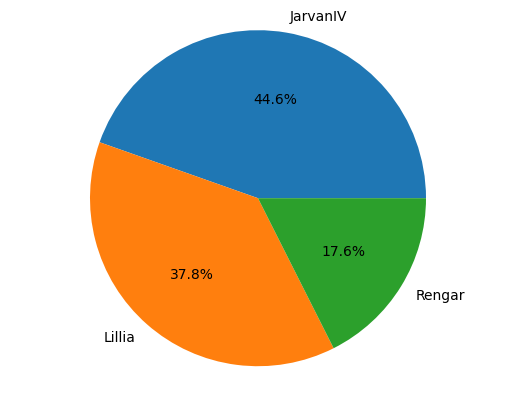

In [ ]:
#Grafica de pastel de los campeones solo/duo
plt.pie(jungle_champion_counts[jungle_champion_counts > 10], labels=jungle_champion_counts[jungle_champion_counts > 10].index, autopct='%1.1f%%')
plt.axis('equal')
plt.show()

##Gráficas



In [ ]:
metricas = ['kills', 'deaths', 'assists', 'kda', 'cs', 'vision_score', 'gold_earned', 'game_duration', 'damage_to_champs', 'damage_taken', 'dragons_killed', 'barons_killed', 'turret_kills', 'wards_placed', 'wards_destroyed']

In [ ]:
def plot_correlation_heatmap(df, features_to_correlate, figsize=(12, 10), title='Matriz de Correlación de Estadísticas de Juego'):
    valid_features = []
    for feature in features_to_correlate:
        if feature not in df.columns:
            print(f"Advertencia: La feature '{feature}' no se encuentra en el DataFrame y será ignorada.")
        elif not pd.api.types.is_numeric_dtype(df[feature]):
            print(f"Advertencia: La feature '{feature}' no es numérica y será ignorada.")
        else:
            valid_features.append(feature)

    if not valid_features:
        print("Error: No hay features numéricas válidas para generar el heatmap de correlación.")
        return
    correlation_matrix = df[valid_features].corr()
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=figsize)
    sns.heatmap(
        correlation_matrix,
        annot=True,     # Muestra los valores de correlación en el heatmap
        cmap='coolwarm', # Mapa de colores divergente (rojo para negativo, azul para positivo)
        fmt=".2f",      # Formato de los valores a dos decimales
        linewidths=.5,  # Líneas entre las celdas
        ax=ax           # Asegura que el heatmap se dibuje en los ejes creados
    )
    ax.set_xticklabels(
        ax.get_xticklabels(),
        rotation = 45,
        horizontalalignment = 'right',
        fontsize = 9 # Ajusta el tamaño de la fuente de las etiquetas del eje X
    )
    ax.set_yticklabels(
        ax.get_yticklabels(),
        rotation = 0, # Las etiquetas del eje Y usualmente no se rotan
        verticalalignment = 'center',
        fontsize = 9 # Ajusta el tamaño de la fuente de las etiquetas del eje Y
    )
    plt.title(title, fontsize=16)
    plt.tight_layout() # Asegura que todos los elementos se ajusten bien dentro de la figura
    plt.show() # Muestra la figura

In [ ]:
def plot_metric_density_by_win_outcome(df, metrics_list=metricas, win_column='win',
                                        col_wrap=4, height=3.5, aspect=1.2,
                                        custom_palette={0: 'red', 1: 'blue'},
                                        main_title='Distribución de Densidad de Métricas por Resultado de Partida'):
    if win_column not in df.columns:
        print(f"Error: La columna '{win_column}' no se encuentra en el DataFrame.")
        return

    valid_metrics = []
    for metric in metrics_list:
        if metric not in df.columns:
            print(f"Advertencia: La métrica '{metric}' no se encuentra en el DataFrame y será ignorada.")
        elif not pd.api.types.is_numeric_dtype(df[metric]):
            print(f"Advertencia: La métrica '{metric}' no es numérica y será ignorada.")
        else:
            valid_metrics.append(metric)

    if not valid_metrics:
        print("Error: No hay métricas numéricas válidas para generar los gráficos de densidad.")
        return
    df_copy = df.copy()
    if not pd.api.types.is_categorical_dtype(df_copy[win_column].dtype):
        try:
            df_copy[win_column] = df_copy[win_column].astype('category')
            print(f"DEBUG: Columna '{win_column}' convertida a tipo 'category'.")
        except Exception as e:
            print(f"Error: No se pudo convertir la columna '{win_column}' a tipo 'category'. {e}")
            return

    df_melted = df_copy.melt(id_vars=[win_column], value_vars=valid_metrics,
                             var_name='Métrica', value_name='Valor')

    g = sns.FacetGrid(df_melted, col='Métrica', hue=win_column, col_wrap=col_wrap,
                      height=height, aspect=aspect,
                      sharex=False, sharey=True, # Ejes X independientes, eje Y compartido
                      palette=custom_palette,
                      legend_out=False) # Leyenda dentro de la figura

    g.map(sns.kdeplot, 'Valor', fill=False, linewidth=2)

    for ax in g.axes.flat:
        # Extrae el nombre original de la métrica del título del subplot y lo formatea
        current_metric_name = ax.get_title().split('=')[-1].strip()
        formatted_title = current_metric_name.replace("_", " ").title()
        ax.set_title(formatted_title, fontsize=12)
        ax.set_xlabel('Valor', fontsize=10)
        ax.set_ylabel('Densidad', fontsize=10)
        ax.tick_params(axis='x', labelsize=8)
        ax.tick_params(axis='y', labelsize=8)

    plt.suptitle(main_title, y=1.02, fontsize=18)
    handles, labels = g.axes.flat[0].get_legend_handles_labels()
    sorted_labels_values = sorted([int(lbl) for lbl in labels])
    new_labels_for_legend = ['Derrota' if val == 0 else 'Victoria' for val in sorted_labels_values]

    g.fig.legend(handles=handles, labels=new_labels_for_legend, title="Resultado de la Partida",
                 loc='lower left', # Posiciona la leyenda en la parte inferior izquierda de la figura
                 bbox_to_anchor=(0.02, 0.02), # Ajusta las coordenadas (x, y) de la esquina inferior izquierda de la leyenda
                 frameon=True) # Mostrar un marco alrededor de la leyenda
    plt.tight_layout(rect=[0.05, 0.05, 1, 0.98])
    plt.show()

In [ ]:
def plot_global_win_loss_donut_charts(df, metrics_list, win_column='win',
                                           ncols=4, figsize_unit_width=5, figsize_unit_height=5,
                                           donut_hole_size=0.70, autopct_fontsize=10, autopct_fontweight='bold',
                                           autopct_color='white',
                                           main_title='Proporción de Victorias y Derrotas (contexto de Métrica)',
                                           context_type='median'):
    if win_column not in df.columns:
        print(f"Error: La columna '{win_column}' no se encuentra en el DataFrame.")
        return
    if not isinstance(metrics_list, list) or not metrics_list:
        print("Error: 'metrics_list' debe ser una lista no vacía de nombres de métricas.")
        return

    df_copy = df.copy()
    if not pd.api.types.is_categorical_dtype(df_copy[win_column].dtype):
        try:
            df_copy[win_column] = df_copy[win_column].astype('category')
        except Exception as e:
            print(f"Advertencia: No se pudo convertir '{win_column}' a tipo 'category'. {e}")

    labels = ['Derrota', 'Victoria']
    colors = ['#FF6347', '#4CAF50'] # Rojo para Derrota, Verde para Victoria

    # --- Función auxiliar para dibujar un solo donut (reutilizada de antes) ---
    def draw_single_donut(ax, win_counts, title_text, hole_size=donut_hole_size,
                          ap_fs=autopct_fontsize, ap_fw=autopct_fontweight, ap_color=autopct_color):
        if win_counts.empty:
            ax.text(0.5, 0.5, "Sin Datos", horizontalalignment='center', verticalalignment='center',
                    transform=ax.transAxes, fontsize=14, color='gray')
            ax.set_title(title_text, fontsize=11)
            ax.axis('off') # Quitar ejes si no hay datos
            return

        total = win_counts.sum()
        if total == 0:
            ax.text(0.5, 0.5, "Sin Partidas", horizontalalignment='center', verticalalignment='center',
                    transform=ax.transAxes, fontsize=14, color='gray')
            ax.set_title(title_text, fontsize=11)
            ax.axis('off')
            return

        # Asegurarse de que los valores 0 y 1 existan, si no, poner 0
        loss_count = win_counts.get(0, 0)
        win_count = win_counts.get(1, 0)
        data = [loss_count, win_count] # Usar conteos directamente, autopct los convierte a %

        wedges, texts, autotexts = ax.pie(data,
                                          labels=labels,
                                          autopct='%1.1f%%',
                                          startangle=90,
                                          colors=colors,
                                          pctdistance=hole_size + 0.1)

        centre_circle = plt.Circle((0,0), hole_size, fc='white')
        ax.add_artist(centre_circle)

        for autotext in autotexts:
            autotext.set_color(ap_color)
            autotext.set_fontsize(ap_fs)
            autotext.set_fontweight(ap_fw)

        ax.set_title(title_text, fontsize=11)
        ax.axis('equal')

    # --- Lógica principal para dibujar los donuts ---
    if context_type == 'global':
        # Muestra un donut por métrica, pero todos con el winrate global
        win_counts_global = df_copy[win_column].value_counts().sort_index()
        num_plots = len(metrics_list)
        nrows = int(np.ceil(num_plots / ncols))
        fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * figsize_unit_width, nrows * figsize_unit_height))
        axes = axes.flatten()

        for i, metric in enumerate(metrics_list):
            ax = axes[i]
            title_text = f'Global Win/Loss ({metric.replace("_", " ").title()})'
            draw_single_donut(ax, win_counts_global, title_text)

    elif context_type == 'median':
        # Muestra dos donuts por métrica: < mediana y >= mediana
        actual_metrics = [m for m in metrics_list if m in df.columns]
        num_plots = len(actual_metrics) * 2 # Dos plots por cada métrica
        nrows = int(np.ceil(num_plots / ncols))

        fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * figsize_unit_width, nrows * figsize_unit_height))
        axes = axes.flatten()

        plot_idx = 0
        for metric in actual_metrics:
            if df_copy[metric].dtype not in ['int64', 'float64']:
                print(f"Advertencia: La métrica '{metric}' no es numérica. Saltando el contexto 'median'.")
                continue

            median_val = df_copy[metric].median()

            # Grupo 1: Valores por debajo de la mediana
            df_below = df_copy[df_copy[metric] < median_val]
            win_counts_below = df_below[win_column].value_counts().sort_index()
            ax_below = axes[plot_idx]
            draw_single_donut(ax_below, win_counts_below,
                              f'Win/Loss (< {metric.replace("_", " ").title()} {median_val:.1f})')
            plot_idx += 1

            # Grupo 2: Valores por encima o igual a la mediana
            df_above_eq = df_copy[df_copy[metric] >= median_val]
            win_counts_above_eq = df_above_eq[win_column].value_counts().sort_index()
            ax_above_eq = axes[plot_idx]
            draw_single_donut(ax_above_eq, win_counts_above_eq,
                              f'Win/Loss (>= {metric.replace("_", " ").title()} {median_val:.1f})')
            plot_idx += 1

        # Ocultar subplots adicionales si los hay (cuando num_plots no es múltiplo de ncols)
        for j in range(plot_idx, len(axes)):
            fig.delaxes(axes[j])

    elif context_type == 'quantiles':
        # Implementación para mostrar winrates por cuantiles (ej. bajo, medio, alto)
        # Esto es más complejo y requeriría una lógica similar a 'median' pero con 3 cortes o más.
        # Por ahora, muestra un mensaje si se selecciona.
        print("El tipo de contexto 'quantiles' aún no está implementado en esta versión.")
        return

    else:
        print(f"Error: Tipo de contexto '{context_type}' no reconocido. Use 'global' o 'median'.")
        return

    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.suptitle(main_title, y=1.02, fontsize=18)
    plt.show()

In [ ]:
def plot_metric_boxplots_by_win_outcome(df, metrics_list=metricas, win_column='win',
                                        ncols=4, figsize_unit_width=3.5, figsize_unit_height=3.5,
                                        palette='viridis', title_fontsize=9, xticks_fontsize=7,
                                        yticks_fontsize=7, main_title='Distribución de Métricas por Resultado de Partida'):

    if win_column not in df.columns:
        print(f"Error: La columna '{win_column}' no se encuentra en el DataFrame.")
        return

    # 2. Validar y filtrar métricas numéricas válidas
    valid_metrics = []
    for metric in metrics_list:
        if metric not in df.columns:
            print(f"Advertencia: La métrica '{metric}' no se encuentra en el DataFrame y será ignorada.")
        elif not pd.api.types.is_numeric_dtype(df[metric]):
            print(f"Advertencia: La métrica '{metric}' no es numérica y será ignorada.")
        else:
            valid_metrics.append(metric)

    if not valid_metrics:
        print("Error: No hay métricas numéricas válidas para generar los boxplots.")
        return

    # 3. Asegurarse de que la columna 'win_column' sea de tipo 'category' para un mejor manejo en boxplot
    df_copy = df.copy()
    if not pd.api.types.is_categorical_dtype(df_copy[win_column].dtype):
        try:
            df_copy[win_column] = df_copy[win_column].astype('category')
            print(f"DEBUG: Columna '{win_column}' convertida a tipo 'category'.")
        except Exception as e:
            print(f"Error: No se pudo convertir la columna '{win_column}' a tipo 'category'. {e}")
            return

    # 4. Calcular las dimensiones de la cuadrícula
    num_metrics = len(valid_metrics)
    nrows = int(np.ceil(num_metrics / ncols))

    # 5. Crear la figura y la cuadrícula de subplots
    plt.figure(figsize=(ncols * figsize_unit_width, nrows * figsize_unit_height))

    # 6. Generar un boxplot para cada métrica
    for i, metric in enumerate(valid_metrics, 1):
        plt.subplot(nrows, ncols, i) # Crear el subplot en la cuadrícula

        sns.boxplot(x=win_column, y=metric, data=df_copy, palette=palette)

        # Ajustes para cada subplot individual
        plt.title(metric.replace("_", " ").title(), fontsize=title_fontsize) # Título más pequeño
        plt.xticks([0, 1], ['Derrota', 'Victoria'], fontsize=xticks_fontsize) # Etiquetas de ticks personalizadas y más pequeñas
        plt.xlabel('') # Eliminar la etiqueta del eje X para ahorrar espacio
        plt.ylabel('') # Eliminar la etiqueta del eje Y para ahorrar espacio
        plt.tick_params(axis='y', labelsize=yticks_fontsize) # Ajustar tamaño de las etiquetas del eje Y

    # 7. Ajustar el layout y añadir un título principal a la figura
    plt.tight_layout() # Asegura que no haya superposiciones
    # Ajusta 'y' para el título principal si es necesario para evitar superposición con subplots
    plt.suptitle(main_title, y=1.02, fontsize=16)
    plt.show()

In [ ]:
def plot_performance_radar_chart_standalone(
    df: pd.DataFrame,
    metrics_list: metricas,
    win_column: str = 'win',
    chart_title: str = "Perfil de Rendimiento",
    win_color: str = '#4CAF50',
    loss_color: str = '#F44336',
    win_label: str = 'Victorias (Win=1)',
    loss_label: str = 'Derrotas (Win=0)',
    figsize: tuple = (10, 10),
    title_pad: int = 30,
    legend_bbox_to_anchor: tuple = (1.15, 0.15)
):
    if not isinstance(df, pd.DataFrame) or df.empty:
        print("Error: El DataFrame proporcionado es inválido o está vacío.")
        return

    if win_column not in df.columns:
        print(f"Error: La columna '{win_column}' no se encuentra en el DataFrame.")
        return

    if not metrics_list:
        print("Error: La lista de métricas para el radar no puede estar vacía.")
        return

    # Filter and validate metrics
    valid_metrics = []
    for metric in metrics_list:
        if metric in df.columns and pd.api.types.is_numeric_dtype(df[metric]):
            valid_metrics.append(metric)
        else:
            print(f"Advertencia: La métrica '{metric}' no se encuentra o no es numérica y será ignorada.")

    if not valid_metrics:
        print("Error: No hay métricas numéricas válidas para generar el gráfico de radar.")
        return

    def normalize_by_percentile(series):
        if series.empty or series.nunique() < 2:
            return pd.Series(0.5, index=series.index) # Return neutral value if no variance or data

        non_nan_series = series.dropna() # Calculate percentiles on non-NaN values
        p5 = np.percentile(non_nan_series, 5)
        p95 = np.percentile(non_nan_series, 95)

        if p95 == p5: # Avoid division by zero if percentiles are identical
            return (series - p5) * 0 # All will be zero if no range

        normalized_series = (series - p5) / (p95 - p5)
        return normalized_series

    # 3. Prepare and Normalize Data
    norm_data = df[valid_metrics + [win_column]].copy()

    for var in valid_metrics:
        norm_data[var] = normalize_by_percentile(norm_data[var])

    # Calculate means for win=1 and win=0
    # Ensure groups exist before calculating mean
    mean_win1 = pd.Series(0.0, index=valid_metrics) # Default to 0.0
    if 1 in norm_data[win_column].unique() and not norm_data[norm_data[win_column]==1].empty:
        mean_win1 = norm_data[norm_data[win_column]==1][valid_metrics].mean()
    else:
        print(f"Advertencia: No hay datos para '{win_column}' = 1. El perfil de victorias será plano.")

    mean_win0 = pd.Series(0.0, index=valid_metrics) # Default to 0.0
    if 0 in norm_data[win_column].unique() and not norm_data[norm_data[win_column]==0].empty:
        mean_win0 = norm_data[norm_data[win_column]==0][valid_metrics].mean()
    else:
        print(f"Advertencia: No hay datos para '{win_column}' = 0. El perfil de derrotas será plano.")

    # 4. Set up Radar Chart Axes
    categories = [m.replace("_", " ").title() for m in valid_metrics]
    N = len(categories)

    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1] # Close the circle by repeating the first angle

    # 5. Create the Plot
    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(111, polar=True)

    # Plot Win=1 profile
    values_win1 = mean_win1.tolist()
    values_win1 += values_win1[:1] # Close the line by repeating the first value
    ax.plot(angles, values_win1, color=win_color, linewidth=3, label=win_label)
    ax.fill(angles, values_win1, color=win_color, alpha=0.25)

    # Plot Win=0 profile
    values_win0 = mean_win0.tolist()
    values_win0 += values_win0[:1] # Close the line by repeating the first value
    ax.plot(angles, values_win0, color=loss_color, linewidth=3, label=loss_label)
    ax.fill(angles, values_win0, color=loss_color, alpha=0.25)

    # 6. Customize Ticks, Labels, and Limits
    plt.xticks(angles[:-1], categories, fontsize=12)
    plt.yticks([0.0, 0.25, 0.5, 0.75, 1.0], ['0%','25%','50%','75%','100%'], color="grey", size=10)
    plt.ylim(0, 1)

    # 7. Add Title and Legend
    plt.title(chart_title, pad=title_pad, fontsize=14, fontweight='bold')
    plt.legend(loc='lower right', bbox_to_anchor=legend_bbox_to_anchor, frameon=True)

    plt.show()

In [ ]:
def plot_correlation_heatmap_azul(
    df: pd.DataFrame,
    features_to_correlate: list = None,
    chart_title: str = 'Matriz de Correlación',
    color_scale: str = 'RdYlBu',
    color_midpoint: float = 0,
    text_auto: bool = True,
    tick_angle: int = -45,
    title_x_pos: float = 0.5,
    height: int = None, # Allow setting height for the plot
    width: int = None # Allow setting width for the plot
):

    if not isinstance(df, pd.DataFrame) or df.empty:
        print("Error: El DataFrame proporcionado es inválido o está vacío.")
        return None

    if features_to_correlate is None:
        # If no specific features are given, use all numerical columns
        numerical_features = df.select_dtypes(include=np.number).columns.tolist()
        if not numerical_features:
            print("Error: El DataFrame no contiene columnas numéricas para correlacionar.")
            return None
        features_to_correlate = numerical_features
    else:
        # Validate that provided features exist and are numeric
        valid_features = []
        for feature in features_to_correlate:
            if feature not in df.columns:
                print(f"Advertencia: La característica '{feature}' no se encuentra en el DataFrame y será ignorada.")
            elif not pd.api.types.is_numeric_dtype(df[feature]):
                print(f"Advertencia: La característica '{feature}' no es numérica y será ignorada.")
            else:
                valid_features.append(feature)
        features_to_correlate = valid_features
        if not features_to_correlate:
            print("Error: Ninguna de las características proporcionadas es válida o numérica para correlacionar.")
            return None

    correlation_matrix = df[features_to_correlate].corr()

    fig = px.imshow(
        correlation_matrix,
        text_auto=text_auto,
        color_continuous_scale=color_scale,
        color_continuous_midpoint=color_midpoint,
        title=chart_title,
        height=height,
        width=width
    )

    fig.update_layout(
        xaxis_tickangle=tick_angle,
        title_x=title_x_pos
    )

    fig.show()

In [ ]:
def plot_champion_winrate_donut_simplified(df, champion_name=None, champion_col='champion', win_col='win'):
    colors_donut = ['#FF6347', '#4CAF50'] # Rojo para derrotas, Verde para victorias
    labels_donut = ['Derrotas', 'Victorias']
    def draw_single_donut(ax, winrate, champion_display_name):
        lossrate = 100 - winrate
        data = [lossrate, winrate]

        wedges, texts, autotexts = ax.pie(data,
                                          labels=labels_donut,
                                          autopct='%1.1f%%',
                                          startangle=90,
                                          colors=colors_donut,
                                          pctdistance=0.85)

        # Círculo blanco para el centro
        centre_circle = plt.Circle((0,0), 0.70, fc='white')
        ax.add_artist(centre_circle)

        # Estilo del texto de los porcentajes
        for autotext in autotexts:
            autotext.set_color('white')
            autotext.set_fontsize(10)
            autotext.set_fontweight('bold')

        ax.set_title(f'{champion_display_name}\n({winrate:.1f}%)', fontsize=12)
        ax.axis('equal') # Asegura que el pastel sea circular

    # Lógica principal de la función
    if champion_name:
        # Modo un solo campeón
        filtered_df = df[df[champion_col] == champion_name].copy()
        if filtered_df.empty:
            print(f"No se encontraron datos para el campeón '{champion_name}'.")
            return

        total_games = filtered_df.shape[0]
        if total_games == 0:
            print(f"El campeón '{champion_name}' no tiene partidas jugadas.")
            return

        winrate = (filtered_df[win_col].sum() / total_games) * 100

        fig, ax = plt.subplots(figsize=(7, 7))
        ax.set_title(f'Winrate de {champion_name}', fontsize=16) # Título principal de la figura
        draw_single_donut(ax, winrate, champion_name)
        plt.tight_layout()
        plt.show()

    else:
        # Modo todos los campeones
        champion_winrate_df = df.groupby(champion_col)[win_col].mean().reset_index()
        champion_winrate_df.columns = ['champion_name', 'winrate_value']
        champion_winrate_df['winrate_percent'] = champion_winrate_df['winrate_value'] * 100
        champion_winrate_df = champion_winrate_df.sort_values(by='champion_name') # Opcional: ordenar alfabéticamente

        num_champions = len(champion_winrate_df)
        ncols = 4
        nrows = int(np.ceil(num_champions / ncols))

        fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 4, nrows * 4))
        # Asegurarse de que `axes` sea una matriz plana para iterar fácilmente
        axes = axes.flatten()

        for i, row in champion_winrate_df.iterrows():
            ax = axes[i]
            draw_single_donut(ax, row['winrate_percent'], row['champion_name'])

        # Ocultar subplots vacíos si los hay
        for j in range(i + 1, len(axes)):
            fig.delaxes(axes[j])

        fig.suptitle('Winrate de Campeones', y=1.02, fontsize=18)
        plt.tight_layout(rect=[0, 0, 1, 0.98])
        plt.show()

In [ ]:
def plot_contextual_win_loss_donut_charts(df, metrics_list, win_column='win',
                                           ncols=4, figsize_unit_width=5, figsize_unit_height=5,
                                           donut_hole_size=0.70, autopct_fontsize=10, autopct_fontweight='bold',
                                           autopct_color='white',
                                           main_title='Proporción de Victorias y Derrotas (contexto de Métrica)',
                                           context_type='median'):

    if win_column not in df.columns:
        print(f"Error: La columna '{win_column}' no se encuentra en el DataFrame.")
        return
    if not isinstance(metrics_list, list) or not metrics_list:
        print("Error: 'metrics_list' debe ser una lista no vacía de nombres de métricas.")
        return

    df_copy = df.copy() # Trabaja con una copia para evitar SettingWithCopyWarning

    if not pd.api.types.is_categorical_dtype(df_copy[win_column].dtype):
        try:
            df_copy[win_column] = df_copy[win_column].astype('category')
        except Exception as e:
            print(f"Advertencia: No se pudo convertir '{win_column}' a tipo 'category'. {e}")

    labels = ['Derrota', 'Victoria']
    colors = ['#FF6347', '#4CAF50'] # Rojo para Derrota, Verde para Victoria

    def draw_single_donut(ax, win_counts, title_text, hole_size=donut_hole_size,
                          ap_fs=autopct_fontsize, ap_fw=autopct_fontweight, ap_color=autopct_color):
        if win_counts.empty or win_counts.sum() == 0:
            ax.text(0.5, 0.5, "Sin Datos", horizontalalignment='center', verticalalignment='center',
                    transform=ax.transAxes, fontsize=14, color='gray')
            ax.set_title(title_text, fontsize=11)
            ax.axis('off')
            return

        loss_count = win_counts.get(0, 0)
        win_count = win_counts.get(1, 0)
        data = [loss_count, win_count]

        # Evitar errores si solo hay victorias o solo derrotas
        if sum(data) == 0:
            ax.text(0.5, 0.5, "Sin Partidas", horizontalalignment='center', verticalalignment='center',
                    transform=ax.transAxes, fontsize=14, color='gray')
            ax.set_title(title_text, fontsize=11)
            ax.axis('off')
            return

        wedges, texts, autotexts = ax.pie(data,
                                          labels=labels,
                                          autopct='%1.1f%%',
                                          startangle=90,
                                          colors=colors,
                                          pctdistance=hole_size + 0.1)

        centre_circle = plt.Circle((0,0), hole_size, fc='white')
        ax.add_artist(centre_circle)

        for autotext in autotexts:
            autotext.set_color(ap_color)
            autotext.set_fontsize(ap_fs)
            autotext.set_fontweight(ap_fw)

        ax.set_title(title_text, fontsize=11)
        ax.axis('equal')

    if context_type == 'global':
        win_counts_global = df_copy[win_column].value_counts().sort_index()
        num_plots = len(metrics_list)
        nrows = int(np.ceil(num_plots / ncols))
        fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * figsize_unit_width, nrows * figsize_unit_height))
        axes = axes.flatten()

        for i, metric in enumerate(metrics_list):
            ax = axes[i]
            title_text = f'Win/Loss Global ({metric.replace("_", " ").title()})'
            draw_single_donut(ax, win_counts_global, title_text)

    elif context_type == 'median':
        actual_metrics = [m for m in metrics_list if m in df.columns and pd.api.types.is_numeric_dtype(df[m])]
        num_plots = len(actual_metrics) * 2
        nrows = int(np.ceil(num_plots / ncols))

        fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * figsize_unit_width, nrows * figsize_unit_height))
        axes = axes.flatten()

        plot_idx = 0
        for metric in actual_metrics:
            median_val = df_copy[metric].median()

            # Grupo 1: Valores por debajo de la mediana
            df_below = df_copy[df_copy[metric] < median_val]
            win_counts_below = df_below[win_column].value_counts().sort_index()
            ax_below = axes[plot_idx]
            # Título corregido: solo '<'
            draw_single_donut(ax_below, win_counts_below,
                              f'Win/Loss (< {metric.replace("_", " ").title()} {median_val:.1f})')
            plot_idx += 1

            # Grupo 2: Valores por encima o igual a la mediana (se usará '>=')
            df_above_eq = df_copy[df_copy[metric] >= median_val]
            win_counts_above_eq = df_above_eq[win_column].value_counts().sort_index()
            ax_above_eq = axes[plot_idx]
            # Título corregido: solo '>'
            draw_single_donut(ax_above_eq, win_counts_above_eq,
                              f'Win/Loss (> {metric.replace("_", " ").title()} {median_val:.1f})')
            plot_idx += 1

        for j in range(plot_idx, len(axes)):
            fig.delaxes(axes[j])

    else:
        print(f"Error: Tipo de contexto '{context_type}' no reconocido. Use 'global' o 'median'.")
        return

    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.suptitle(main_title, y=1.02, fontsize=18)
    plt.show()

In [ ]:
def comparar_columnas_df(df, col1, col2, tipo_grafico='dispersión', titulo=None):
    plt.figure(figsize=(10, 6))

    if tipo_grafico == 'dispersión':
        sns.scatterplot(x=col1, y=col2, data=df)
        plt.title(titulo if titulo else f'Gráfico de Dispersión entre {col1} y {col2}')
        plt.xlabel(col1)
        plt.ylabel(col2)
        plt.grid(True)
    elif tipo_grafico == 'linea':
        # Asegurarse de que la primera columna sea adecuada para un eje x de línea (ej. temporal o numérico)
        if not pd.api.types.is_numeric_dtype(df[col1]) and not pd.api.types.is_datetime64_any_dtype(df[col1]):
            print(f"Advertencia: '{col1}' no es un tipo de dato numérico o de fecha para gráfico de línea.")
            print("Considera usar 'dispersión' o asegúrate de que la columna sea adecuada para un eje X ordenado.")
            return

        plt.plot(df[col1], df[col2], label=col2)
        plt.title(titulo if titulo else f'Comportamiento de {col2} en relación a {col1}')
        plt.xlabel(col1)
        plt.ylabel(col2)
        plt.legend()
        plt.grid(True)
    elif tipo_grafico == 'histograma':
        if not pd.api.types.is_numeric_dtype(df[col1]) or not pd.api.types.is_numeric_dtype(df[col2]):
            print("Error: Los histogramas requieren columnas numéricas.")
            return
        sns.histplot(df[col1], color="skyblue", label=col1, kde=True, stat="density", linewidth=0)
        sns.histplot(df[col2], color="red", label=col2, kde=True, stat="density", linewidth=0)
        plt.title(titulo if titulo else f'Distribución de {col1} vs. {col2}')
        plt.xlabel('Valor')
        plt.ylabel('Densidad')
        plt.legend()
    elif tipo_grafico == 'caja':
        # Para gráficos de caja, se suelen comparar distribuciones
        # Si ambas son numéricas, las apila para comparar directamente sus distribuciones
        if pd.api.types.is_numeric_dtype(df[col1]) and pd.api.types.is_numeric_dtype(df[col2]):
            sns.boxplot(data=df[[col1, col2]], palette='pastel')
            plt.title(titulo if titulo else f'Comparación de Distribuciones de {col1} y {col2}')
            plt.ylabel('Valor')
        # Si una es categórica y otra numérica, muestra la distribución de la numérica por categorías
        elif pd.api.types.is_categorical_dtype(df[col1]) or df[col1].dtype == 'object':
            if pd.api.types.is_numeric_dtype(df[col2]):
                sns.boxplot(x=col1, y=col2, data=df, palette='viridis')
                plt.title(titulo if titulo else f'Distribución de {col2} por {col1}')
                plt.xlabel(col1)
                plt.ylabel(col2)
            else:
                print(f"Error: Para gráfico de caja categórico, '{col2}' debe ser numérico.")
                return
        else:
            print("Error: Tipos de columnas no soportados para gráfico de caja. Se espera al menos una numérica.")
            return
        plt.grid(axis='y')
    else:
        print("Tipo de gráfico no reconocido. Opciones válidas: 'dispersión', 'linea', 'histograma', 'caja'.")
        return

    plt.show()


In [ ]:
def comparar_stats(ranked_df, platino_stats_dict, titulo=None):
    # Calcular tus estadísticas
    duracion_promedio = ranked_df['game_duration'].mean()

    stats = {
        'CS/min': ranked_df['cs'].mean() / duracion_promedio,
        'Daño/min': ranked_df['damage_to_champs'].mean() / duracion_promedio,
        'Oro/min': ranked_df['gold_earned'].mean() / duracion_promedio,
        'Wards/min': ranked_df['wards_placed'].mean() / duracion_promedio,
        'Kills': ranked_df['kills'].mean(),
        'Deaths': ranked_df['deaths'].mean(),
        'Assists': ranked_df['assists'].mean()
    }

    # Crear el DataFrame de comparación
    comparacion = pd.DataFrame({
        'Métrica': ['CS/min', 'Daño/min', 'Oro/min', 'Wards/min', 'Kills', 'Deaths', 'Assists'],
        'Tu Campeon': [
            stats['CS/min'],
            stats['Daño/min'],
            stats['Oro/min'],
            stats['Wards/min'],
            stats['Kills'],
            stats['Deaths'],
            stats['Assists']
        ],
        'Platino': [
            platino_stats_dict['CS/min'],
            platino_stats_dict['Daño/min'],
            platino_stats_dict['Oro/min'],
            platino_stats_dict['Wards/min'],
            platino_stats_dict['KDA'][0],
            platino_stats_dict['KDA'][1],
            platino_stats_dict['KDA'][2]
        ]
    })

    comparacion['Diferencia'] = comparacion['Tu Campeon'] - comparacion['Platino']

    # --- Gráfico de Tabla ---
    plt.figure(figsize=(12, 6))
    ax = plt.gca()
    ax.axis('off')

    tabla = ax.table(
        cellText=comparacion.round(2).values,
        colLabels=comparacion.columns,
        loc='center',
        cellLoc='center'
    )

    tabla.auto_set_font_size(False)
    tabla.set_fontsize(12)
    tabla.scale(1, 1.5)

    # Definición de colores
    color_header = '#4a6ea9'  # Azul oscuro para encabezado
    color_data_cells = '#e0f2f7' # Azul clarito para celdas de datos
    color_positive_diff = '#90caf9' # Azul más claro para diferencia positiva (ej. sky blue)
    color_negative_diff = '#64b5f6' # Azul un poco más oscuro para diferencia negativa (ej. lighter blue)
    color_text_contrast = 'black' # Color de texto general para contraste

    # Aplicar estilo y formato condicional a la tabla
    for (i, j), cell in tabla.get_celld().items():
        if i == 0:  # Fila de encabezado
            cell.set_facecolor(color_header)
            cell.set_text_props(color='white', weight='bold')
        elif j == 3:  # Columna 'Diferencia' (índice 3)
            valor = float(cell.get_text().get_text())
            if valor >= 0: # Diferencia positiva o cero
                cell.set_facecolor(color_positive_diff)
            else: # Diferencia negativa
                cell.set_facecolor(color_negative_diff)
            cell.set_text_props(color=color_text_contrast)
        else: # Resto de las celdas de la tabla (datos)
            cell.set_facecolor(color_data_cells)
            cell.set_text_props(color=color_text_contrast)

    # Título del gráfico
    if titulo is None:
        titulo_texto = f'Comparación con Jugador Platino\n(Duración promedio partida: {duracion_promedio:.1f} minutos)'
    else:
        titulo_texto = titulo

    plt.title(titulo_texto, pad=5, fontsize=14, color='#1a2d4b') # Azul oscuro para el título

    plt.tight_layout()
    plt.show()

In [ ]:
import requests
import pandas as pd

def coordenadas_lol(match_id: str, puuid: str, api_key: str) -> pd.DataFrame:
    HEADERS = {"X-Riot-Token": api_key}

    def _get_match_details(match_id_internal: str):
        url = f"https://americas.api.riotgames.com/lol/match/v5/matches/{match_id_internal}"
        try:
            response = requests.get(url, headers=HEADERS, timeout=10)
            response.raise_for_status()
            return response.json()
        except Exception as e:
            print(f"Error al obtener detalles del match {match_id_internal}: {str(e)}")
            return None

    def _get_match_timeline(match_id_internal: str):
        url = f"https://americas.api.riotgames.com/lol/match/v5/matches/{match_id_internal}/timeline"
        try:
            response = requests.get(url, headers=HEADERS, timeout=10)
            response.raise_for_status()
            return response.json()
        except Exception as e:
            print(f"Error al obtener timeline del match {match_id_internal}: {str(e)}")
            return None

    match_data = _get_match_details(match_id)
    timeline = _get_match_timeline(match_id)

    if not match_data or not timeline:
        print(f"No se pudieron obtener los datos completos para el match {match_id}.")
        return None

    # Encontrar participantId
    participant_id = None
    try:
        # Busca el diccionario del participante cuyo 'puuid' coincida con el proporcionado
        participant = next(p for p in match_data["info"]["participants"] if p["puuid"] == puuid)
        participant_id = participant["participantId"]
    except StopIteration: # Se levanta si next() no encuentra un elemento
        print(f"No se encontró el participantId para el puuid {puuid} en el match {match_id}.")
        return None
    except KeyError as e:
        print(f"Error de clave al buscar participantId: {e}. La estructura de datos del match podría haber cambiado.")
        return None


    posiciones = []

    # Iterar a través de los frames de la línea de tiempo para extraer posiciones
    for frame in timeline["info"]["frames"]:
        timestamp = frame["timestamp"]
        try:
            # Los participantFrames están indexados por string de participantId
            pos = frame["participantFrames"][str(participant_id)]["position"]
            posiciones.append({
                "timestamp_ms": timestamp,
                "x": pos["x"],
                "y": pos["y"]
            })
        except KeyError:
            # Este error puede ocurrir si un participante no tiene datos de posición en un frame específico,
            # lo cual es inusual para la posición pero podría pasar con otros datos del frame.
            # Simplemente ignoramos ese frame para este participante.
            continue
        except Exception as e:
            print(f"Error inesperado al procesar frame en timestamp {timestamp}: {e}")
            continue

    if not posiciones:
        print(f"No se encontraron datos de posición para el puuid {puuid} en el match {match_id}.")
        return None

    return pd.DataFrame(posiciones)

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from PIL import Image
from google.colab import drive
import os

def plot_lol_heatmap_on_map(
    df_pos: pd.DataFrame,
    map_image_path_drive: str,
    map_x_min: int = 0,
    map_x_max: int = 15000,
    map_y_min: int = 0,
    map_y_max: int = 15000,
    kde_levels: int = 15,
    kde_alpha: float = 0.6,
    kde_cmap: str = 'viridis',
    kde_thresh: float = 0.01,
    fig_size: tuple = (10, 10),
    title: str = 'Mapa de Calor de Eventos en la Grieta del Invocador'
) -> None:
    # --- Cargar la imagen del mapa de LoL desde Google Drive ---
    mapa_lol_img_array = None

    if not os.path.exists(map_image_path_drive):
        print(f"❌ ERROR CRÍTICO: La ruta de la imagen NO EXISTE: '{map_image_path_drive}'")
        print("Por favor, verifica la ruta exacta en tu Google Drive.")
        mapa_lol_img_array = np.zeros((1500, 1500, 3), dtype=np.uint8)
        print("Se usará un fondo negro como respaldo.")
    else:
        try:
            mapa_lol_img = Image.open(map_image_path_drive)
            print(f"✅ Imagen del mapa cargada correctamente desde Drive: {map_image_path_drive}")

            # --- CORRECCIÓN CLAVE AQUÍ: Voltear la imagen si es necesario ---
            # Si tu mapa aparece al revés, a menudo significa que la imagen tiene
            # el origen en la parte superior, pero esperas el origen en la inferior.
            # Puedes probar a voltearla verticalmente.
            # Comenta o descomenta la siguiente línea para ver el efecto.
            # mapa_lol_img = mapa_lol_img.transpose(Image.FLIP_TOP_BOTTOM)
            # print("Se ha volteado la imagen verticalmente (FLIP_TOP_BOTTOM).")

            mapa_lol_img_array = np.array(mapa_lol_img)
            print(f"Dimensiones de la imagen de fondo: {mapa_lol_img_array.shape}")

            # Opcional: Mostrar la imagen de fondo sola para verificar
            plt.figure(figsize=(8,8))
            plt.imshow(mapa_lol_img_array, origin='lower') # Asegúrate de que el 'origin' sea consistente aquí también
            plt.title("¡Imagen de Fondo de LoL Cargada Correctamente (Puede que Volteada)!")
            plt.axis('off')
            plt.show()

        except Exception as e:
            print(f"❌ ERROR al intentar abrir la imagen desde Drive: {e}")
            print(f"Asegúrate de que el archivo '{map_image_path_drive}' no esté corrupto o sea un formato no soportado.")
            mapa_lol_img_array = np.zeros((1500, 1500, 3), dtype=np.uint8)
            print("Se usará un fondo negro como respaldo.")


    # --- Configuración del gráfico principal ---
    fig, ax = plt.subplots(figsize=fig_size)

    # Dibuja la imagen del mapa como fondo
    # 'origin='lower'' es CRUCIAL si tus datos de juego (0,0) están en la esquina inferior izquierda.
    # Esto asegura que la imagen se alinee con ese sistema de coordenadas.
    ax.imshow(mapa_lol_img_array, extent=[map_x_min, map_x_max, map_y_min, map_y_max],
              origin='lower', # <--- ¡MANTÉN ESTO EN 'lower'!
              zorder=0)

    # --- Dibuja el mapa de calor de densidad (KDE) ---
    x_coords_for_kde = np.clip(df_pos['x'].values, map_x_min, map_x_max)
    y_coords_for_kde = np.clip(df_pos['y'].values, map_y_min, map_y_max)

    sns.kdeplot(
        x=x_coords_for_kde,
        y=y_coords_for_kde,
        ax=ax,
        levels=kde_levels,
        fill=True,
        cmap=kde_cmap,
        alpha=kde_alpha,
        zorder=1,
        thresh=kde_thresh,
        cbar=True
    )

    # --- Configuración final de los ejes y título ---
    ax.set_xlim(map_x_min, map_x_max)
    ax.set_ylim(map_y_min, map_y_max)
    ax.set_aspect('equal', adjustable='box')

    ax.set_title(title)
    ax.set_xlabel('Coordenada X del Juego')
    ax.set_ylabel('Coordenada Y del Juego')

    ax.set_xticks([])
    ax.set_yticks([])

    plt.tight_layout()
    plt.show()

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from PIL import Image
from google.colab import drive
import os

def plot_lol_heatmap_optimized(
    df_pos: pd.DataFrame,
    map_image_path: str,
    map_x_min: int = 0,
    map_x_max: int = 15000,
    map_y_min: int = 0,
    map_y_max: int = 15000,
    kde_levels: int = 10,
    kde_alpha: float = 0.7,
    kde_cmap: str = 'viridis',
    fig_size: tuple = (10, 10),
    title: str = 'Mapa de Calor Optimizado'
) -> None:
    """Versión optimizada con carga confiable y visualización rápida."""

    # --- 1. Conexión a Google Drive ---
    try:
        drive.mount('/content/drive', force_remount=True)
    except Exception as e:
        print(f"⚠️ Error al montar Drive: {str(e)}")

    # --- 2. Carga de imagen con múltiples verificaciones ---
    try:
        # Verificación de ruta absoluta
        if not os.path.isabs(map_image_path):
            map_image_path = os.path.join('/content/drive/MyDrive/', map_image_path)

        print(f"🔍 Buscando imagen en: {map_image_path}")

        if not os.path.exists(map_image_path):
            raise FileNotFoundError(f"🚨 Archivo no encontrado en la ruta especificada")

        # Carga optimizada con redimensión
        with Image.open(map_image_path) as img:
            img = img.resize((img.width//2, img.height//2))  # Reduce tamaño para mayor velocidad
            map_img = np.array(img)
            print(f"✅ Imagen cargada. Dimensiones: {map_img.shape}")

            # Previsualización rápida
            plt.figure(figsize=(5,5))
            plt.imshow(map_img)
            plt.title("Previsualización del Mapa")
            plt.axis('off')
            plt.show()

    except Exception as e:
        print(f"❌ Error cargando imagen: {str(e)}")
        print("🛑 Usando fondo negro alternativo")
        map_img = np.zeros((800, 800, 3), dtype=np.uint8)  # Fondo de respaldo más pequeño

    # --- 3. Muestreo de datos si son muchos puntos ---
    max_points = 5000  # Límite para procesamiento rápido
    if len(df_pos) > max_points:
        df_plot = df_pos.sample(max_points, random_state=42)
        print(f"⚠️ Muestreando {max_points} puntos de {len(df_pos)} para mejor rendimiento")
    else:
        df_plot = df_pos

    # --- 4. Configuración del gráfico principal ---
    plt.figure(figsize=fig_size)
    ax = plt.gca()

    # Capa 1: Imagen de fondo
    ax.imshow(map_img,
              extent=[map_x_min, map_x_max, map_y_min, map_y_max],
              origin='upper',  # Cambia a 'lower' si la orientación es incorrecta
              zorder=0,
              aspect='auto')

    # Capa 2: Heatmap KDE optimizado
    sns.kdeplot(
        x=df_plot['x'],
        y=df_plot['y'],
        levels=kde_levels,
        fill=True,
        cmap=kde_cmap,
        alpha=kde_alpha,
        bw_method='scott',  # Autoajuste de ancho de banda
        gridsize=50,        # Resolución reducida
        thresh=0.05,       # Umbral más alto
        ax=ax,
        zorder=1
    )

    # --- 5. Ajustes finales ---
    ax.set_xlim(map_x_min, map_x_max)
    ax.set_ylim(map_y_min, map_y_max)
    ax.set_title(title)
    ax.axis('off')  # Desactiva ejes para mejor visualización

    plt.tight_layout()
    plt.show()
    print("✅ Visualización completada")

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from PIL import Image
from google.colab import drive
import os

def plot_lol_heatmap_on_map2(
    df_pos: pd.DataFrame,
    map_image_path: str,
    map_x_min: int = 0,
    map_x_max: int = 15000,
    map_y_min: int = 0,
    map_y_max: int = 15000,
    kde_levels: int = 15,
    kde_alpha: float = 0.6,
    kde_cmap: str = 'viridis', # Puedes probar 'hot', 'plasma', 'magma' si quieres colores más vibrantes para el heatmap
    kde_thresh: float = 0.001, # Umbral muy bajo para capturar incluso las densidades mínimas
    fig_size: tuple = (10, 10),
    title: str = 'Mapa de Calor de Eventos en la Grieta del Invocador'
) -> None:
      # --- Cargar la imagen de fondo ---
    map_img_array = None
    try:
        if not os.path.exists(map_image_path):
            raise FileNotFoundError(f"La ruta de la imagen no existe: {map_image_path}")

        map_img = Image.open(map_image_path)
        print(f"✅ Imagen del mapa cargada correctamente desde: {map_image_path}")
        map_img_array = np.array(map_img)
        print(f"Dimensiones de la imagen de fondo: {map_img_array.shape}")

        # Mostrar la imagen de fondo sola para verificar
        plt.figure(figsize=(8,8))
        plt.imshow(map_img_array, origin='upper') # Por defecto, la mayoría de imágenes tienen origen arriba
        plt.title("¡Imagen de Fondo Cargada Correctamente!")
        plt.axis('off')
        plt.show()

    except FileNotFoundError as e:
        print(f"❌ ERROR: {e}")
        print("Asegúrate de que la ruta sea correcta y que la imagen esté en Colab o Drive.")
        map_img_array = np.zeros((600, 600, 3), dtype=np.uint8) # Fondo negro de respaldo
        print("Se usará un fondo negro por defecto.")
    except Exception as e:
        print(f"❌ ERROR al cargar la imagen: {e}")
        map_img_array = np.zeros((600, 600, 3), dtype=np.uint8) # Fondo negro de respaldo
        print("Se usará un fondo negro por defecto.")

    if map_img_array is None:
        print("No se pudo cargar la imagen del mapa. Abortando la creación del heatmap.")
        return # Salir de la función si no hay imagen de fondo

    # --- 2. Configuración del gráfico principal ---
    fig, ax = plt.subplots(figsize=fig_size)

    # Dibuja la imagen del mapa como fondo
    # 'extent' es crucial para escalar la imagen correctamente a tus coordenadas de juego.
    # 'origin='lower'' es VITAL para que el (0,0) del mapa de LoL (inferior izquierda)
    # se alinee con el (0,0) del sistema de coordenadas de Matplotlib.
    # 'zorder=0' asegura que el mapa se dibuje en la capa más baja, sin "transponerse" con el heatmap.
    im_map = ax.imshow(map_img_array, extent=[map_x_min, map_x_max, map_y_min, map_y_max],
                       origin='lower',
                       zorder=0)

    # --- 3. Dibuja el mapa de calor de densidad (KDE) ---
    # Recortar los datos de las coordenadas para que no se salgan de los límites del mapa.
    x_coords_for_kde = np.clip(df_pos['x'].values, map_x_min, map_x_max)
    y_coords_for_kde = np.clip(df_pos['y'].values, map_y_min, map_y_max)

    # --- AJUSTE CLAVE PARA HACER VISIBLE EL KDE CON POCOS DATOS ---
    # Si tus 50 puntos están muy dispersos en 15000x15000, la densidad será minúscula.
    # `bw_adjust` controla el "suavizado" del KDE. Un valor **menor** (ej. 0.1 a 0.5)
    # hará que los "montículos" de densidad sean más pequeños y concentrados alrededor de cada punto,
    # resultando en valores de densidad máximos más altos y un heatmap más visible.
    # Si lo dejas muy alto (default es ~1.0 para scipy), la densidad se "esparcirá" demasiado.
    im_kde = sns.kdeplot(
        x=x_coords_for_kde,
        y=y_coords_for_kde,
        ax=ax,
        levels=kde_levels,
        fill=True,
        cmap=kde_cmap,
        alpha=kde_alpha,
        zorder=1, # El heatmap va encima del mapa
        thresh=kde_thresh,
        cbar=True, # Mostrar la barra de color
        cbar_kws={'label': 'Densidad de Puntos', 'format': '%.3e'}, # Usar notación científica para valores pequeños
        bw_adjust=0.2 # <--- ¡PRUEBA ESTE VALOR! Un valor bajo para pocos y dispersos puntos.
    )

    # --- 4. Configuración final de los ejes y título ---
    ax.set_xlim(map_x_min, map_x_max)
    ax.set_ylim(map_y_min, map_y_max)

    # Asegura que las proporciones del mapa sean correctas (no estiradas)
    # y que el plot ocupe el espacio definido por fig_size de manera "cuadrada".
    ax.set_aspect('equal', adjustable='box')

    ax.set_title(title)
    ax.set_xlabel('Coordenada X del Juego')
    ax.set_ylabel('Coordenada Y del Juego')

    ax.set_xticks([]) # Ocultar ticks del eje X
    ax.set_yticks([]) # Ocultar ticks del eje Y

    plt.tight_layout() # Ajusta el layout para evitar recortes
    plt.show()

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from PIL import Image
from google.colab import drive
import os

def plot_lol_heatmap_on_map2_fixed(
    df_pos: pd.DataFrame,
    map_image_path: str,
    map_x_min: int = 0,
    map_x_max: int = 15000,
    map_y_min: int = 0,
    map_y_max: int = 15000,
    kde_levels: int = 15,
    kde_alpha: float = 0.6,
    kde_cmap: str = 'viridis',
    kde_thresh: float = 0.001,
    fig_size: tuple = (10, 10),
    title: str = 'Mapa de Calor de Eventos en la Grieta del Invocador'
) -> None:
    # --- 1. Cargar la imagen de fondo con verificación ---
    try:
        if not os.path.exists(map_image_path):
            raise FileNotFoundError(f"La ruta de la imagen no existe: {map_image_path}")

        map_img = Image.open(map_image_path)
        print(f"✅ Imagen del mapa cargada correctamente desde: {map_image_path}")
        map_img_array = np.array(map_img)
        print(f"Dimensiones de la imagen de fondo: {map_img_array.shape}")

        # Previsualización de la imagen SOLA (para verificar alineación)
        plt.figure(figsize=(8,8))
        plt.imshow(map_img_array, origin='upper')  # 'upper' para coincidir con PNG estándar
        plt.title("Verificación: Imagen de Fondo Cargada")
        plt.axis('off')
        plt.show()

    except Exception as e:
        print(f"❌ Error al cargar la imagen: {e}")
        map_img_array = np.zeros((600, 600, 3), dtype=np.uint8)
        print("Usando fondo negro de respaldo.")

    # --- 2. Configurar gráfico principal ---
    fig, ax = plt.subplots(figsize=fig_size)

    # --- CAMBIO CLAVE 1: Usar 'origin=upper' para alinear con imágenes PNG ---
    ax.imshow(
        map_img_array,
        extent=[map_x_min, map_x_max, map_y_min, map_y_max],
        origin='upper',  # ← ¡IMPORTANTE! Alinea con tu imagen original
        zorder=0
    )

    # --- 3. Heatmap KDE ---
    x_coords = np.clip(df_pos['x'].values, map_x_min, map_x_max)
    y_coords = np.clip(df_pos['y'].values, map_y_min, map_y_max)

    # --- CAMBIO CLAVE 2: Ajuste de BW para mejor visualización con pocos datos ---
    sns.kdeplot(
        x=x_coords,
        y=y_coords,
        ax=ax,
        levels=kde_levels,
        fill=True,
        cmap=kde_cmap,
        alpha=kde_alpha,
        thresh=kde_thresh,
        bw_adjust=0.2,  # Valor más bajo para heatmaps más definidos
        zorder=1,
        cbar=True,
        cbar_kws={'label': 'Densidad'}
    )

    # --- 4. Ajustes finales ---
    ax.set_xlim(map_x_min, map_x_max)
    ax.set_ylim(map_y_min, map_y_max)
    ax.set_aspect('equal')  # Relación 1:1 sin distorsión
    ax.set_title(title)
    ax.axis('off')  # Ocultar ejes para mejor integración visual

    plt.tight_layout()
    plt.show()

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from PIL import Image
import os # Importar para verificar la existencia de archivos
from google.colab import drive # Necesario para montar Drive

def plot_lol_heatmap_histogram(
    df_pos: pd.DataFrame,
    map_image_path: str,
    num_bins: int = 150,
    heatmap_cmap: str = 'jet',
    heatmap_alpha: float = 0.6,
    heatmap_vmax_multiplier: float = 0.7,
    fig_size: tuple = (12, 12),
    title: str = 'Mapa de Calor de Posiciones Superpuesto en el Mapa de LoL'
) -> None:
    # --- Cargar la imagen de fondo ---
    map_img_array = None
    try:
        if not os.path.exists(map_image_path):
            raise FileNotFoundError(f"La ruta de la imagen no existe: {map_image_path}")

        map_img = Image.open(map_image_path)
        print(f"✅ Imagen del mapa cargada correctamente desde: {map_image_path}")
        map_img_array = np.array(map_img)
        print(f"Dimensiones de la imagen de fondo: {map_img_array.shape}")

        # Mostrar la imagen de fondo sola para verificar
        plt.figure(figsize=(8,8))
        plt.imshow(map_img_array, origin='upper') # Por defecto, la mayoría de imágenes tienen origen arriba
        plt.title("¡Imagen de Fondo Cargada Correctamente!")
        plt.axis('off')
        plt.show()

    except FileNotFoundError as e:
        print(f"❌ ERROR: {e}")
        print("Asegúrate de que la ruta sea correcta y que la imagen esté en Colab o Drive.")
        map_img_array = np.zeros((600, 600, 3), dtype=np.uint8) # Fondo negro de respaldo
        print("Se usará un fondo negro por defecto.")
    except Exception as e:
        print(f"❌ ERROR al cargar la imagen: {e}")
        map_img_array = np.zeros((600, 600, 3), dtype=np.uint8) # Fondo negro de respaldo
        print("Se usará un fondo negro por defecto.")

    if map_img_array is None:
        print("No se pudo cargar la imagen del mapa. Abortando la creación del heatmap.")
        return # Salir de la función si no hay imagen de fondo

    # --- Simulación o carga de los datos de coordenadas (x, y) ---
    x_coords = df_pos['x'].values
    y_coords = df_pos['y'].values

    print(f"Número de puntos de datos: {len(x_coords)}")
    print(f"Rango original X: [{np.min(x_coords)}, {np.max(x_coords)}]")
    print(f"Rango original Y: [{np.min(y_coords)}, {np.max(y_coords)}]")

    # --- Normalizar/Escalar las coordenadas al tamaño de la imagen de fondo ---
    img_height, img_width = map_img_array.shape[:2]

    min_x_data, max_x_data = 0, 15000 # Asumimos los límites del mapa de LoL
    min_y_data, max_y_data = 0, 15000 # Puedes ajustar si tus datos o mapa no usan 0-15000

    # Escalar X: Mapear el rango de tus datos X al rango de píxeles de la imagen.
    scaled_x = ((x_coords - min_x_data) / (max_x_data - min_x_data)) * img_width
    # Asegurarse de que los valores escalados estén dentro de los límites de la imagen
    scaled_x = np.clip(scaled_x, 0, img_width - 1)

    # Escalar Y: Mapear el rango de tus datos Y al rango de píxeles de la imagen.
    scaled_y = ((y_coords - min_y_data) / (max_y_data - min_y_data)) * img_height
    # Asegurarse de que los valores escalados estén dentro de los límites de la imagen
    scaled_y = np.clip(scaled_y, 0, img_height - 1)
    scaled_y = img_height - scaled_y
    print("Las coordenadas Y han sido invertidas para coincidir con el origen 'upper' de la imagen.")


    print(f"Dimensiones de la imagen para escalado: Ancho={img_width}, Alto={img_height}")
    print(f"Rango escalado X: [{np.min(scaled_x)}, {np.max(scaled_x)}]")
    print(f"Rango escalado Y: [{np.min(scaled_y)}, {np.max(scaled_y)}]")


    # --- Crear el mapa de calor de densidad ---
    heatmap, xedges, yedges = np.histogram2d(scaled_x, scaled_y, bins=num_bins,
                                             range=[[0, img_width], [0, img_height]])

    heatmap = heatmap.T # Transponer el heatmap para imshow (imshow espera Y, X)

    print(f"Forma del heatmap generado: {heatmap.shape}")
    print(f"Valor máximo en el heatmap: {np.max(heatmap)}")


    # --- Visualización: Superponer el mapa de calor sobre la imagen de fondo ---
    fig, ax = plt.subplots(figsize=fig_size)

    # Mostrar la imagen del mapa de fondo
    # 'origin='upper'' es la convención de imágenes (0,0 arriba izquierda).
    # Si tu imagen de LoL se ve correcta con este origen, mantenlo.
    ax.imshow(map_img_array, extent=[0, img_width, 0, img_height], origin='upper', zorder=0)

    # Mostrar el mapa de calor superpuesto
    # Aquí 'origin='upper'' es crucial para que el heatmap se alinee correctamente
    # con la imagen de fondo que también usa 'upper' como origen, después de
    # haber invertido el eje Y de los datos escalados.
    ax.imshow(heatmap, extent=[0, img_width, 0, img_height], origin='upper',
              cmap=heatmap_cmap,
              alpha=heatmap_alpha,
              vmin=0, vmax=np.max(heatmap) * heatmap_vmax_multiplier,
              zorder=1) # El heatmap va encima del mapa

    cbar = plt.colorbar(ax.imshow(heatmap, extent=[0, img_width, 0, img_height], origin='upper', cmap=heatmap_cmap, alpha=0), ax=ax, label='Densidad de Puntos')
    cbar.ax.yaxis.set_major_formatter(plt.FormatStrFormatter('%d'))


    ax.set_title(title)
    ax.set_xlabel('Coordenada X del Mapa')
    ax.set_ylabel('Coordenada Y del Mapa')
    ax.set_xlim(0, img_width)
    ax.set_ylim(0, img_height)

    # Asegura que el aspecto sea igual para evitar distorsiones
    ax.set_aspect('equal', adjustable='box')

    plt.xticks([])
    plt.yticks([])

    plt.tight_layout()
    plt.show()

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from PIL import Image
from google.colab import drive
import os

def plot_lol_heatmap_on_map_kde(
    df_pos: pd.DataFrame,
    map_image_path_drive: str,
    map_x_min: int = 0,
    map_x_max: int = 15000,
    map_y_min: int = 0,
    map_y_max: int = 15000,
    kde_levels: int = 10, # Menos niveles para contornos más gruesos y claros como en la imagen de ejemplo
    kde_alpha: float = 0.5, # Ajustar transparencia para visibilidad
    kde_cmap: str = 'OrRd', # Colormap tipo amarillo-naranja-rojo
    kde_thresh: float = 0.00001, # Umbral bajo para contornos de baja densidad
    kde_bw_adjust: float = 0.2, # Ajuste del ancho de banda del KDE para la suavidad.
    fig_size: tuple = (10, 10),
    title: str = 'Mapa de Calor de Eventos en la Grieta del Invocador'
) -> None:

    # --- 1. Cargar la imagen del mapa de LoL desde Google Drive ---
    mapa_lol_img_array = None
    map_loaded_successfully = False

    if not os.path.exists(map_image_path_drive):
        print(f"❌ ERROR CRÍTICO: La ruta de la imagen NO EXISTE: '{map_image_path_drive}'")
        print("Por favor, verifica la ruta exacta en tu Google Drive.")
    else:
        try:
            mapa_lol_img = Image.open(map_image_path_drive)
            print(f"✅ Imagen del mapa cargada correctamente desde Drive: {map_image_path_drive}")

            # --- PREVISUALIZACIÓN DE LA IMAGEN CARGADA ---
            # Esto es CRÍTICO para verificar si la imagen base se ve bien.
            plt.figure(figsize=(8,8))
            plt.imshow(mapa_lol_img, origin='lower') # Usamos 'lower' porque es consistente con el sistema de coordenadas de LoL
            plt.title(f"PREVISUALIZACIÓN DE LA IMAGEN DE FONDO: '{os.path.basename(map_image_path_drive)}'")
            plt.axis('off')
            plt.show()

            mapa_lol_img_array = np.array(mapa_lol_img)
            print(f"Dimensiones de la imagen de fondo (array): {mapa_lol_img_array.shape}")
            map_loaded_successfully = True

        except Exception as e:
            print(f"❌ ERROR al intentar abrir la imagen desde Drive: {e}")
            print(f"Asegúrate de que el archivo '{map_image_path_drive}' no esté corrupto o sea un formato no soportado.")

    # Si la carga falló, usamos un fondo negro de respaldo.
    if not map_loaded_successfully:
        print("Usando un fondo negro de respaldo para el mapa principal.")
        mapa_lol_img_array = np.zeros((1000, 1000, 3), dtype=np.uint8)


    # --- 2. Configuración del gráfico principal ---
    fig, ax = plt.subplots(figsize=fig_size)

    # Dibuja la imagen del mapa como fondo.
    # 'extent' mapea las coordenadas (x,y) de la imagen a las coordenadas del juego (0-15000).
    # 'origin='lower'' es VITAL para que el (0,0) del mapa de LoL (inferior izquierda)
    # se alinee con el (0,0) del sistema de coordenadas de Matplotlib.
    # 'zorder=0' asegura que el mapa se dibuje en la capa más baja.
    ax.imshow(mapa_lol_img_array, extent=[map_x_min, map_x_max, map_y_min, map_y_max],
                       origin='lower',
                       zorder=0)

    # --- 3. Dibuja el mapa de calor de densidad (KDE) ---
    # Recortar los datos de las coordenadas para que no se salgan de los límites del mapa.
    x_coords_for_kde = np.clip(df_pos['x'].values, map_x_min, map_x_max)
    y_coords_for_kde = np.clip(df_pos['y'].values, map_y_min, map_y_max)

    # Usamos sns.kdeplot para un heatmap con contornos y relleno suave como en image_352e54.png
    sns.kdeplot(
        x=x_coords_for_kde,
        y=y_coords_for_kde,
        ax=ax,
        levels=kde_levels, # Número de contornos. Menos niveles = contornos más gruesos.
        fill=True, # Rellenar las áreas de densidad
        cmap=kde_cmap, # Colormap para los colores. 'OrRd' o 'YlOrRd' para tonos naranjas/rojos.
        alpha=kde_alpha, # Transparencia del heatmap.
        zorder=1, # El heatmap va encima del mapa
        thresh=kde_thresh, # Umbral para dibujar los contornos.
        cbar=True, # Mostrar la barra de color.
        cbar_kws={'label': 'Densidad de Puntos', 'format': '%.3e'}, # Formato para la barra de color.
        bw_adjust=kde_bw_adjust # Ajuste del ancho de banda para suavidad y dispersión.
    )

    # --- 4. Configuración final de los ejes y título ---
    # Asegura que los límites del plot coincidan exactamente con la extensión del mapa
    ax.set_xlim(map_x_min, map_x_max)
    ax.set_ylim(map_y_min, map_y_max)

    # ESTO ES CRUCIAL PARA LA FORMA Y POSICIÓN DEL MAPA:
    # Asegura que las proporciones del mapa sean correctas (no estiradas)
    # y que el plot ocupe el espacio definido por fig_size de manera "cuadrada".
    # 'adjustable='datalim'' es una buena opción para priorizar la relación de aspecto de los datos.
    ax.set_aspect('equal', adjustable='datalim')

    ax.set_title(title)
    ax.set_xlabel('Coordenada X del Juego')
    ax.set_ylabel('Coordenada Y del Juego')

    ax.set_xticks([]) # Ocultar ticks del eje X
    ax.set_yticks([]) # Ocultar ticks del eje Y

    plt.tight_layout() # Ajusta el layout para evitar recortes
    plt.show()

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_heatmap_no_background(
    df_pos: pd.DataFrame,
    x_min: int = 0,
    x_max: int = 15000,
    y_min: int = 0,
    y_max: int = 15000,
    kde_levels: int = 10,
    kde_alpha: float = 0.5,
    kde_cmap: str = 'OrRd', # Usamos 'OrRd' para un estilo similar a la imagen de ejemplo
    kde_thresh: float = 0.00001,
    kde_bw_adjust: float = 0.2,
    fig_size: tuple = (10, 10),
    title: str = 'Mapa de Calor de Densidad de Puntos'
) -> None:

    fig, ax = plt.subplots(figsize=fig_size)

    # Recortar los datos de las coordenadas para que no se salgan de los límites definidos
    x_coords_for_kde = np.clip(df_pos['x'].values, x_min, x_max)
    y_coords_for_kde = np.clip(df_pos['y'].values, y_min, y_max)

    # Dibuja el mapa de calor de densidad (KDE)
    sns.kdeplot(
        x=x_coords_for_kde,
        y=y_coords_for_kde,
        ax=ax,
        levels=kde_levels, # Controla el número de contornos y su "grosor"
        fill=True, # Rellena las áreas de densidad
        cmap=kde_cmap, # Mapa de colores
        alpha=kde_alpha, # Transparencia
        thresh=kde_thresh, # Umbral para la visibilidad de los contornos bajos
        cbar=True, # Mostrar la barra de color
        cbar_kws={'label': 'Densidad de Puntos', 'format': '%.3e'},
        bw_adjust=kde_bw_adjust # Ajusta la suavidad del heatmap. Menor valor = más picos.
    )

    # Configuración de los ejes
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)

    # Asegura que el aspecto sea igual para evitar distorsiones (los ejes X y Y tendrán la misma escala)
    ax.set_aspect('equal', adjustable='box') # 'box' ajusta el tamaño de la caja de los ejes dentro de la figura

    ax.set_title(title)
    ax.set_xlabel('Coordenada X')
    ax.set_ylabel('Coordenada Y')

    plt.tight_layout() # Ajusta el layout para evitar recortes
    plt.show()

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from PIL import Image

def plot_lol_heatmap_fixed_background(
    df_pos: pd.DataFrame,
    background_image_path: str,  # Ruta de tu imagen (image.png)
    map_x_min: int = 0,
    map_x_max: int = 15000,
    map_y_min: int = 0,
    map_y_max: int = 15000,
    kde_levels: int = 10,
    kde_alpha: float = 0.5,
    kde_cmap: str = 'OrRd',
    kde_thresh: float = 0.00001,
    kde_bw_adjust: float = 0.2,
    fig_size: tuple = (10, 10),
    title: str = 'Mapa de Calor sobre Imagen Fija'
) -> None:

    # --- 1. Cargar la imagen de fondo (image.png) ---
    try:
        background_img = Image.open(background_image_path)
        print("✅ Imagen de fondo cargada correctamente.")

        # Convertir a array y mostrar dimensiones
        background_array = np.array(background_img)
        print(f"Dimensiones de la imagen: {background_array.shape} (alto, ancho, canales)")

    except Exception as e:
        print(f"❌ Error al cargar la imagen: {e}")
        background_array = np.zeros((1000, 1000, 3), dtype=np.uint8)  # Fondo negro si falla

    # --- 2. Configurar figura y ejes ---
    fig, ax = plt.subplots(figsize=fig_size)

    # Mostrar la imagen de fondo ORIGINAL (sin cambios de escala/posición)
    ax.imshow(
        background_array,
        extent=[map_x_min, map_x_max, map_y_min, map_y_max],  # Mapear a coordenadas del juego
        origin='upper',  # ¡IMPORTANTE! Usar 'upper' para alinear con tu imagen PNG
        zorder=0  # Capa inferior
    )

    # --- 3. Heatmap KDE (igual que antes) ---
    x_coords = np.clip(df_pos['x'], map_x_min, map_x_max)
    y_coords = np.clip(df_pos['y'], map_y_min, map_y_max)

    sns.kdeplot(
        x=x_coords,
        y=y_coords,
        ax=ax,
        levels=kde_levels,
        fill=True,
        cmap=kde_cmap,
        alpha=kde_alpha,
        thresh=kde_thresh,
        bw_adjust=kde_bw_adjust,
        zorder=1  # Capa superior
    )

    # --- 4. Ajustes finales ---
    ax.set_xlim(map_x_min, map_x_max)
    ax.set_ylim(map_y_min, map_y_max)
    ax.set_aspect('equal')  # Relación de aspecto 1:1
    ax.set_title(title)
    ax.axis('off')  # Ocultar ejes si no son necesarios

    plt.tight_layout()
    plt.show()

##Analisis Lilia

In [ ]:
#DataFrame solo de lillia ranked
lillia_ranked = ranked_df[ranked_df['champion'] == 'Lillia']

###Mapa

In [ ]:
partida_lilia_mas_duracion = ranked_df[ranked_df['champion'] == 'Lillia'].sort_values(by='game_duration', ascending=False).head(1)
partida_lilia_mas_duracion

,match_id,champion,win,kills,deaths,assists,kda,cs,vision_score,gold_earned,...,team_position,items,summoner_spells,damage_to_champs,damage_taken,dragons_killed,barons_killed,turret_kills,wards_placed,wards_destroyed
74,LA1_1613083186,Lillia,1,14,8,12,3.25,292,21,20541,...,JUNGLE,"[4633, 3157, 3175, 3165, 6653, 3116, 3364]","[11, 4]",58291,87885,3,1,4,1,2


✅ Imagen del mapa cargada correctamente desde Drive: /content/drive/MyDrive/Imagenmapalol.png
Dimensiones de la imagen de fondo: (701, 705, 3)


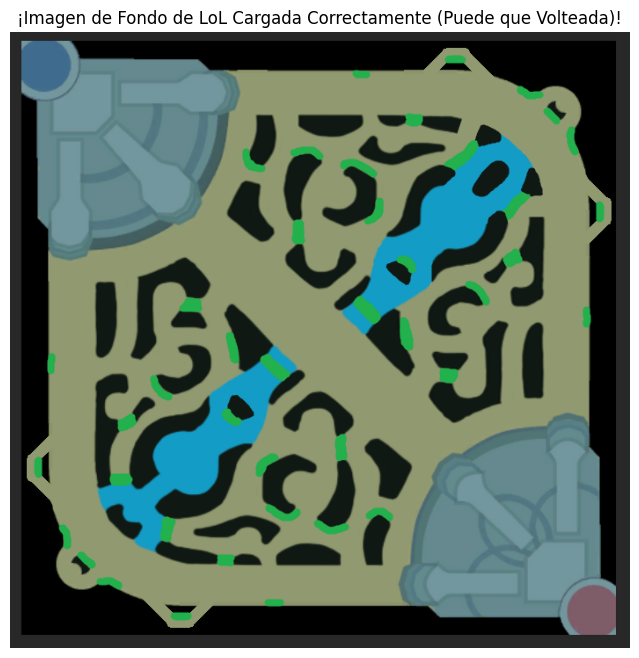

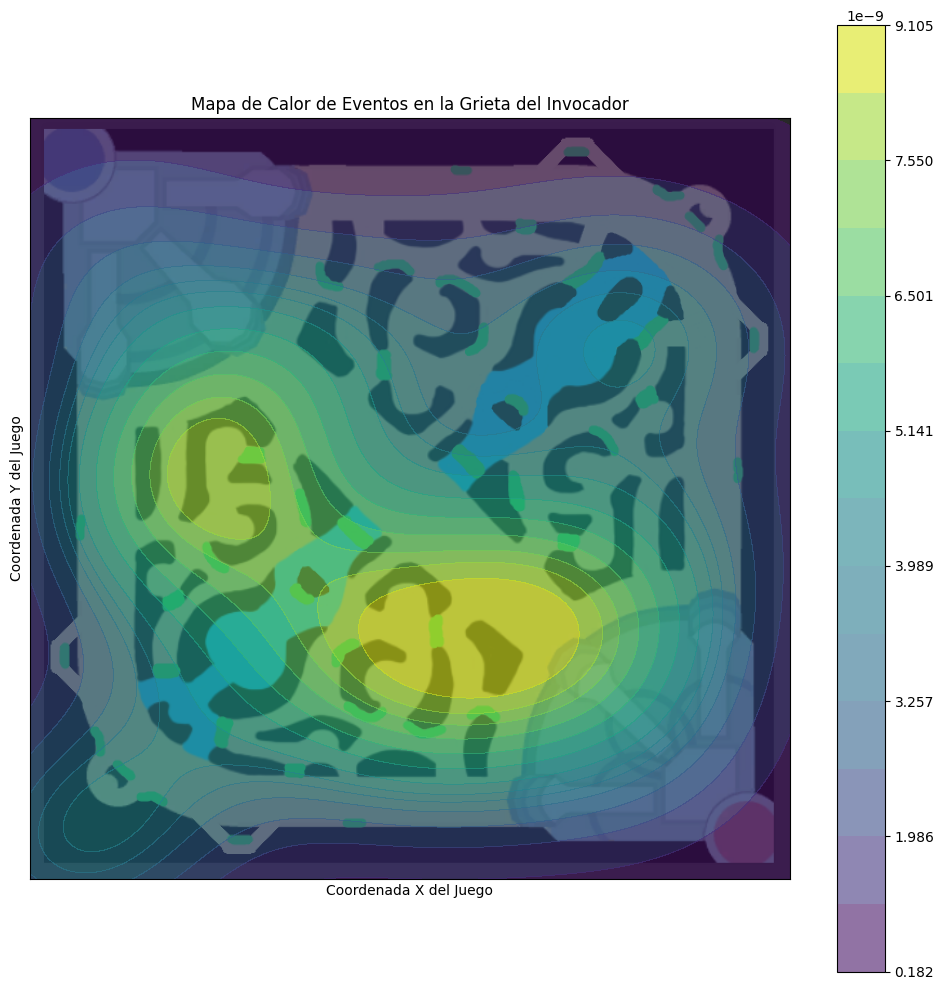

In [ ]:
partida_lilia_mas_duracion = ranked_df[ranked_df['champion'] == 'Lillia'].sort_values(by='game_duration', ascending=False).head(1)
match_id=partida_lilia_mas_duracion['match_id'].values[0]
puuid='CEHgYdCxn7fQTZUFFQOvV9RP1Zq41i9mCDwhQ7RaETA64oP6CAgMGQtuz1sL0hWLjtkFErNuOf5gXw'
api_key='RGAPI-5be6d7d5-f46c-4148-83d4-05e3ca821934'
plot_lol_heatmap_on_map(coordenadas_lol(match_id, puuid, api_key), '/content/drive/MyDrive/Imagenmapalol.png')

✅ Imagen del mapa cargada correctamente desde Drive: /content/drive/MyDrive/Imagenmapalol.png
Dimensiones de la imagen de fondo: (701, 705, 3)


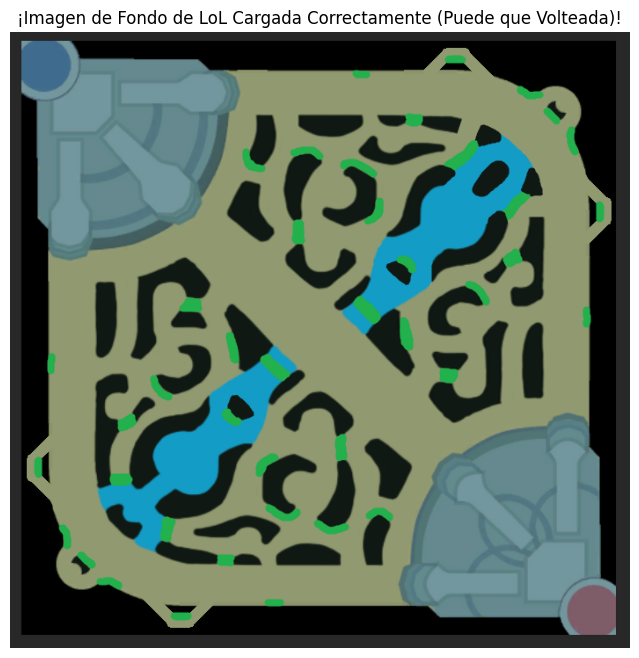

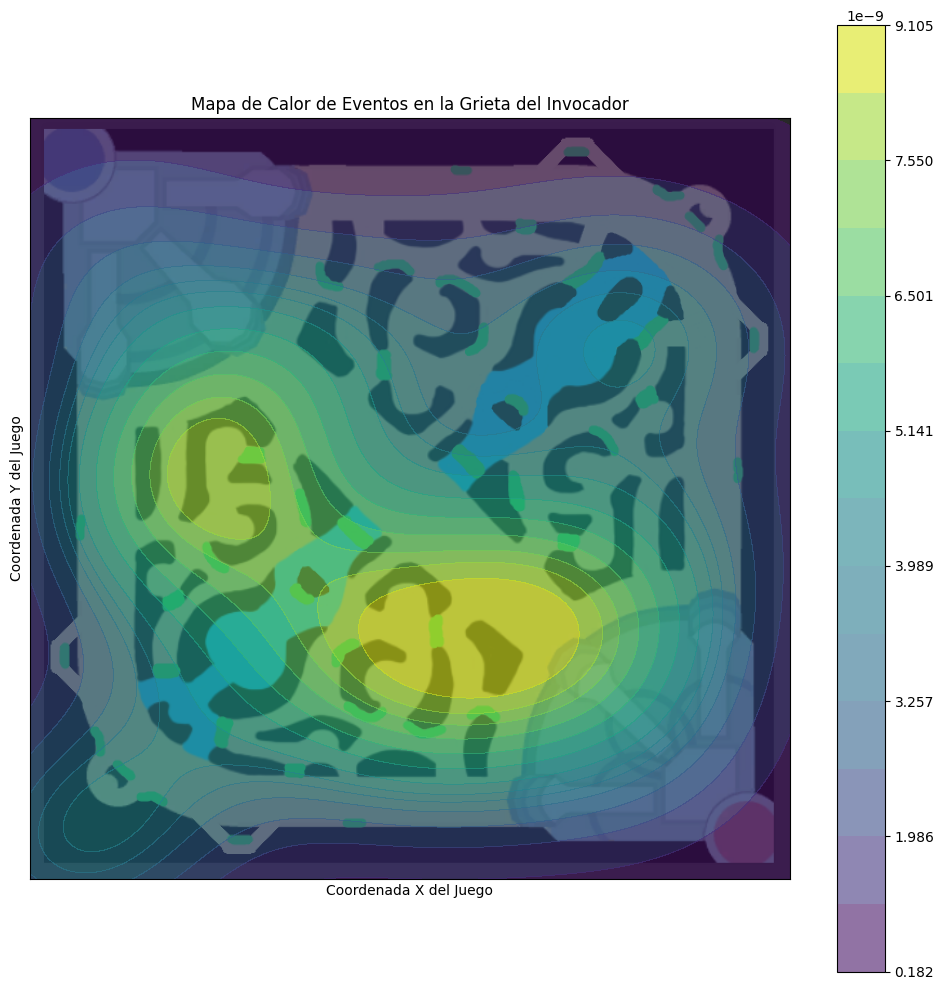

In [ ]:
partida_lilia_mas_duracion = ranked_df[ranked_df['champion'] == 'Lillia'].sort_values(by='game_duration', ascending=False).head(1)
match_id=partida_lilia_mas_duracion['match_id'].values[0]
puuid='CEHgYdCxn7fQTZUFFQOvV9RP1Zq41i9mCDwhQ7RaETA64oP6CAgMGQtuz1sL0hWLjtkFErNuOf5gXw'
api_key='RGAPI-5be6d7d5-f46c-4148-83d4-05e3ca821934'
plot_lol_heatmap_on_map(coordenadas_lol(match_id, puuid, api_key), '/content/drive/MyDrive/Imagenmapalol.png')

Mounted at /content/drive
🔍 Buscando imagen en: /content/drive/MyDrive/Imagenmapalol.png
✅ Imagen cargada. Dimensiones: (350, 352, 3)


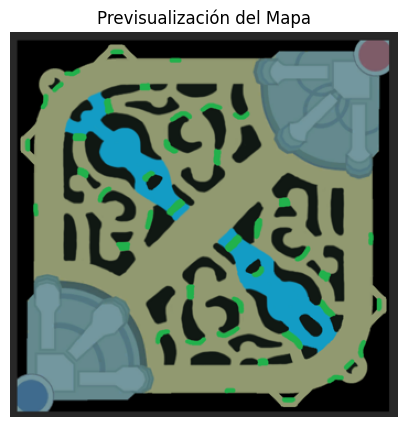

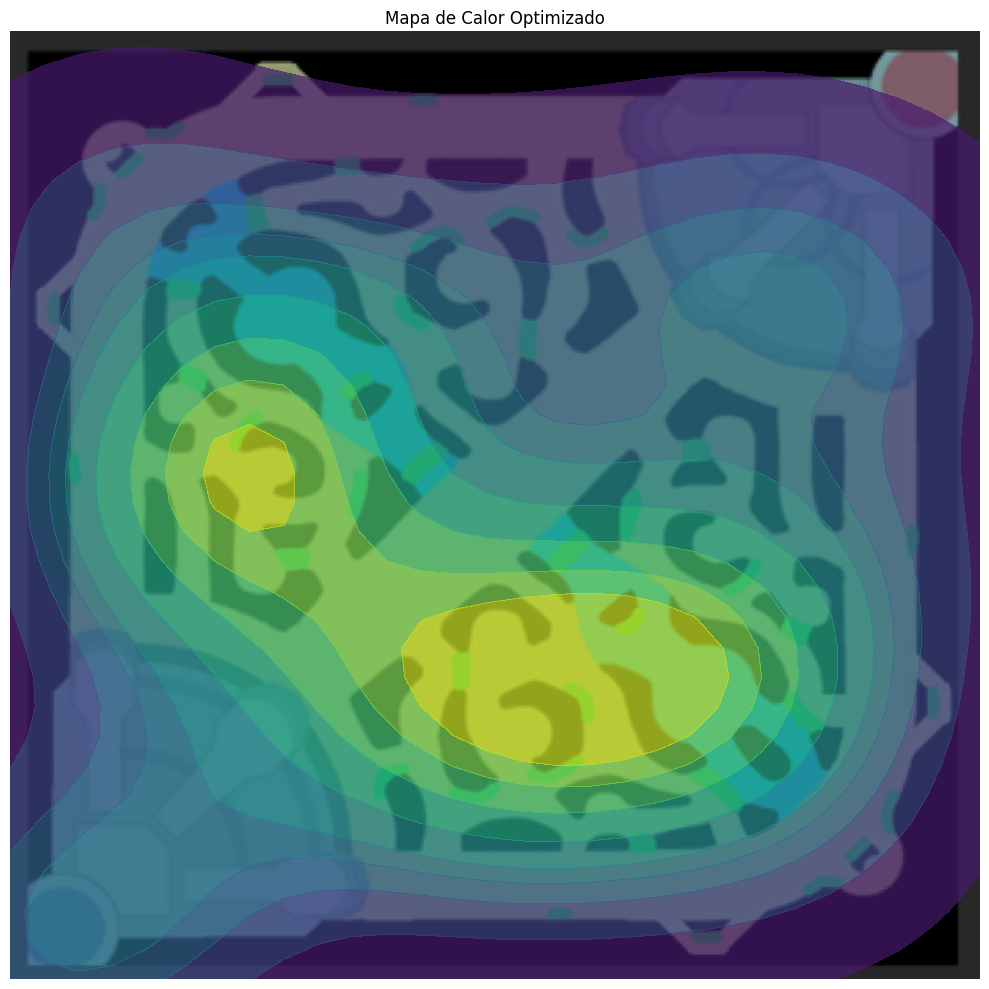

✅ Visualización completada


In [ ]:
partida_lilia_mas_duracion = ranked_df[ranked_df['champion'] == 'Lillia'].sort_values(by='game_duration', ascending=False).head(1)
match_id=partida_lilia_mas_duracion['match_id'].values[0]
puuid='CEHgYdCxn7fQTZUFFQOvV9RP1Zq41i9mCDwhQ7RaETA64oP6CAgMGQtuz1sL0hWLjtkFErNuOf5gXw'
api_key='RGAPI-5be6d7d5-f46c-4148-83d4-05e3ca821934'
plot_lol_heatmap_optimized(coordenadas_lol(match_id, puuid, api_key), '/content/drive/MyDrive/Imagenmapalol.png')

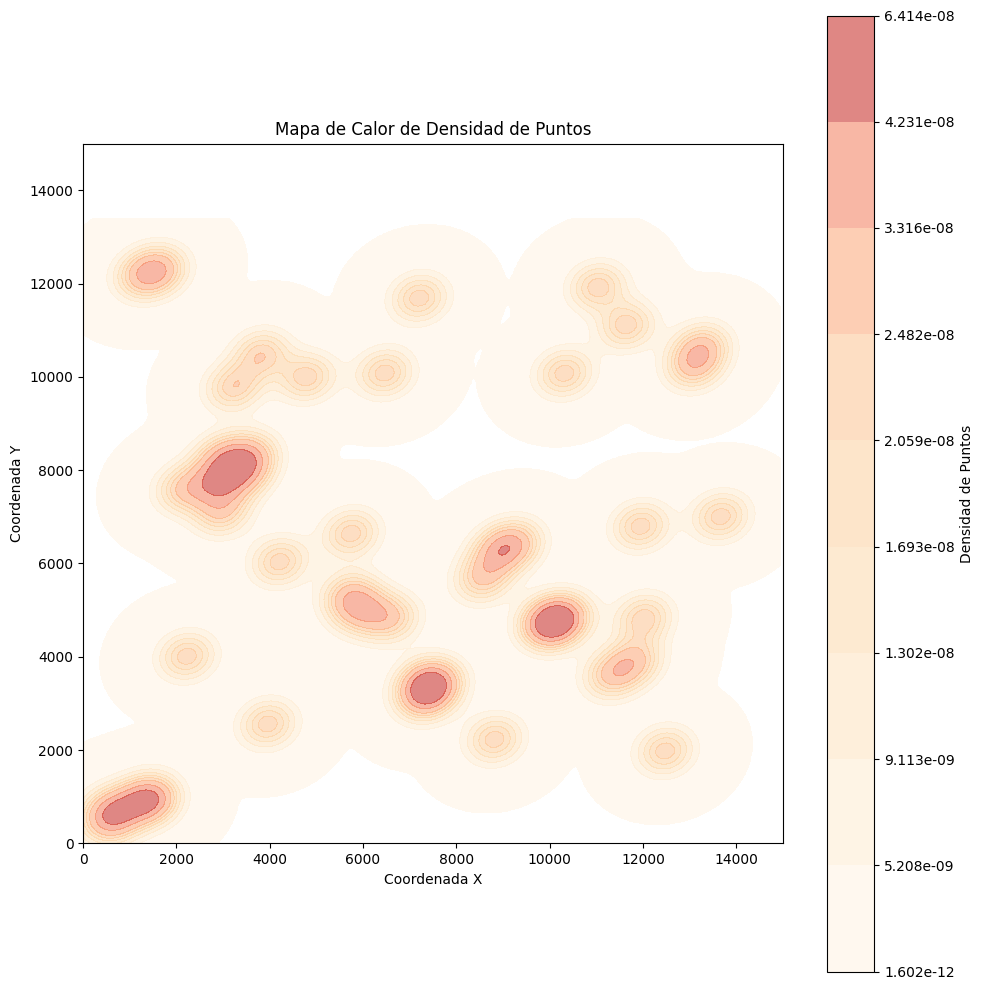

In [ ]:
partida_lilia_mas_duracion = ranked_df[ranked_df['champion'] == 'Lillia'].sort_values(by='game_duration', ascending=False).head(1)
match_id=partida_lilia_mas_duracion['match_id'].values[0]
puuid='CEHgYdCxn7fQTZUFFQOvV9RP1Zq41i9mCDwhQ7RaETA64oP6CAgMGQtuz1sL0hWLjtkFErNuOf5gXw'
api_key='RGAPI-5be6d7d5-f46c-4148-83d4-05e3ca821934'
plot_heatmap_no_background(coordenadas_lol(match_id, puuid, api_key))

✅ Imagen de fondo cargada correctamente.
Dimensiones de la imagen: (701, 705, 3) (alto, ancho, canales)


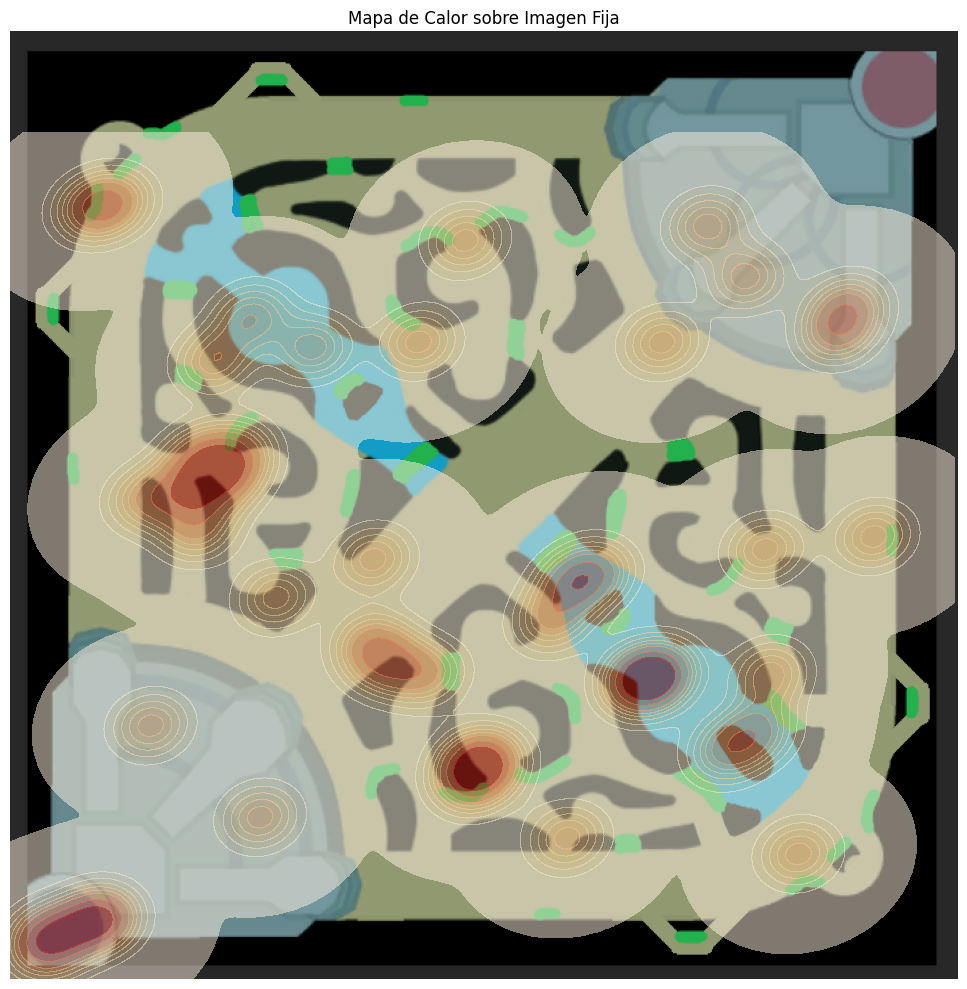

In [ ]:
partida_lilia_mas_duracion = ranked_df[ranked_df['champion'] == 'Lillia'].sort_values(by='game_duration', ascending=False).head(1)
match_id=partida_lilia_mas_duracion['match_id'].values[0]
puuid='CEHgYdCxn7fQTZUFFQOvV9RP1Zq41i9mCDwhQ7RaETA64oP6CAgMGQtuz1sL0hWLjtkFErNuOf5gXw'
api_key='RGAPI-5be6d7d5-f46c-4148-83d4-05e3ca821934'
plot_lol_heatmap_fixed_background(coordenadas_lol(match_id, puuid, api_key), '/content/drive/MyDrive/Imagenmapalol.png')

✅ Imagen del mapa cargada correctamente desde: /content/drive/MyDrive/Imagenmapalol.png
Dimensiones de la imagen de fondo: (701, 705, 3)


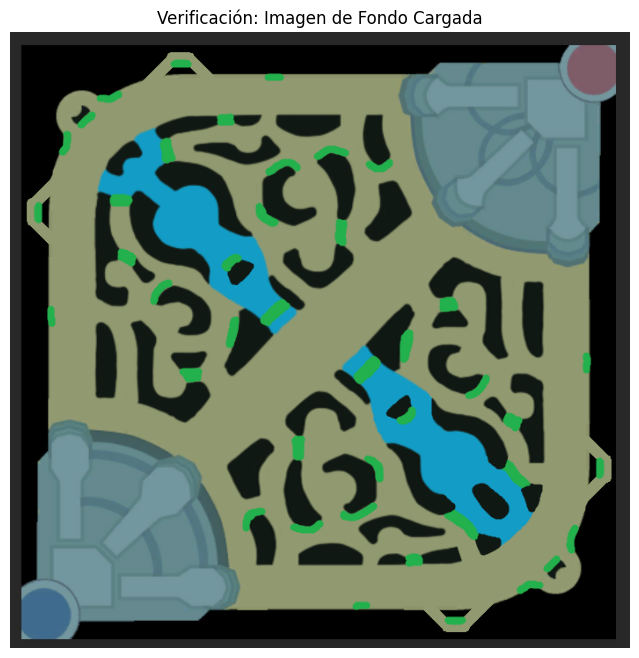

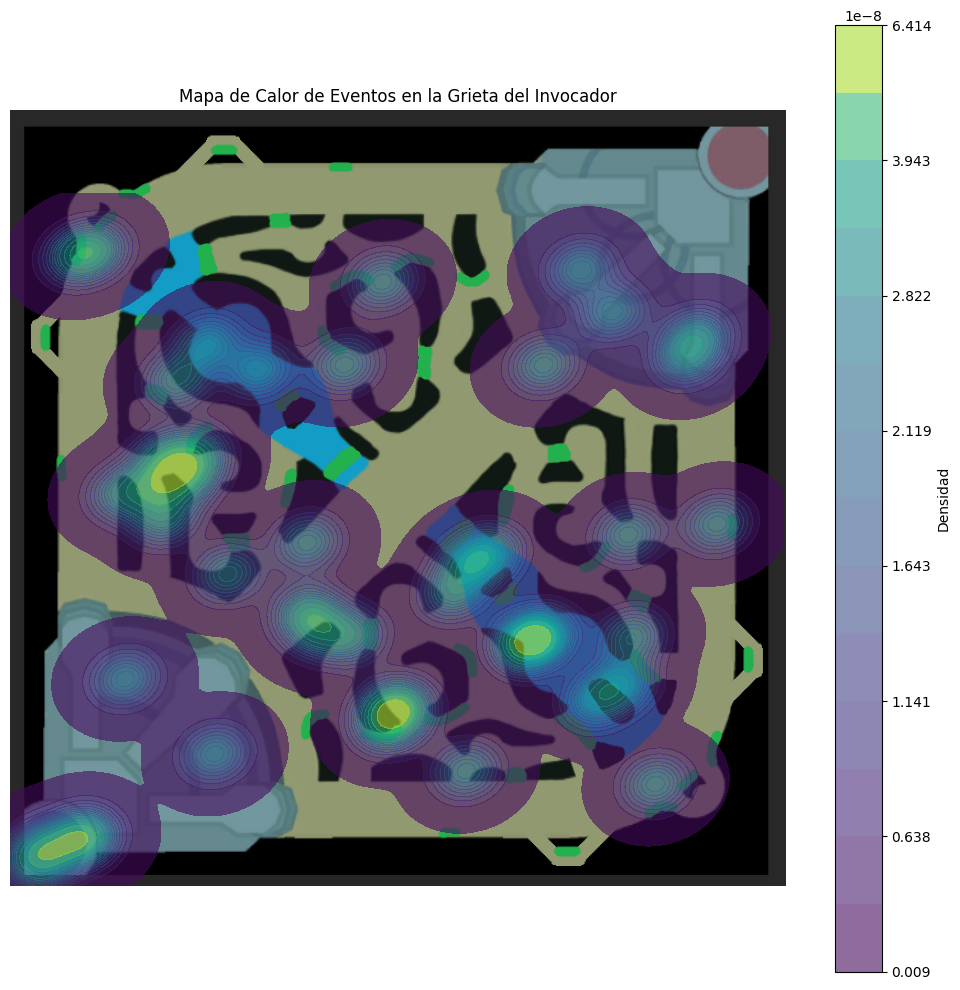

In [ ]:
partida_lilia_mas_duracion = ranked_df[ranked_df['champion'] == 'Lillia'].sort_values(by='game_duration', ascending=False).head(1)
match_id=partida_lilia_mas_duracion['match_id'].values[0]
puuid='CEHgYdCxn7fQTZUFFQOvV9RP1Zq41i9mCDwhQ7RaETA64oP6CAgMGQtuz1sL0hWLjtkFErNuOf5gXw'
api_key='RGAPI-5be6d7d5-f46c-4148-83d4-05e3ca821934'
plot_lol_heatmap_on_map2_fixed(coordenadas_lol(match_id, puuid, api_key), '/content/drive/MyDrive/Imagenmapalol.png')

✅ Imagen del mapa cargada correctamente desde: /content/drive/MyDrive/Imagenmapalol.png
Dimensiones de la imagen de fondo: (701, 705, 3)


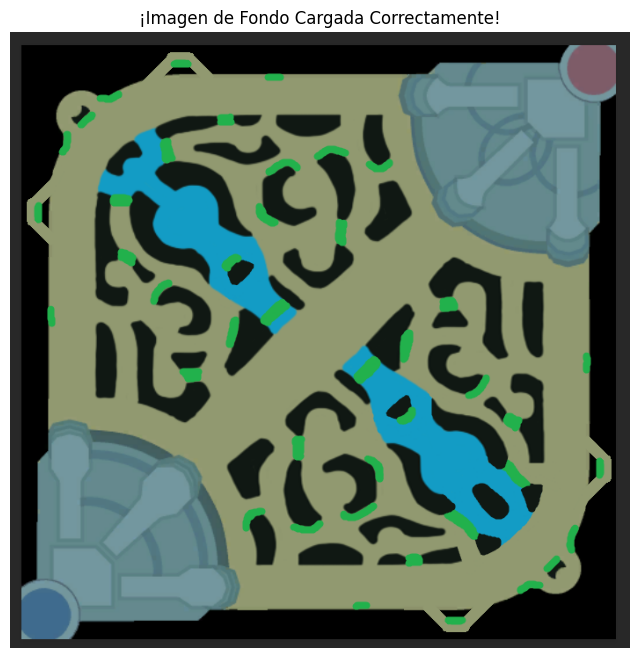

Número de puntos de datos: 45
Rango original X: [593, 13669]
Rango original Y: [464, 12313]
Las coordenadas Y han sido invertidas para coincidir con el origen 'upper' de la imagen.
Dimensiones de la imagen para escalado: Ancho=705, Alto=701
Rango escalado X: [27.871, 642.443]
Rango escalado Y: [125.57246666666674, 679.3157333333334]
Forma del heatmap generado: (150, 150)
Valor máximo en el heatmap: 1.0


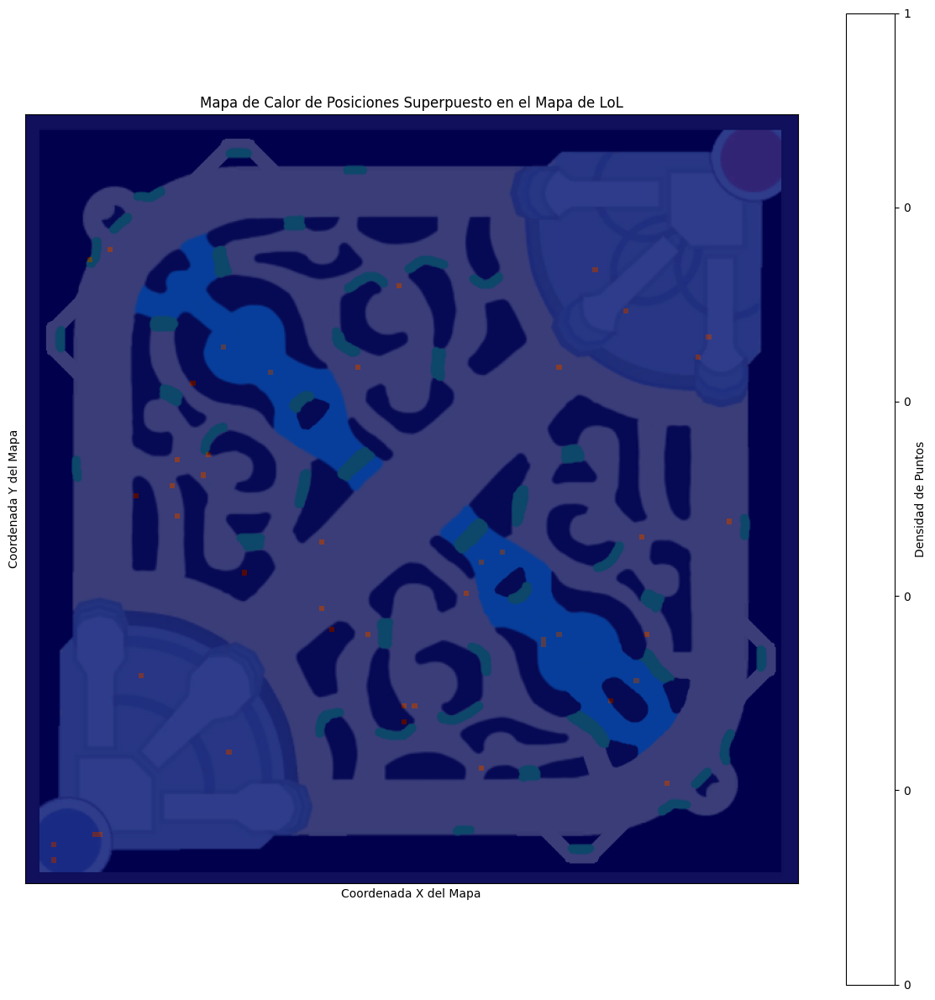

In [ ]:
partida_lilia_mas_duracion = ranked_df[ranked_df['champion'] == 'Lillia'].sort_values(by='game_duration', ascending=False).head(1)
match_id=partida_lilia_mas_duracion['match_id'].values[0]
puuid='CEHgYdCxn7fQTZUFFQOvV9RP1Zq41i9mCDwhQ7RaETA64oP6CAgMGQtuz1sL0hWLjtkFErNuOf5gXw'
api_key='RGAPI-5be6d7d5-f46c-4148-83d4-05e3ca821934'
plot_lol_heatmap_histogram(coordenadas_lol(match_id, puuid, api_key), '/content/drive/MyDrive/Imagenmapalol.png')

###Comparación

In [ ]:
stats_lillia={
    'CS/min': 6.5,
    'Daño/min': 733,
    'Oro/min': 420,
    'Wards/min': 0.20,
    'KDA': (6.5, 5.3, 8.4)
}

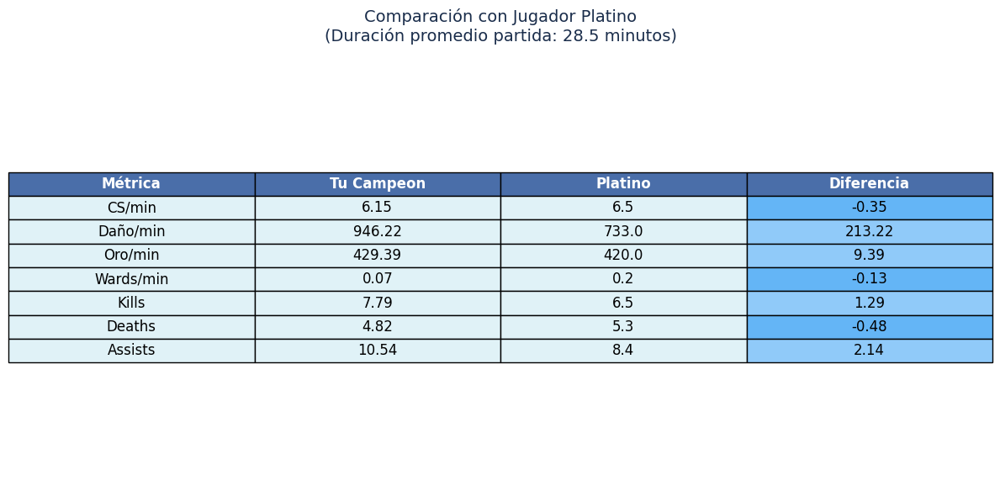

In [ ]:
comparar_stats(lillia_ranked, stats_lillia)

###Winrate

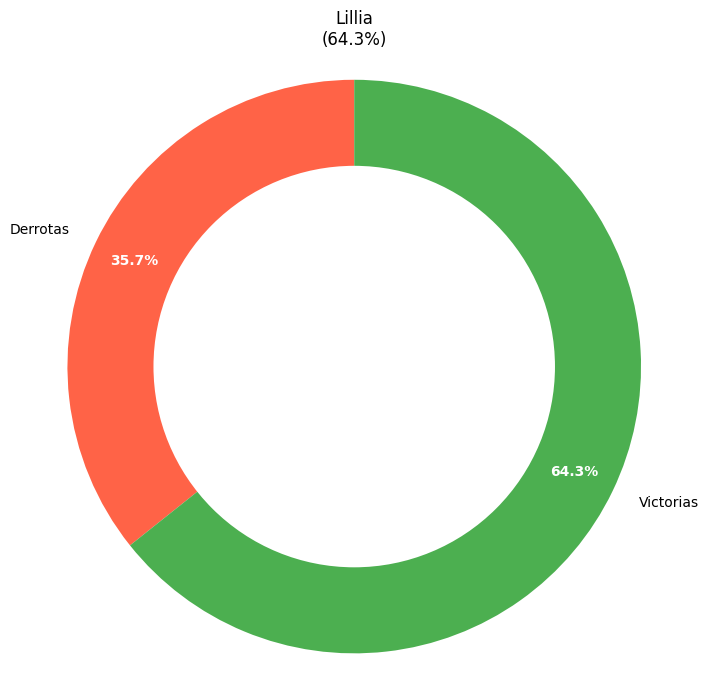

In [ ]:
plot_champion_winrate_donut_simplified(lillia_ranked, champion_name='Lillia')

###Correlación

In [ ]:
plot_correlation_heatmap_azul(lillia_ranked, metricas)

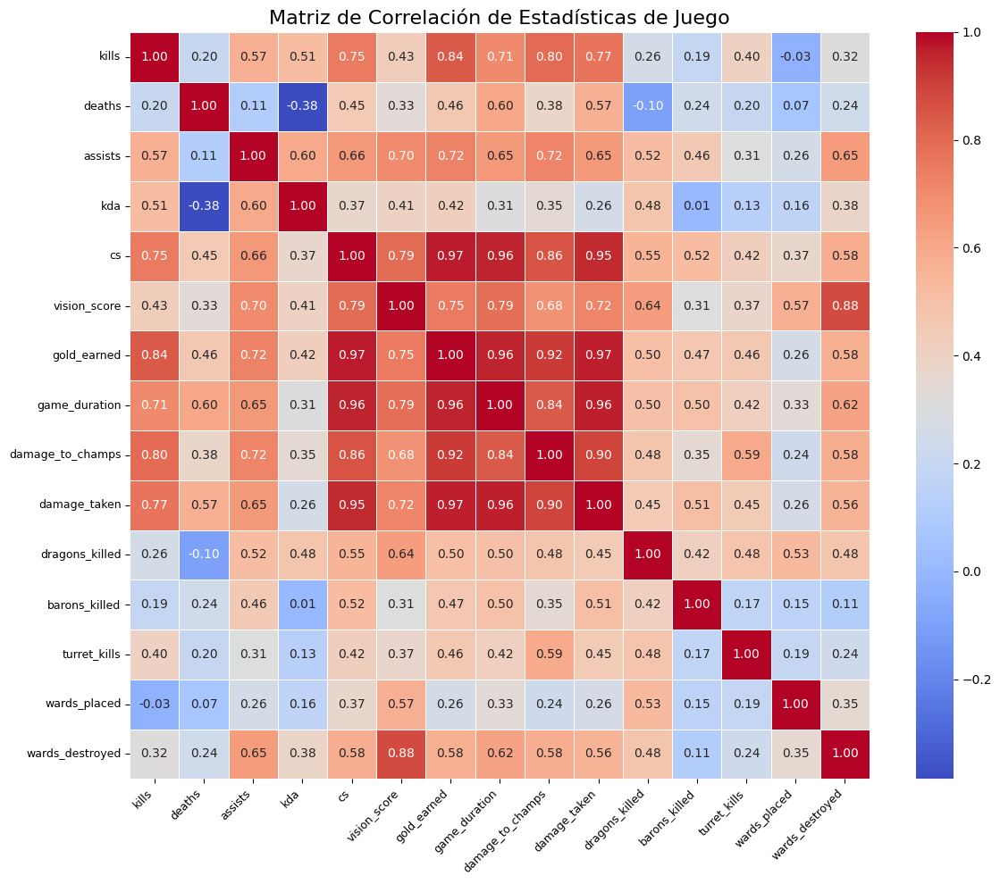

In [ ]:
plot_correlation_heatmap(lillia_ranked, metricas)

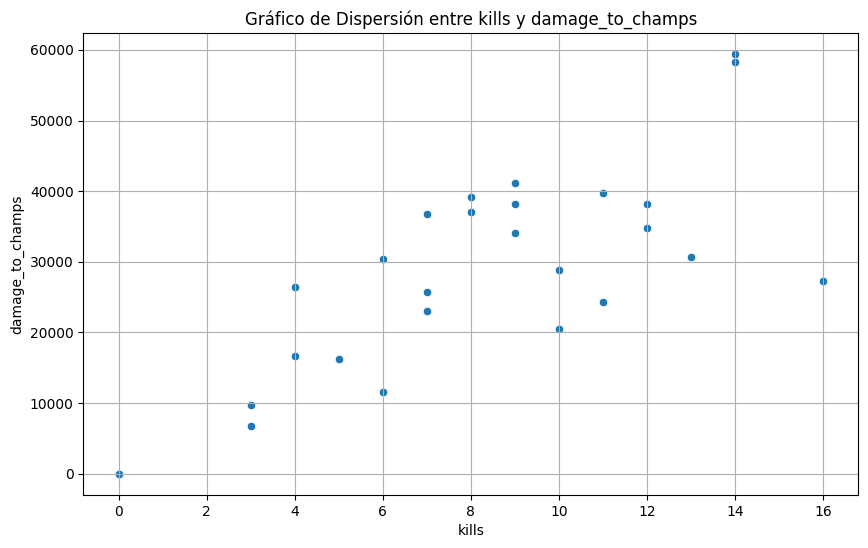

In [ ]:
comparar_columnas_df(lillia_ranked,'kills','damage_to_champs')

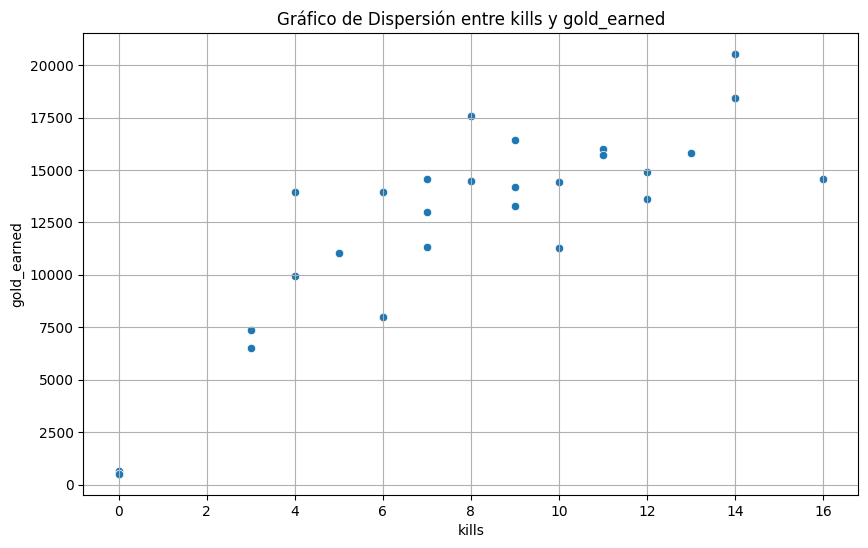

In [ ]:
comparar_columnas_df(lillia_ranked,'kills','gold_earned')

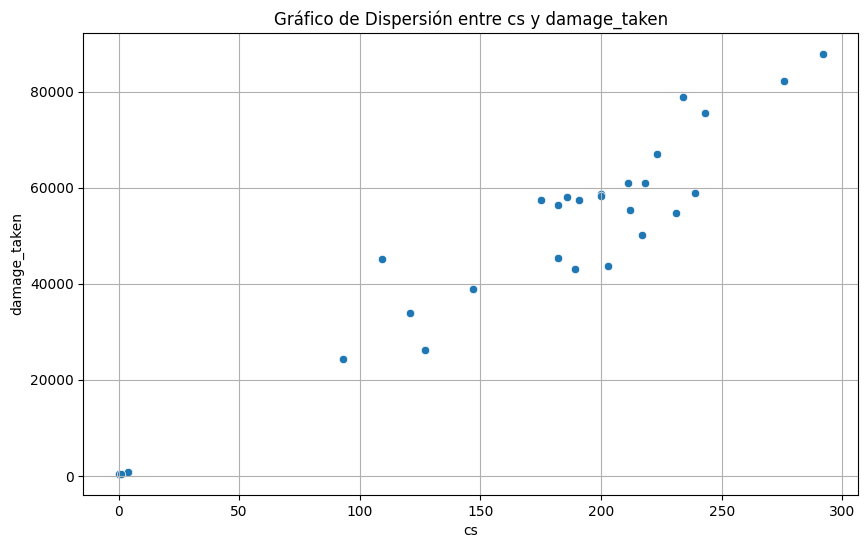

In [ ]:
comparar_columnas_df(lillia_ranked,'cs','damage_taken')

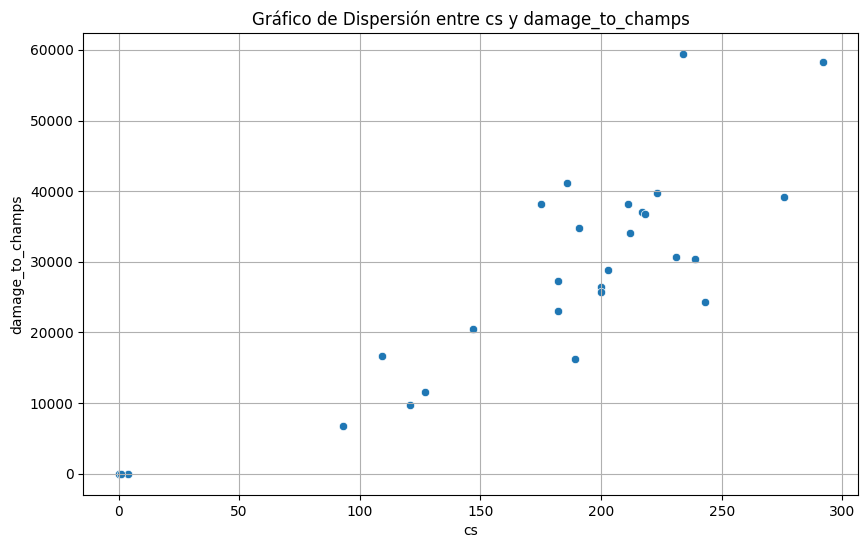

In [ ]:
comparar_columnas_df(lillia_ranked,'cs','damage_to_champs')

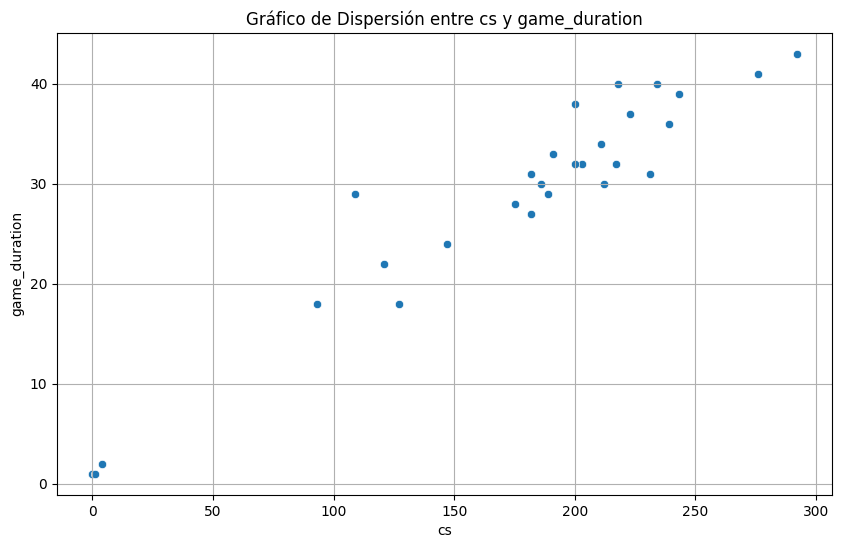

In [ ]:
comparar_columnas_df(lillia_ranked,'cs','game_duration')

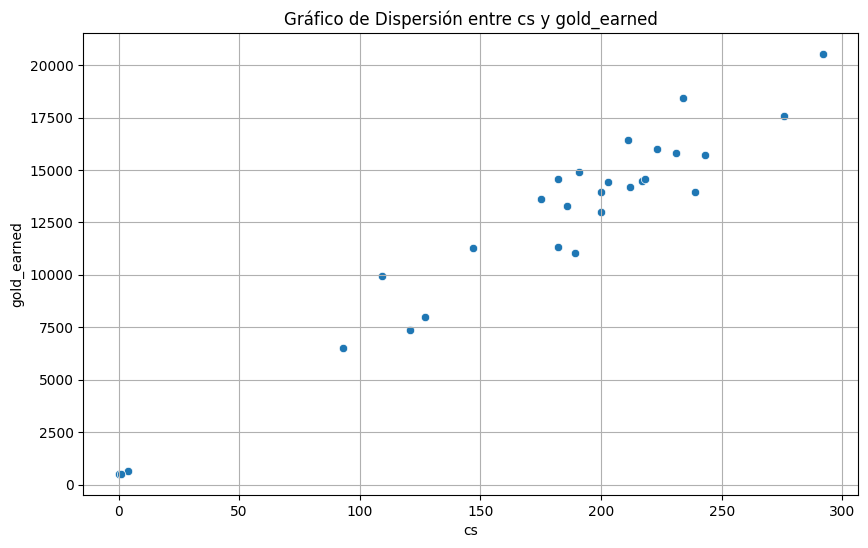

In [ ]:
comparar_columnas_df(lillia_ranked,'cs','gold_earned')

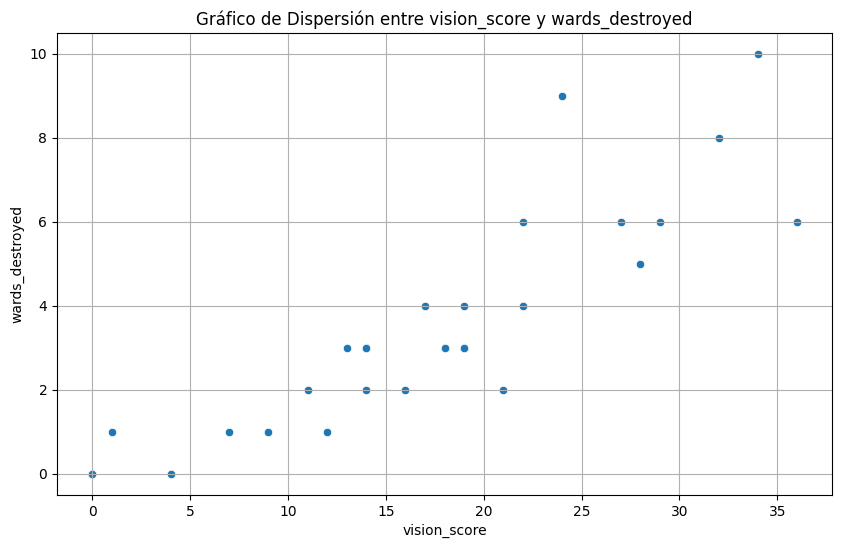

In [ ]:
comparar_columnas_df(lillia_ranked,'vision_score','wards_destroyed')

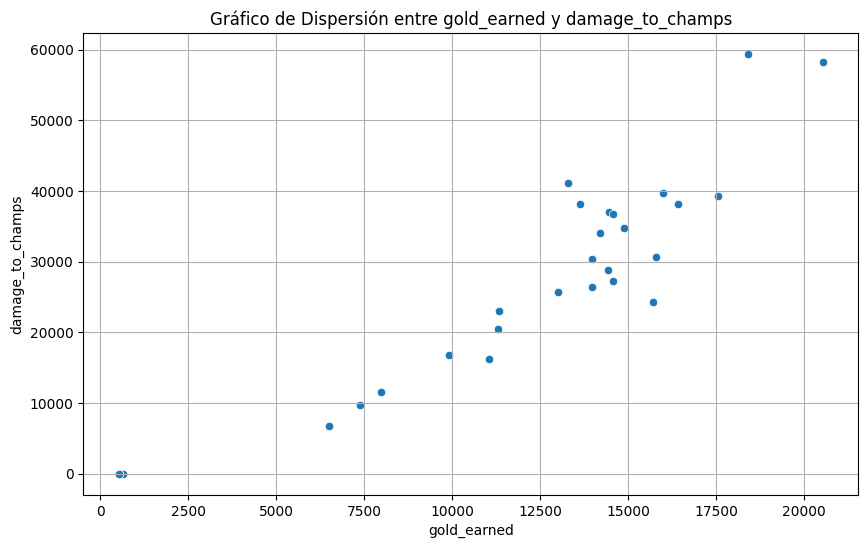

In [ ]:
comparar_columnas_df(lillia_ranked,'gold_earned','damage_to_champs')

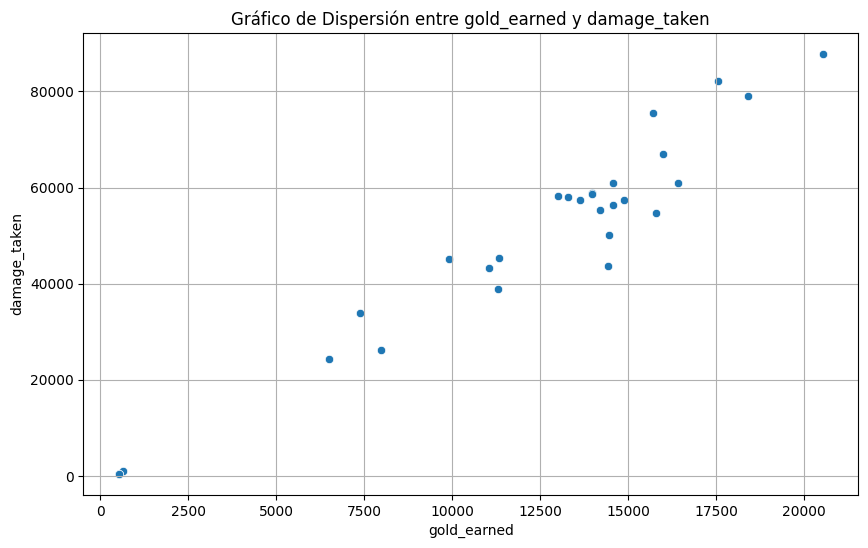

In [ ]:
comparar_columnas_df(lillia_ranked,'gold_earned','damage_taken')

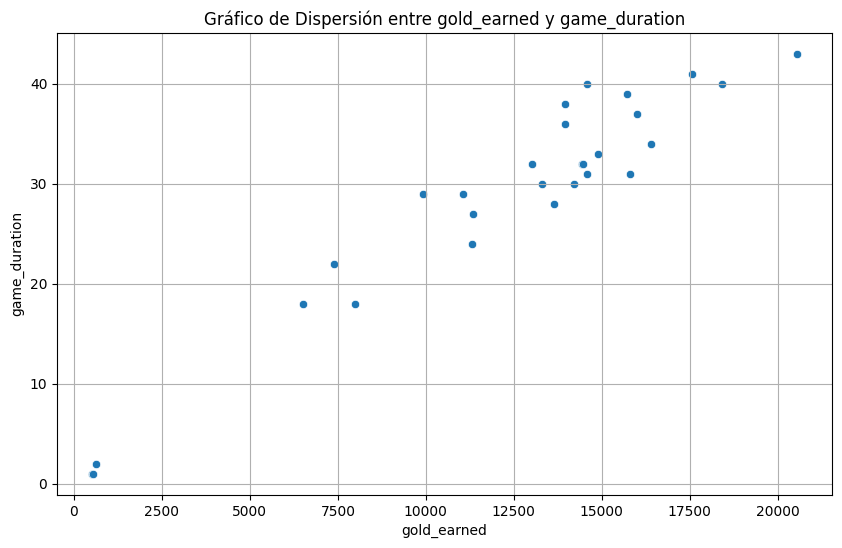

In [ ]:
comparar_columnas_df(lillia_ranked,'gold_earned','game_duration')

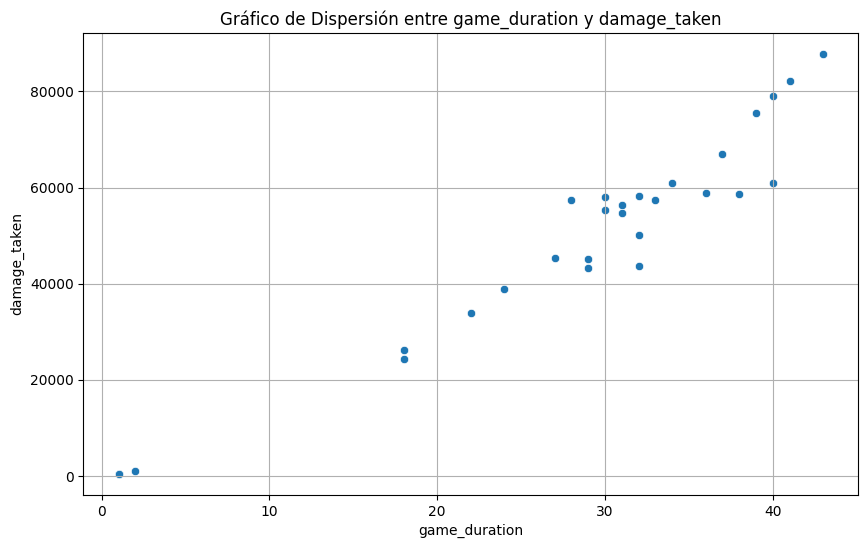

In [ ]:
comparar_columnas_df(lillia_ranked,'game_duration','damage_taken')

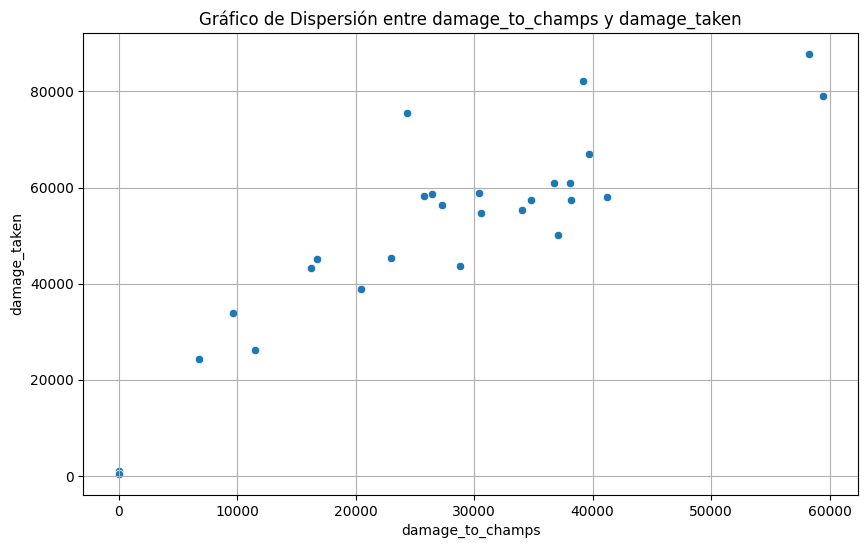

In [ ]:
comparar_columnas_df(lillia_ranked,'damage_to_champs','damage_taken')

###Perfil de Rendimiento

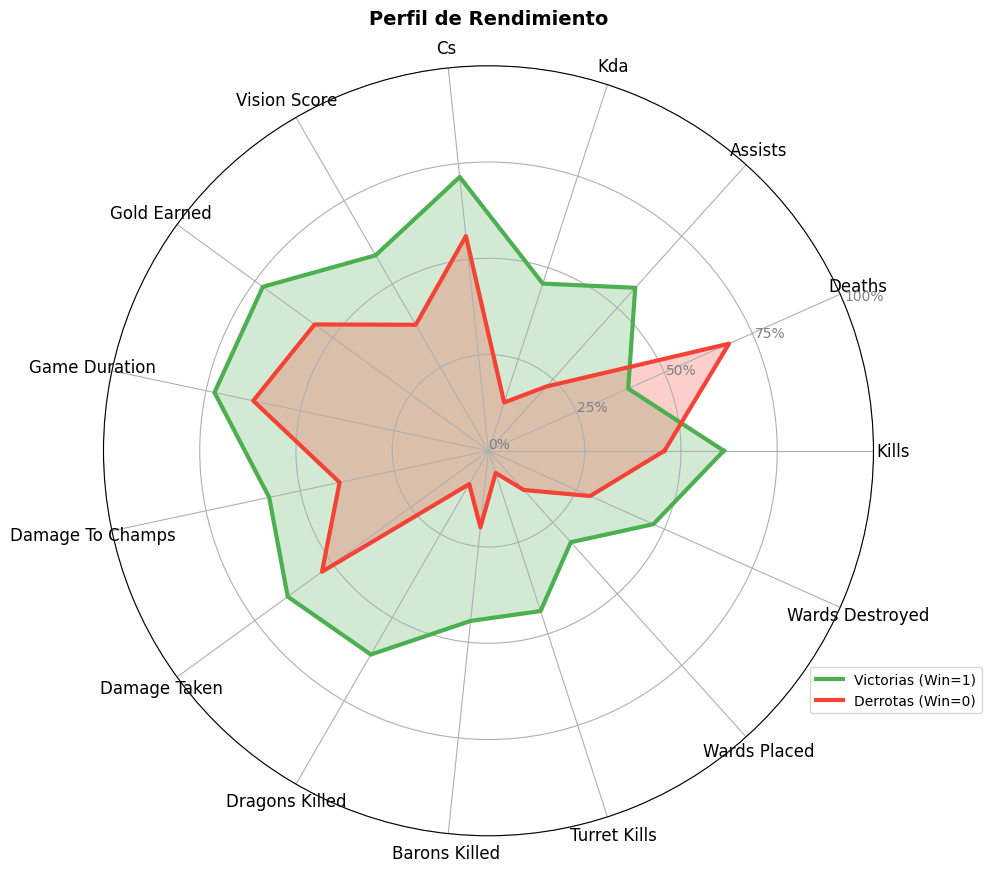

In [ ]:
plot_performance_radar_chart_standalone(lillia_ranked, metricas)

###Comparación con el Winrate

<ipython-input-28-ca8af1589229>:26: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

<ipython-input-28-ca8af1589229>:45: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-28-ca8af1589229>:45: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-28-ca8af1589229>:45: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-28-ca8af1589229>:45: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the

DEBUG: Columna 'win' convertida a tipo 'category'.


<ipython-input-28-ca8af1589229>:45: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-28-ca8af1589229>:45: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-28-ca8af1589229>:45: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-28-ca8af1589229>:45: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-28-ca8af1589229>:45: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and wi

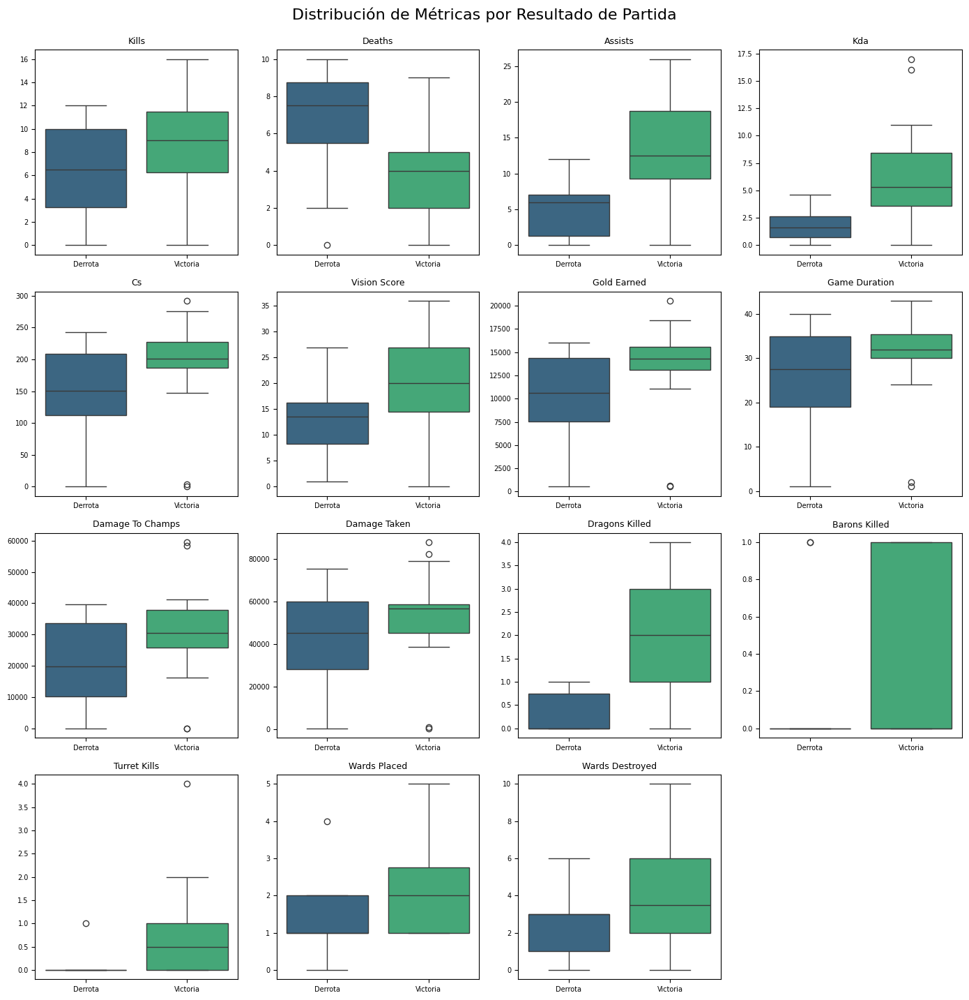

In [ ]:
plot_metric_boxplots_by_win_outcome(lillia_ranked)

<ipython-input-32-50e8ba909eaa>:17: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



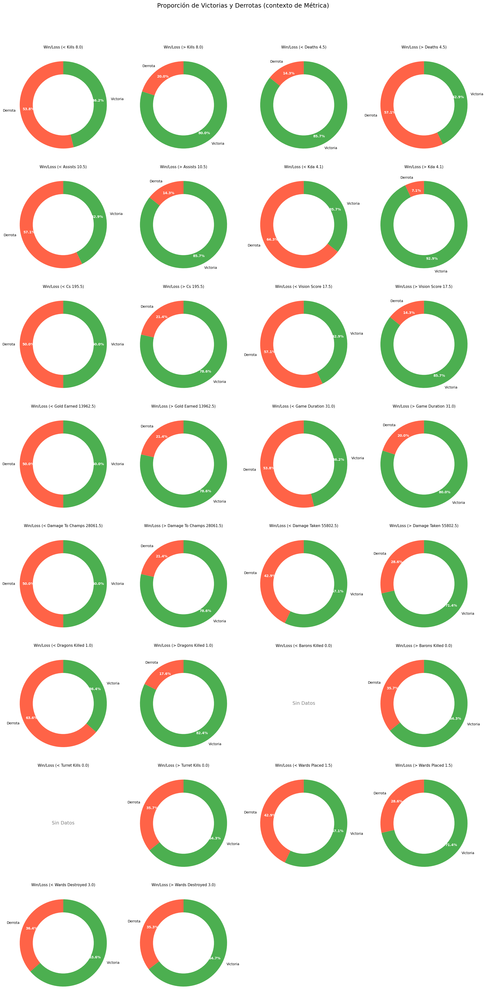

In [ ]:
plot_contextual_win_loss_donut_charts(lillia_ranked, metricas)

<ipython-input-27-28b7a8afa8af>:15: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



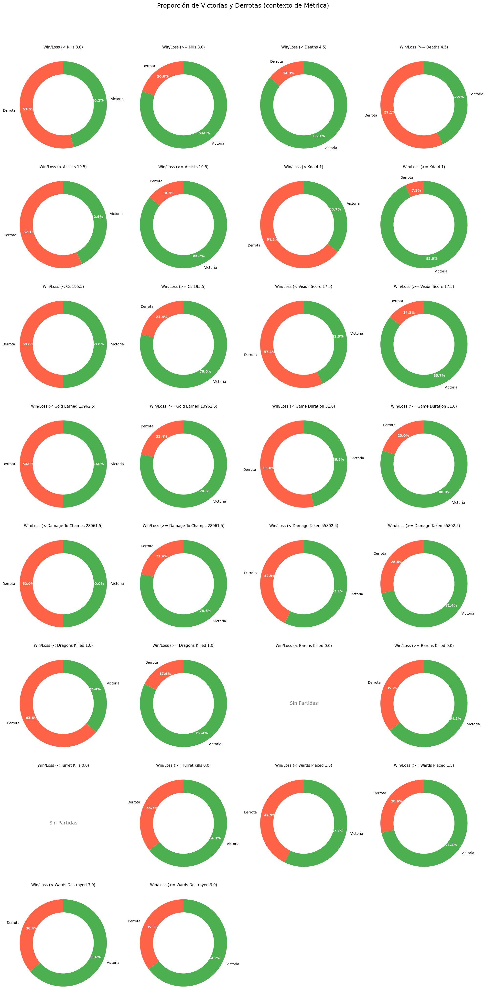

In [ ]:
plot_global_win_loss_donut_charts(lillia_ranked, metricas)

<ipython-input-26-03aa5cd79986>:22: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



DEBUG: Columna 'win' convertida a tipo 'category'.


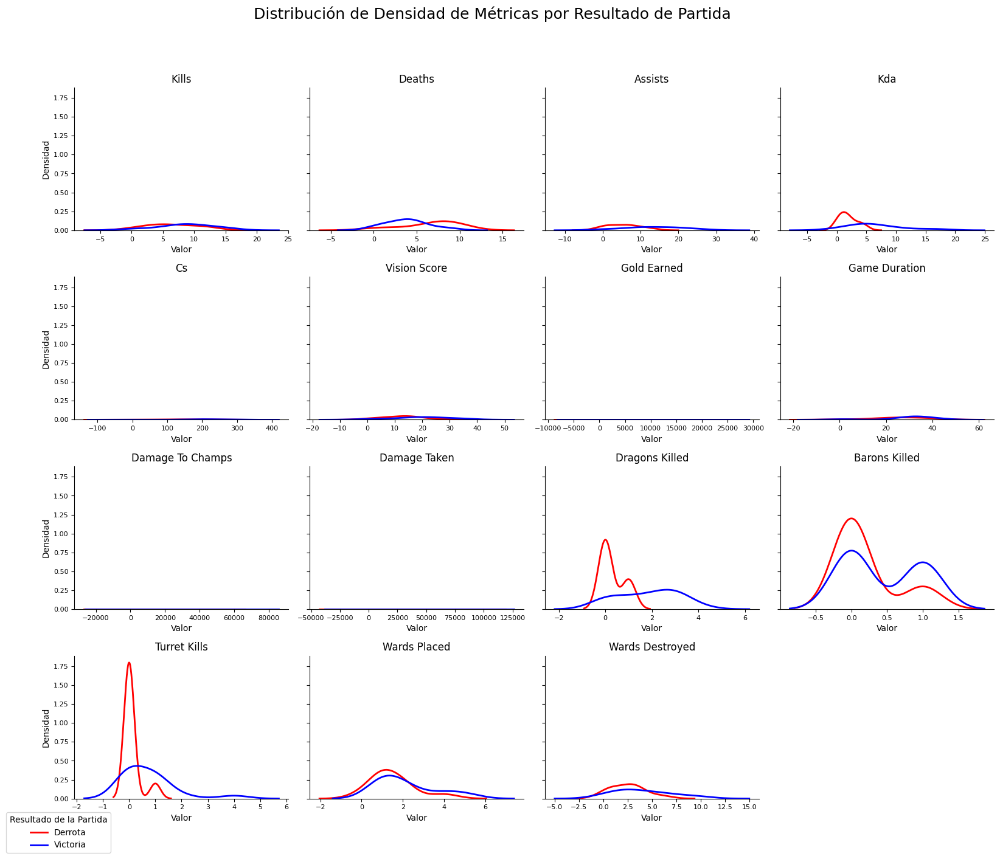

In [ ]:
plot_metric_density_by_win_outcome(lillia_ranked)

##Analisis Jarvan IV

In [ ]:
#DataFrame solo de Jarvan ranked
Jarvan_ranked = ranked_df[ranked_df['champion'] == 'JarvanIV']

###Mapa

In [ ]:
partida_Jarvan_mas_duracion = ranked_df[ranked_df['champion'] == 'JarvanIV'].sort_values(by='game_duration', ascending=False).head(1)
partida_Jarvan_mas_duracion

,match_id,champion,win,kills,deaths,assists,kda,cs,vision_score,gold_earned,...,team_position,items,summoner_spells,damage_to_champs,damage_taken,dragons_killed,barons_killed,turret_kills,wards_placed,wards_destroyed
65,LA1_1614515481,JarvanIV,0,11,6,18,4.83,231,27,17543,...,JUNGLE,"[6610, 6692, 3174, 3110, 3065, 3075, 3364]","[11, 4]",32493,62342,2,0,2,1,13


✅ Imagen del mapa cargada correctamente desde Drive: /content/drive/MyDrive/Imagenmapalol.png
Dimensiones de la imagen de fondo: (701, 705, 3)


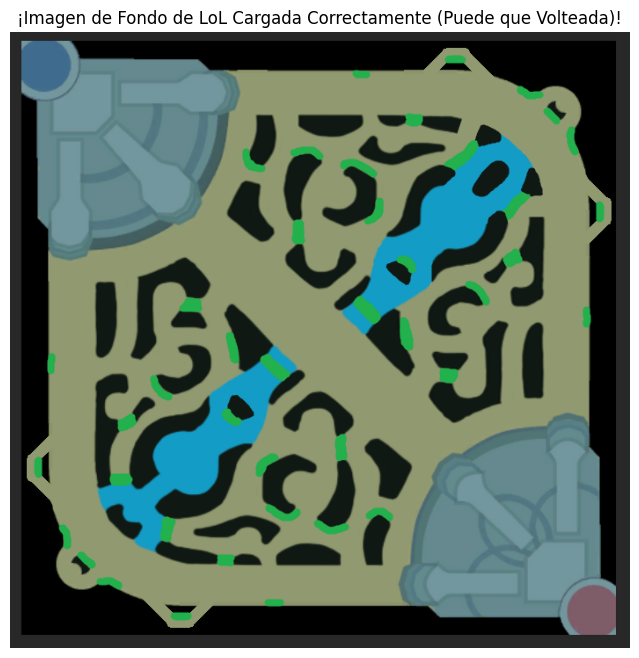

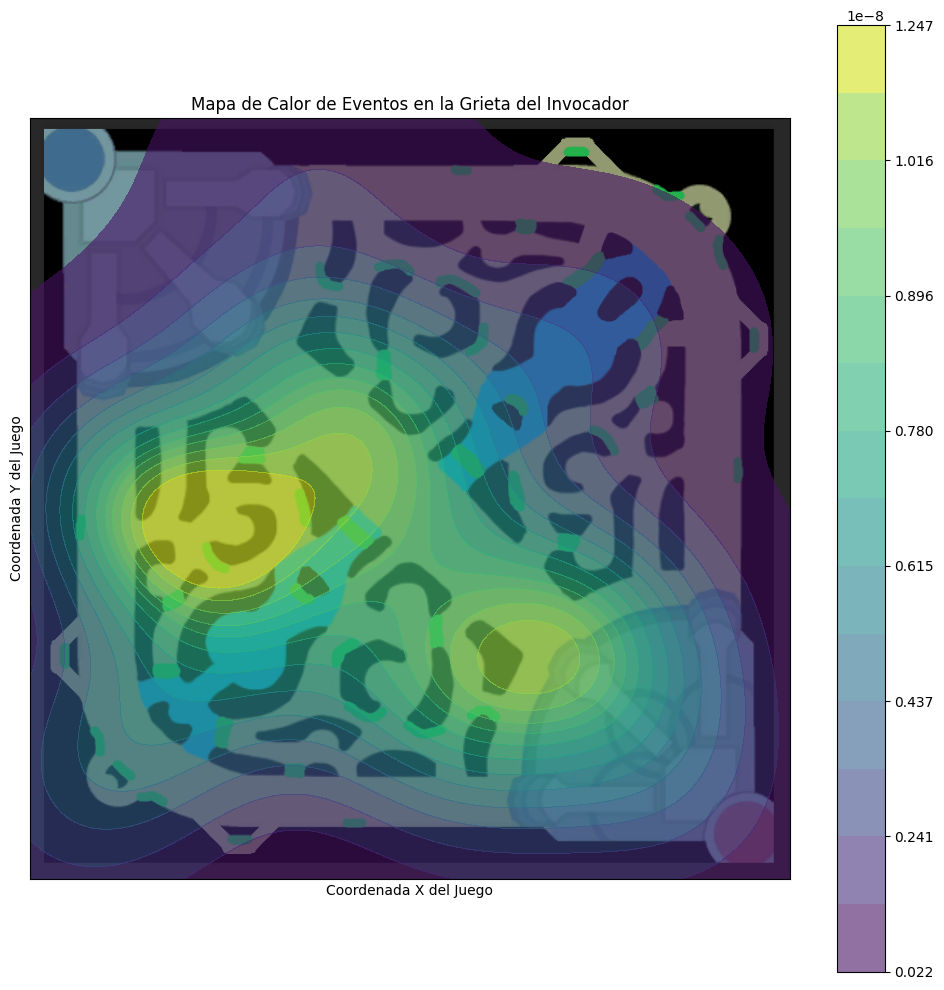

In [ ]:
partida_Jarvan_mas_duracion = ranked_df[ranked_df['champion'] == 'JarvanIV'].sort_values(by='game_duration', ascending=False).head(1)
match_id=partida_Jarvan_mas_duracion['match_id'].values[0]
puuid='CEHgYdCxn7fQTZUFFQOvV9RP1Zq41i9mCDwhQ7RaETA64oP6CAgMGQtuz1sL0hWLjtkFErNuOf5gXw'
api_key='RGAPI-5be6d7d5-f46c-4148-83d4-05e3ca821934'
plot_lol_heatmap_on_map(coordenadas_lol(match_id, puuid, api_key), '/content/drive/MyDrive/Imagenmapalol.png')

Mounted at /content/drive
🔍 Buscando imagen en: /content/drive/MyDrive/Imagenmapalol.png
✅ Imagen cargada. Dimensiones: (350, 352, 3)


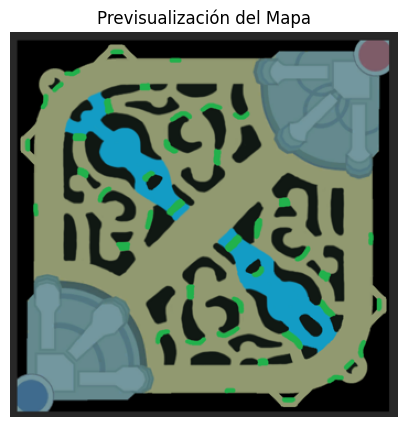

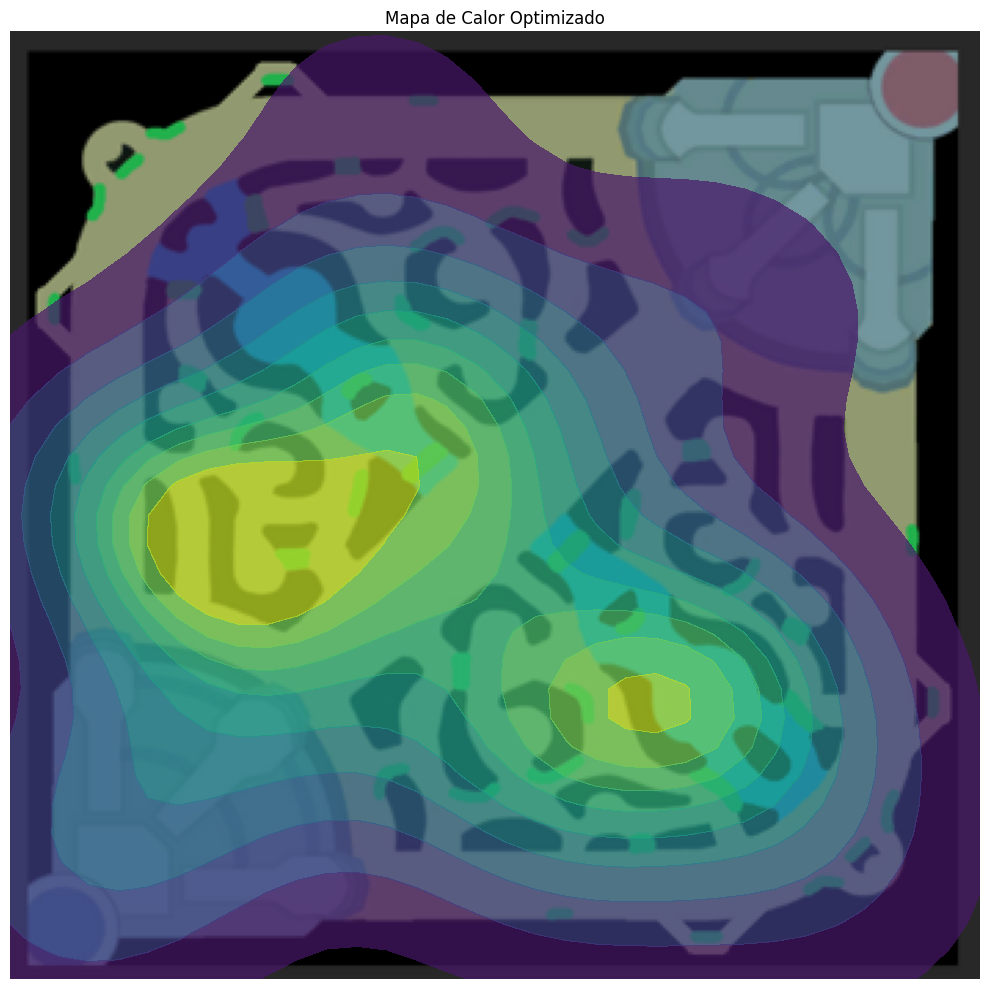

✅ Visualización completada


In [ ]:
partida_Jarvan_mas_duracion = ranked_df[ranked_df['champion'] == 'JarvanIV'].sort_values(by='game_duration', ascending=False).head(1)
match_id=partida_Jarvan_mas_duracion['match_id'].values[0]
puuid='CEHgYdCxn7fQTZUFFQOvV9RP1Zq41i9mCDwhQ7RaETA64oP6CAgMGQtuz1sL0hWLjtkFErNuOf5gXw'
api_key='RGAPI-5be6d7d5-f46c-4148-83d4-05e3ca821934'
plot_lol_heatmap_optimized(coordenadas_lol(match_id, puuid, api_key), '/content/drive/MyDrive/Imagenmapalol.png')

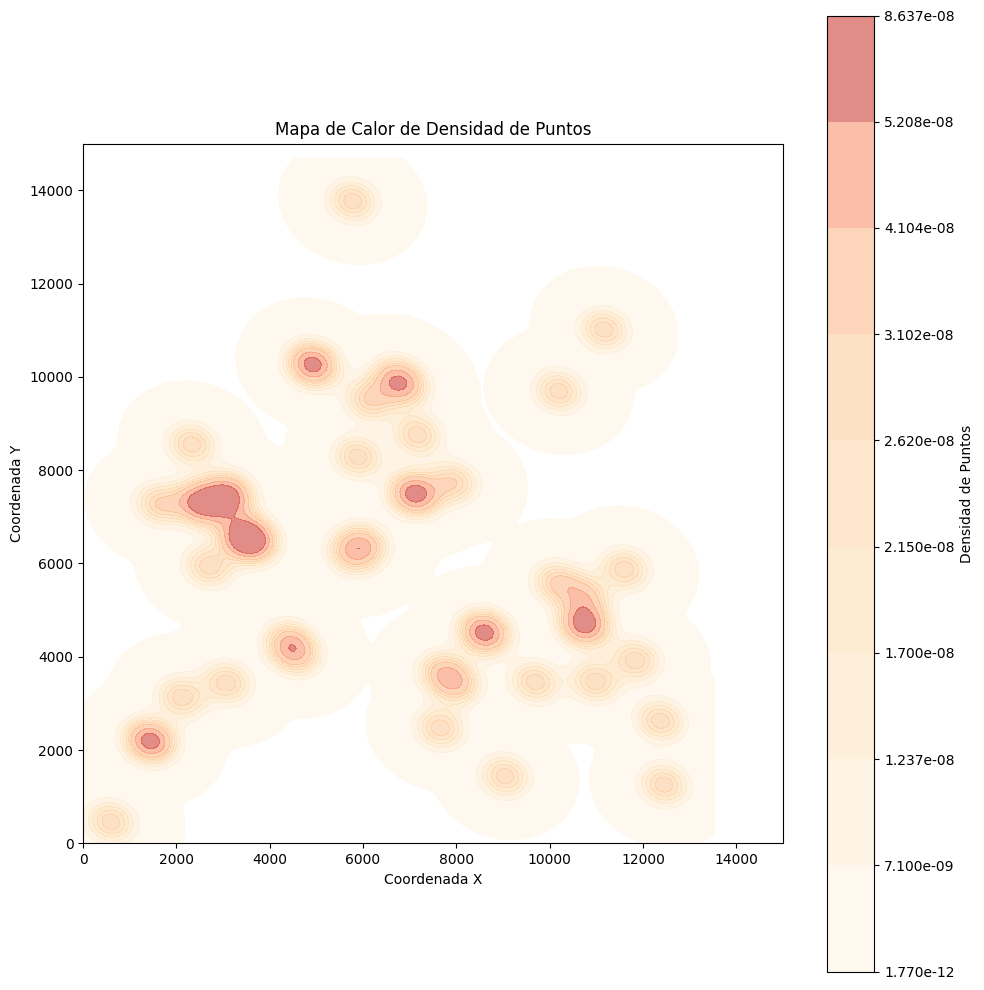

In [ ]:
partida_Jarvan_mas_duracion = ranked_df[ranked_df['champion'] == 'JarvanIV'].sort_values(by='game_duration', ascending=False).head(1)
match_id=partida_Jarvan_mas_duracion['match_id'].values[0]
puuid='CEHgYdCxn7fQTZUFFQOvV9RP1Zq41i9mCDwhQ7RaETA64oP6CAgMGQtuz1sL0hWLjtkFErNuOf5gXw'
api_key='RGAPI-5be6d7d5-f46c-4148-83d4-05e3ca821934'
plot_heatmap_no_background( coordenadas_lol(match_id, puuid, api_key))

✅ Imagen de fondo cargada correctamente.
Dimensiones de la imagen: (701, 705, 3) (alto, ancho, canales)


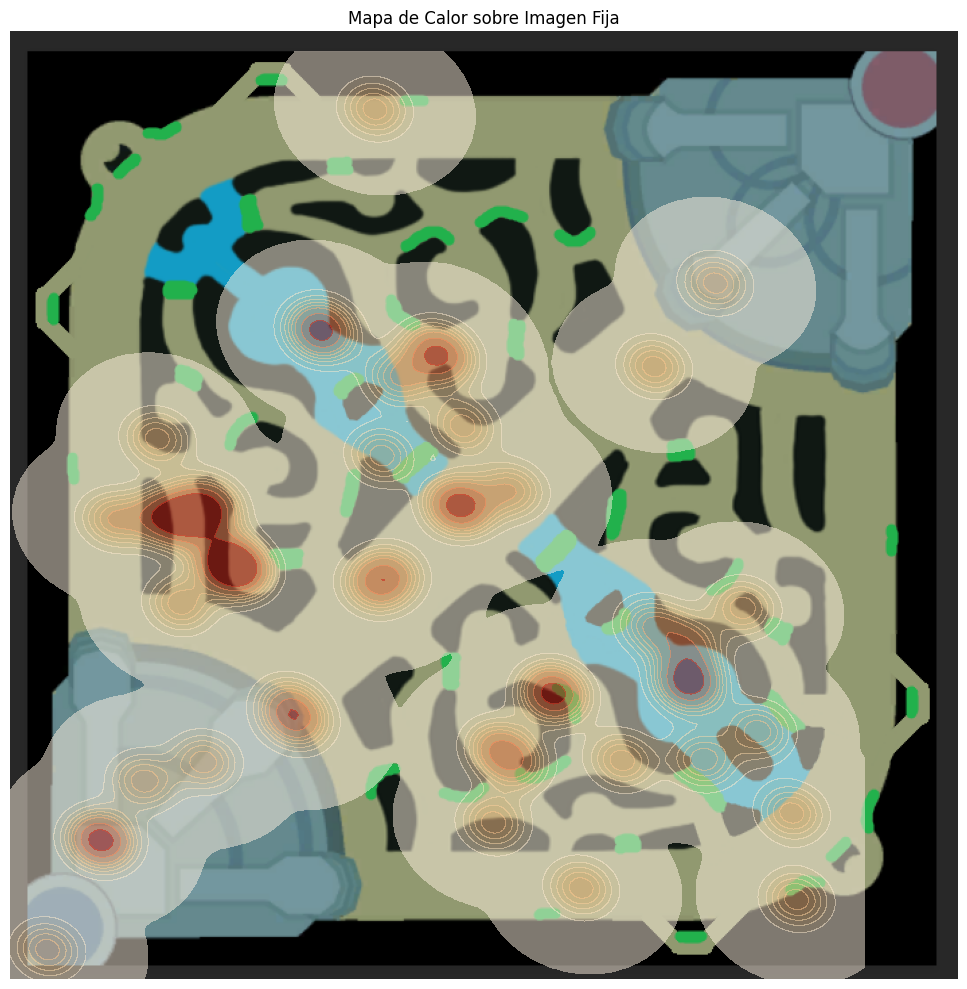

In [ ]:
partida_Jarvan_mas_duracion = ranked_df[ranked_df['champion'] == 'JarvanIV'].sort_values(by='game_duration', ascending=False).head(1)
match_id=partida_Jarvan_mas_duracion['match_id'].values[0]
puuid='CEHgYdCxn7fQTZUFFQOvV9RP1Zq41i9mCDwhQ7RaETA64oP6CAgMGQtuz1sL0hWLjtkFErNuOf5gXw'
api_key='RGAPI-5be6d7d5-f46c-4148-83d4-05e3ca821934'
plot_lol_heatmap_fixed_background(coordenadas_lol(match_id, puuid, api_key), '/content/drive/MyDrive/Imagenmapalol.png')

✅ Imagen del mapa cargada correctamente desde: /content/drive/MyDrive/Imagenmapalol.png
Dimensiones de la imagen de fondo: (701, 705, 3)


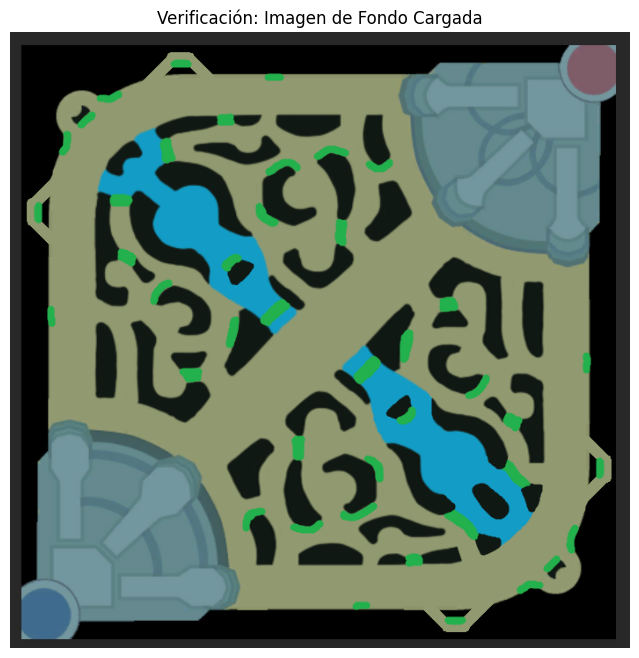

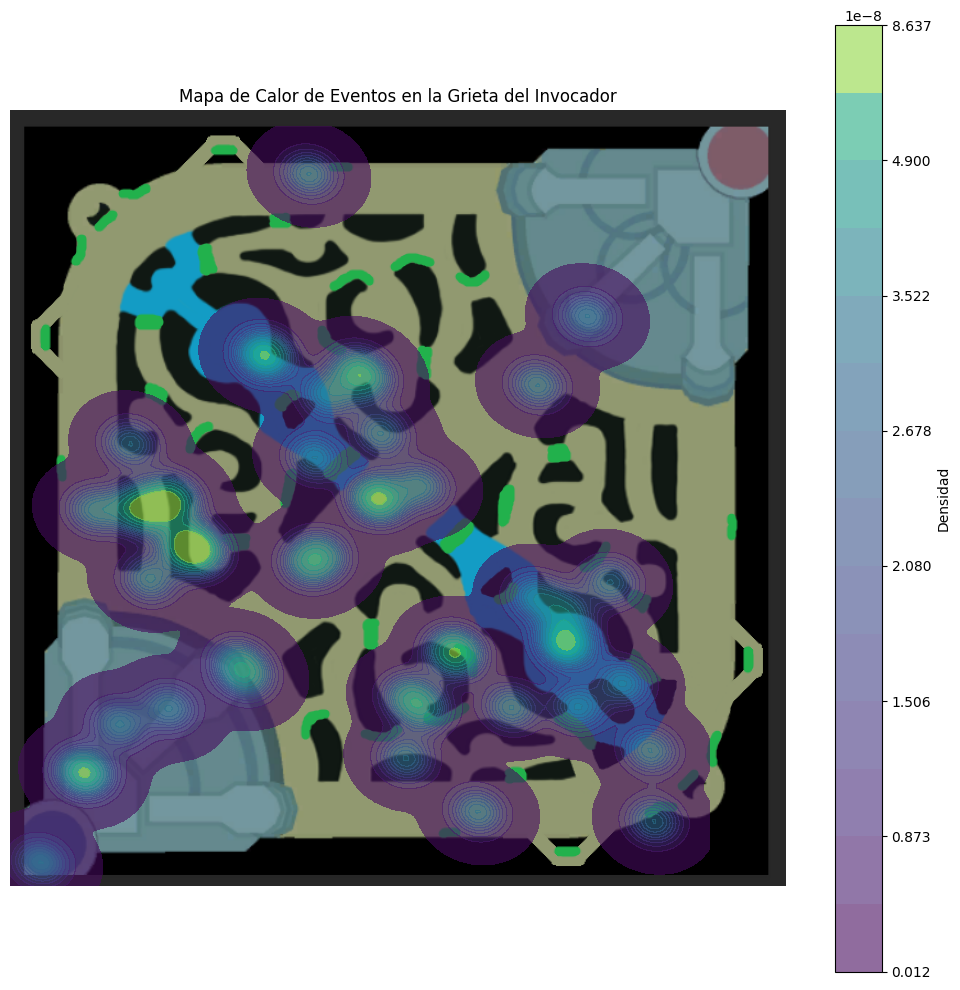

In [ ]:
partida_Jarvan_mas_duracion = ranked_df[ranked_df['champion'] == 'JarvanIV'].sort_values(by='game_duration', ascending=False).head(1)
match_id=partida_Jarvan_mas_duracion['match_id'].values[0]
puuid='CEHgYdCxn7fQTZUFFQOvV9RP1Zq41i9mCDwhQ7RaETA64oP6CAgMGQtuz1sL0hWLjtkFErNuOf5gXw'
api_key='RGAPI-5be6d7d5-f46c-4148-83d4-05e3ca821934'
plot_lol_heatmap_on_map2_fixed(coordenadas_lol(match_id, puuid, api_key), '/content/drive/MyDrive/Imagenmapalol.png')

✅ Imagen del mapa cargada correctamente desde: /content/drive/MyDrive/Imagenmapalol.png
Dimensiones de la imagen de fondo: (701, 705, 3)


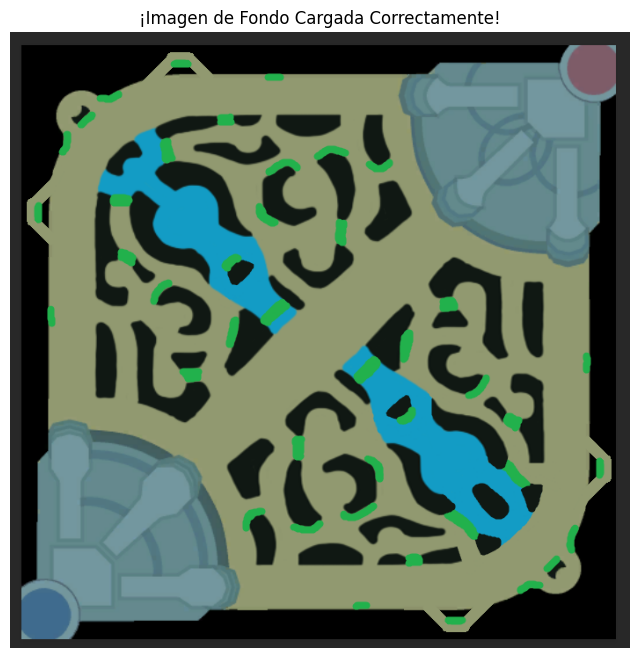

Número de puntos de datos: 48
Rango original X: [593, 12450]
Rango original Y: [464, 13768]
Las coordenadas Y han sido invertidas para coincidir con el origen 'upper' de la imagen.
Dimensiones de la imagen para escalado: Ancho=705, Alto=701
Rango escalado X: [27.871, 585.15]
Rango escalado Y: [57.57546666666667, 679.3157333333334]
Forma del heatmap generado: (150, 150)
Valor máximo en el heatmap: 2.0


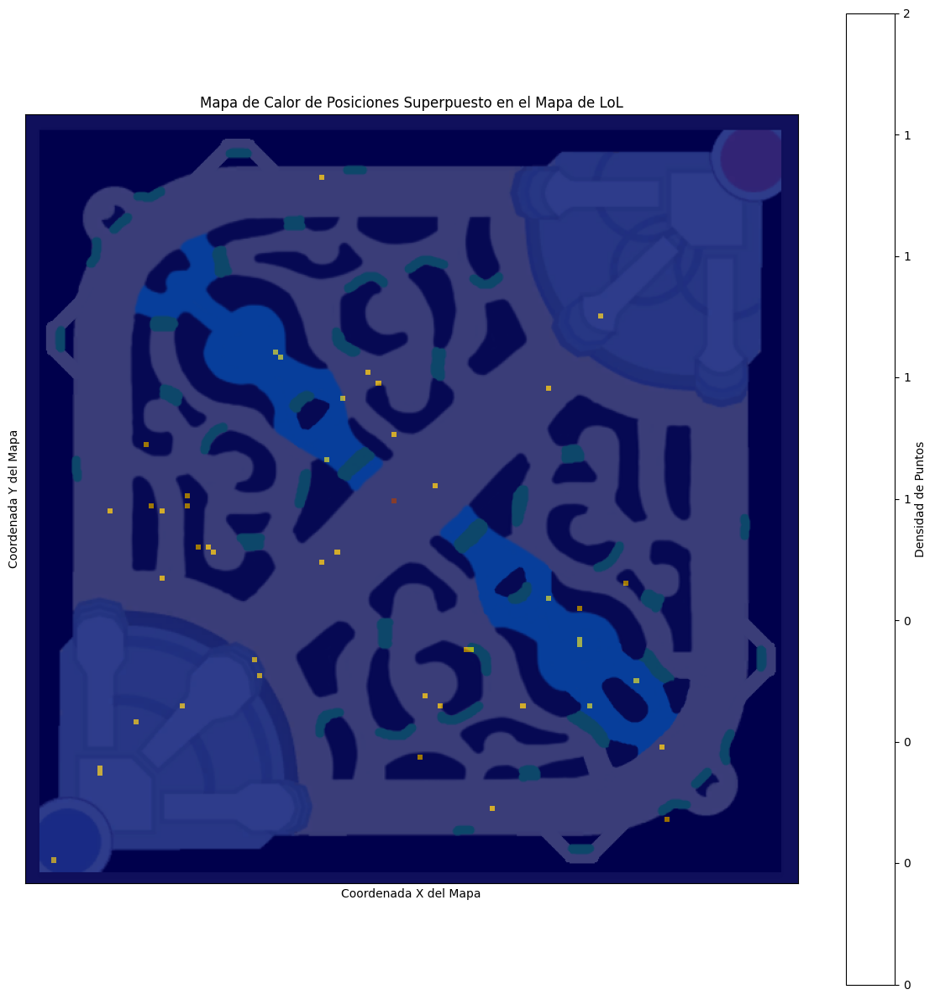

In [ ]:
partida_Jarvan_mas_duracion = ranked_df[ranked_df['champion'] == 'JarvanIV'].sort_values(by='game_duration', ascending=False).head(1)
match_id=partida_Jarvan_mas_duracion['match_id'].values[0]
puuid='CEHgYdCxn7fQTZUFFQOvV9RP1Zq41i9mCDwhQ7RaETA64oP6CAgMGQtuz1sL0hWLjtkFErNuOf5gXw'
api_key='RGAPI-5be6d7d5-f46c-4148-83d4-05e3ca821934'
plot_lol_heatmap_histogram(coordenadas_lol(match_id, puuid, api_key), '/content/drive/MyDrive/Imagenmapalol.png')

###Comparación

In [ ]:
stats_Jarvan={
    'CS/min': 5.63,
    'Daño/min': 597,
    'Oro/min': 412,
    'Wards/min': 0.23,
    'KDA': (6.3, 5.7, 12.3)
}


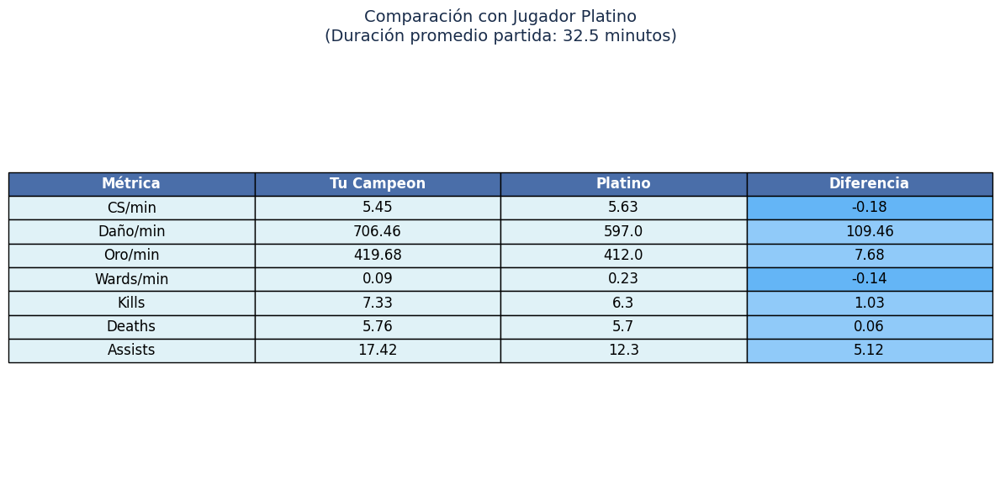

In [ ]:
comparar_stats(Jarvan_ranked, stats_Jarvan)

###Winrate

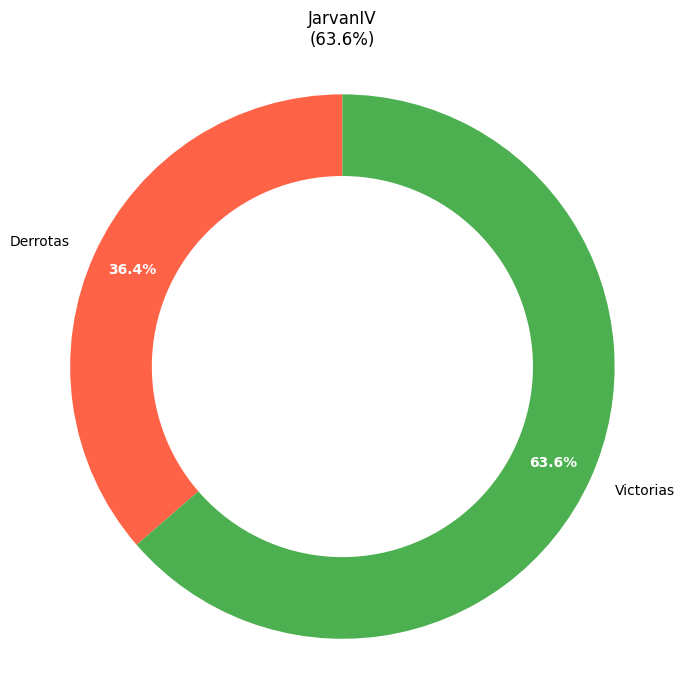

In [ ]:
plot_champion_winrate_donut_simplified(Jarvan_ranked, champion_name='JarvanIV')

###Correlación

In [ ]:
plot_correlation_heatmap_azul(Jarvan_ranked, metricas)

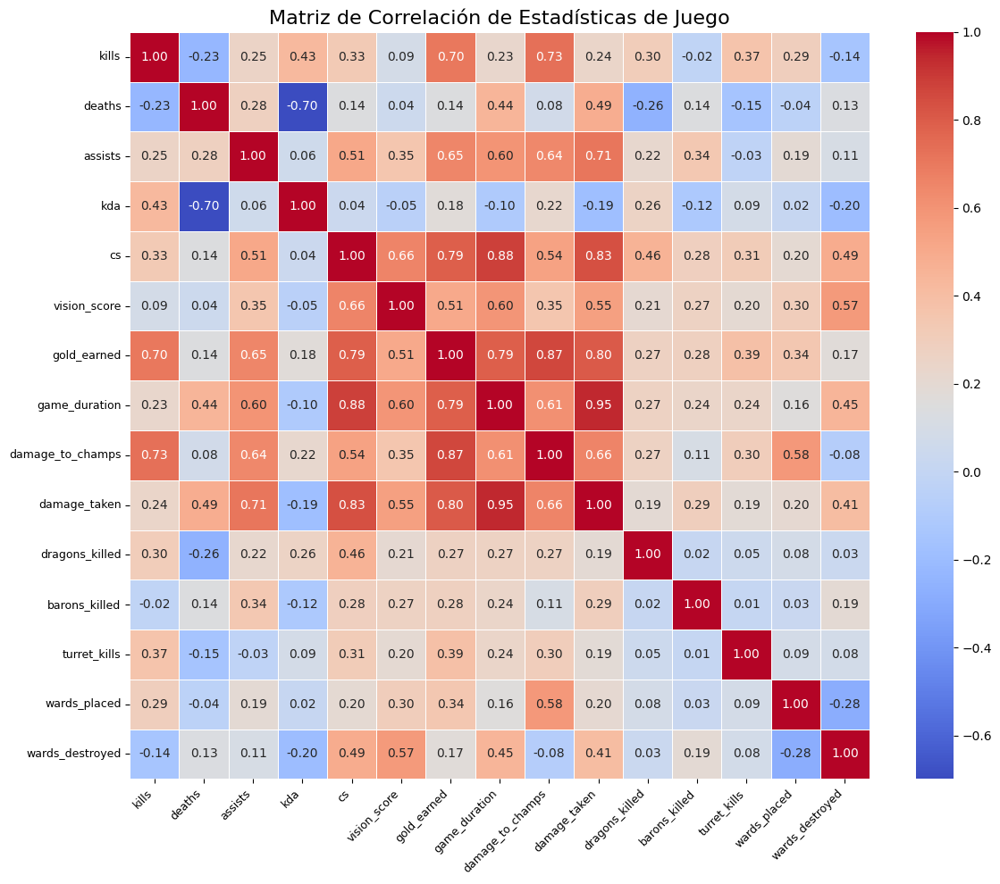

In [ ]:
plot_correlation_heatmap(Jarvan_ranked, metricas)

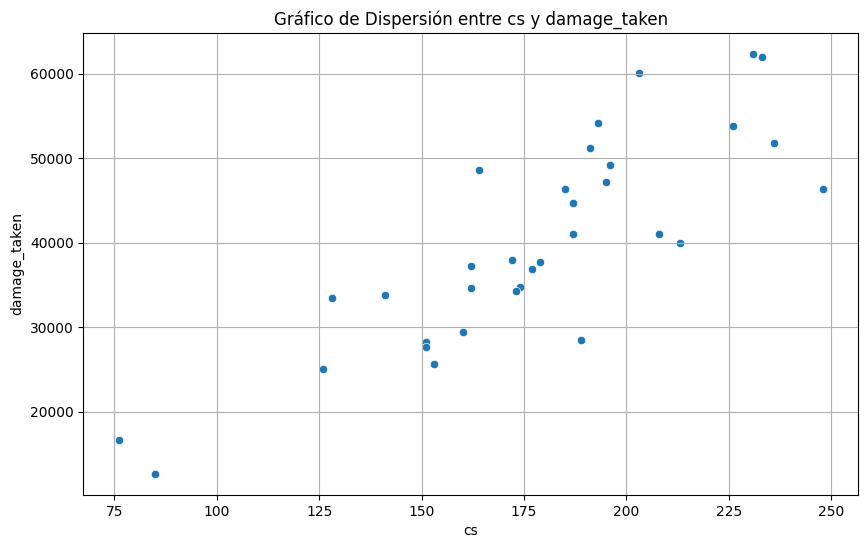

In [ ]:
comparar_columnas_df(Jarvan_ranked,'cs','damage_taken')

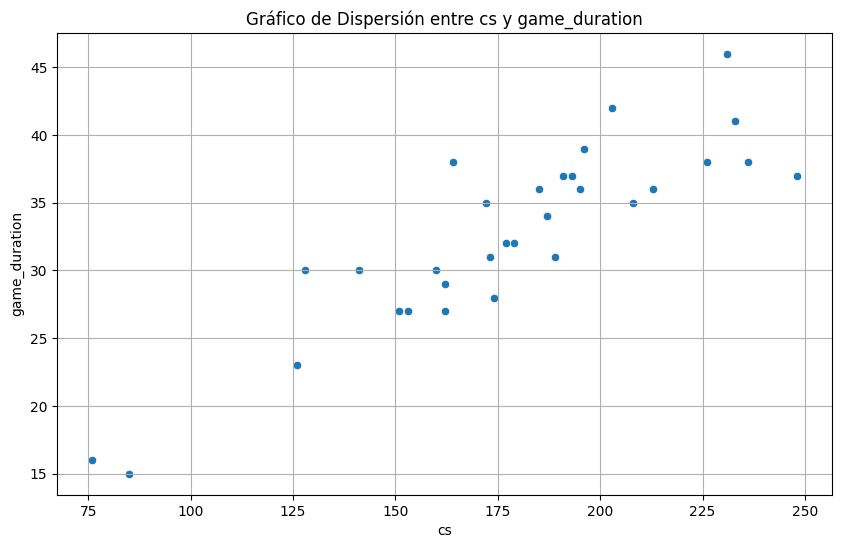

In [ ]:
comparar_columnas_df(Jarvan_ranked,'cs','game_duration')

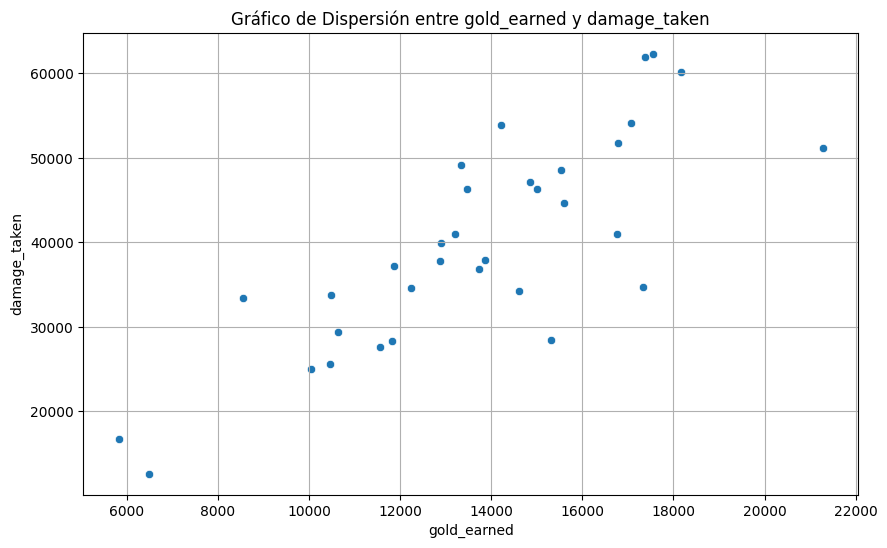

In [ ]:
comparar_columnas_df(Jarvan_ranked,'gold_earned','damage_taken')

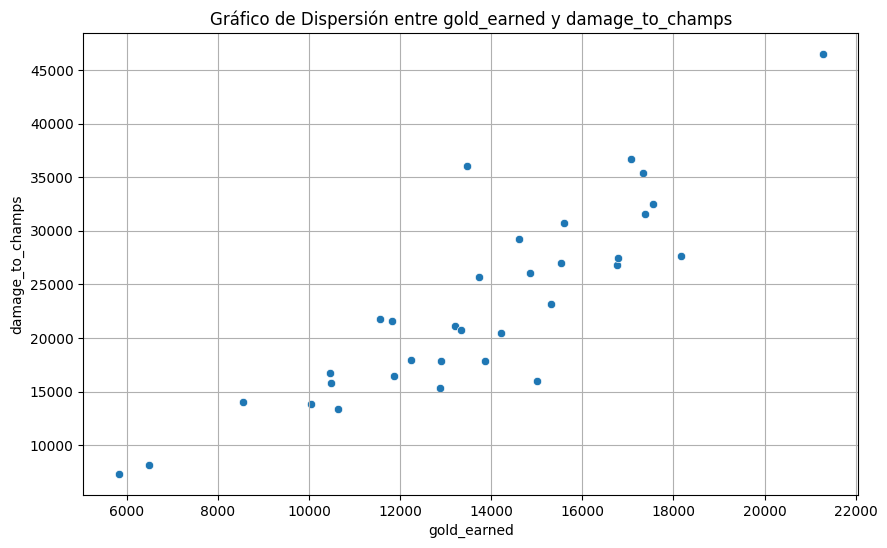

In [ ]:
comparar_columnas_df(Jarvan_ranked,'gold_earned','damage_to_champs')

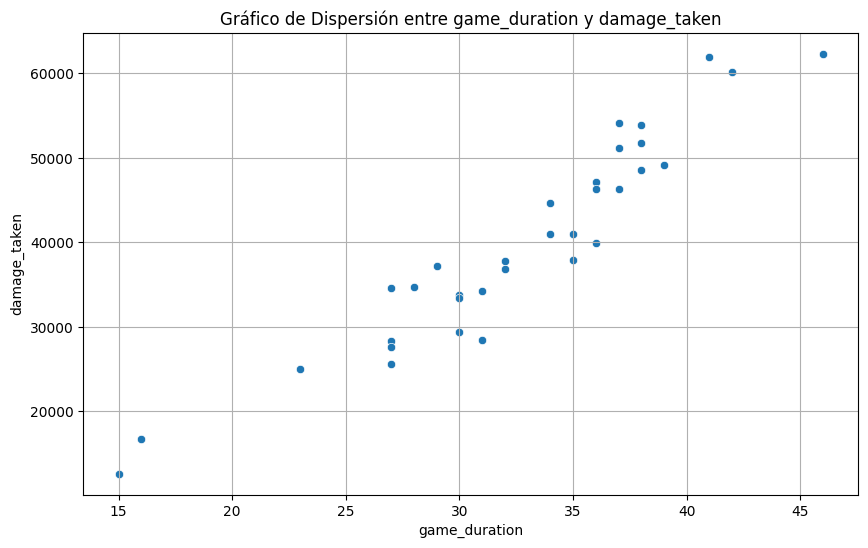

In [ ]:
comparar_columnas_df(Jarvan_ranked,'game_duration','damage_taken')

###Perfil de Rendimiento

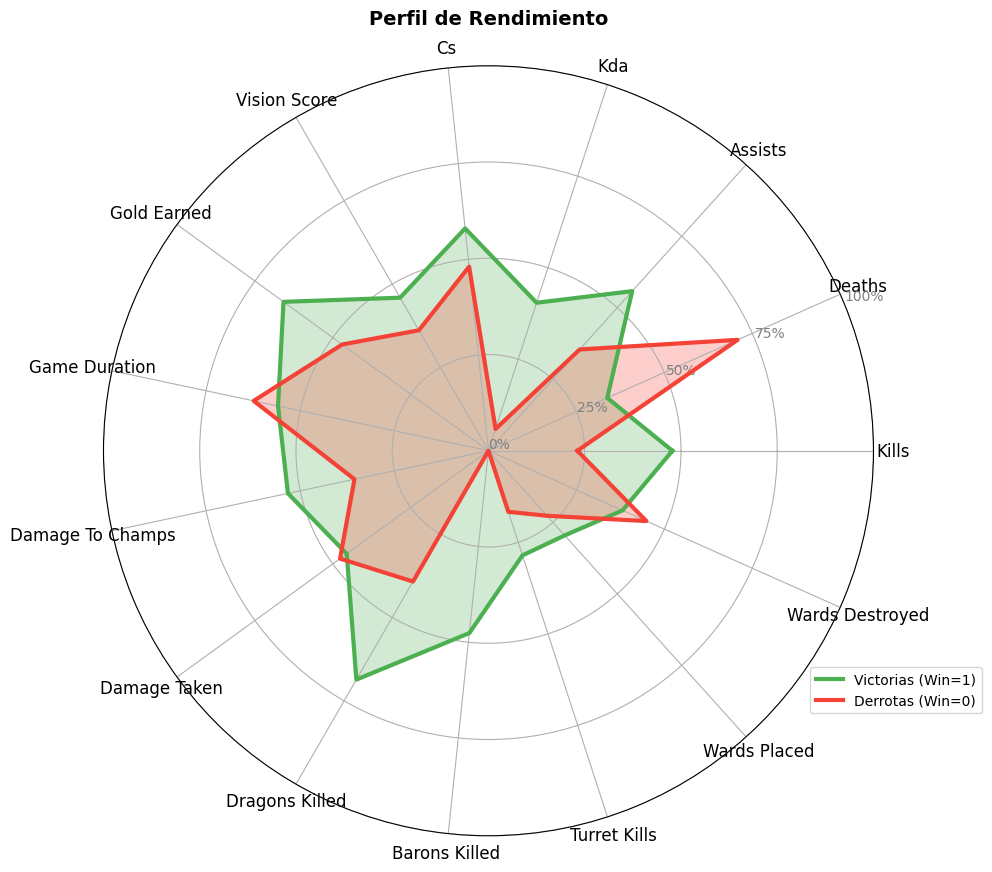

In [ ]:
plot_performance_radar_chart_standalone(Jarvan_ranked, metricas)

###Comparación con el Winrate

<ipython-input-28-ca8af1589229>:26: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

<ipython-input-28-ca8af1589229>:45: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-28-ca8af1589229>:45: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-28-ca8af1589229>:45: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-28-ca8af1589229>:45: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the

DEBUG: Columna 'win' convertida a tipo 'category'.


<ipython-input-28-ca8af1589229>:45: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-28-ca8af1589229>:45: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-28-ca8af1589229>:45: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-28-ca8af1589229>:45: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-28-ca8af1589229>:45: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and wi

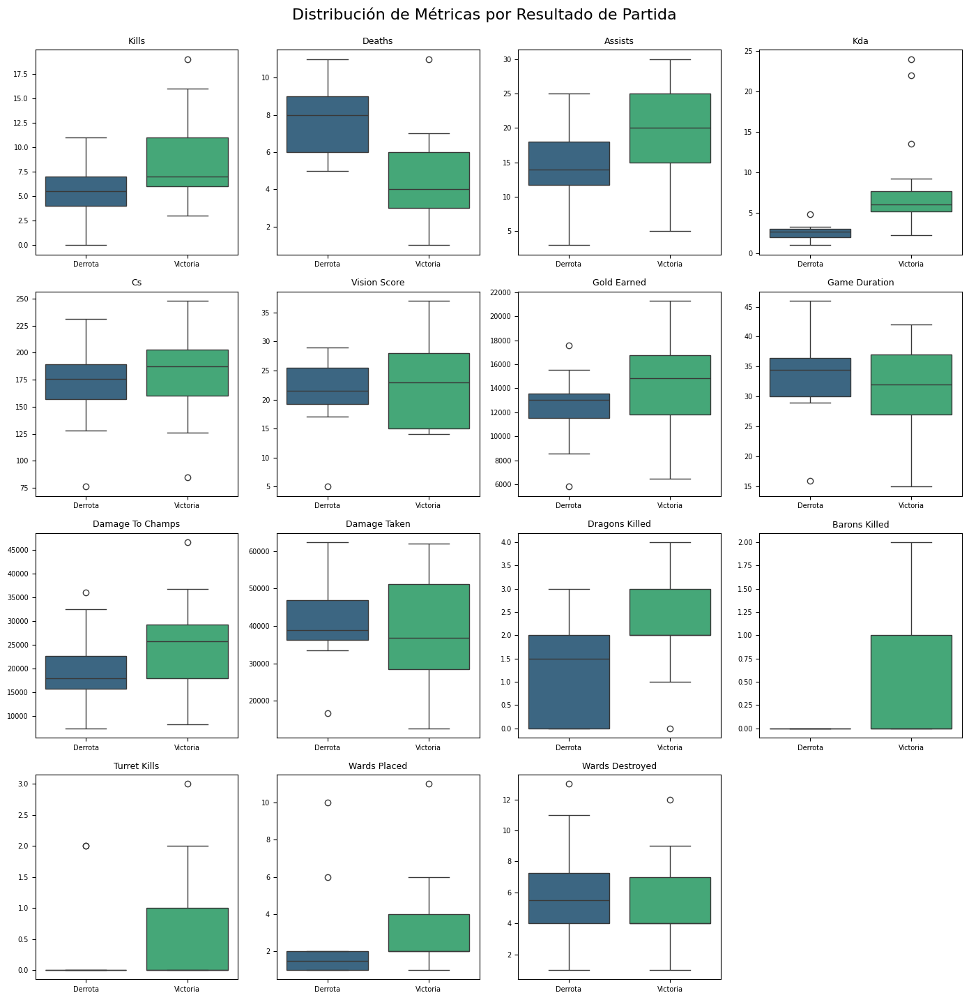

In [ ]:
plot_metric_boxplots_by_win_outcome(Jarvan_ranked)

<ipython-input-32-50e8ba909eaa>:17: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



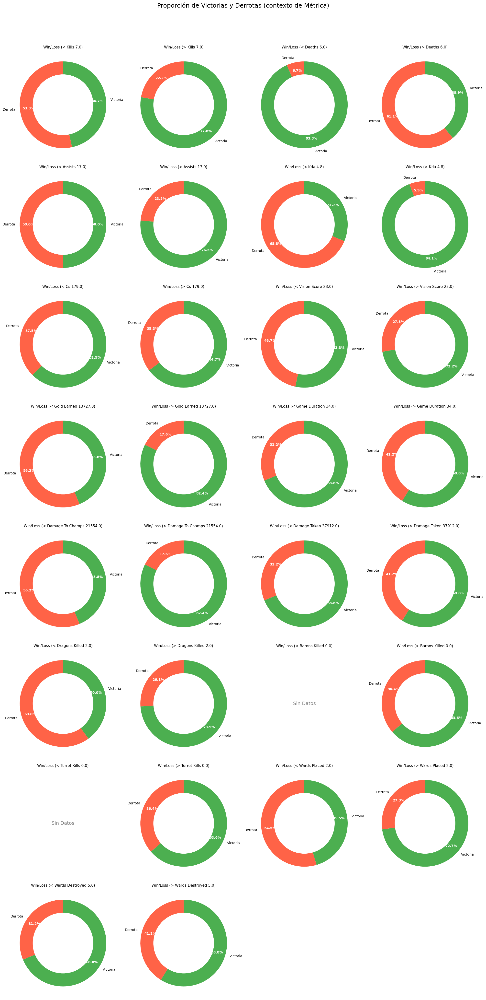

In [ ]:
plot_contextual_win_loss_donut_charts(Jarvan_ranked, metricas)

<ipython-input-27-28b7a8afa8af>:15: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



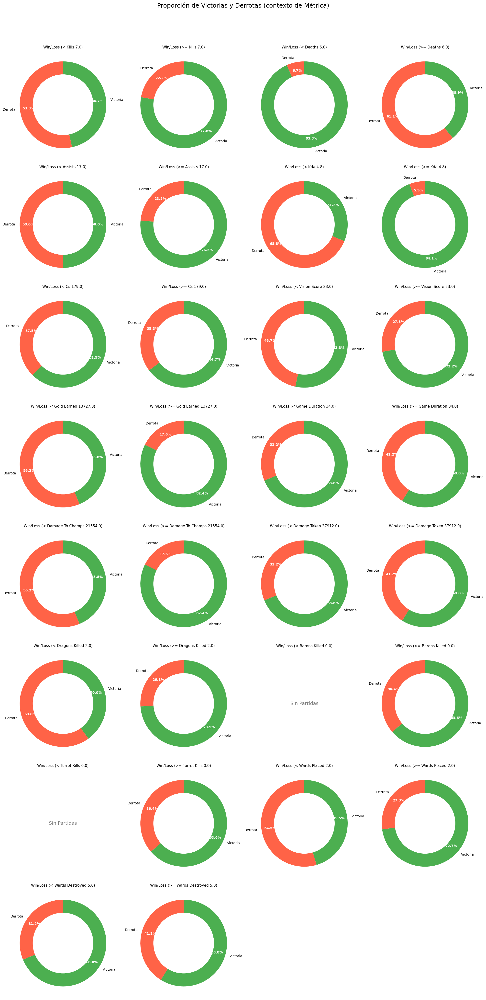

In [ ]:
plot_global_win_loss_donut_charts(Jarvan_ranked, metricas)

<ipython-input-26-03aa5cd79986>:22: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



DEBUG: Columna 'win' convertida a tipo 'category'.


/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: UserWarning:

Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.



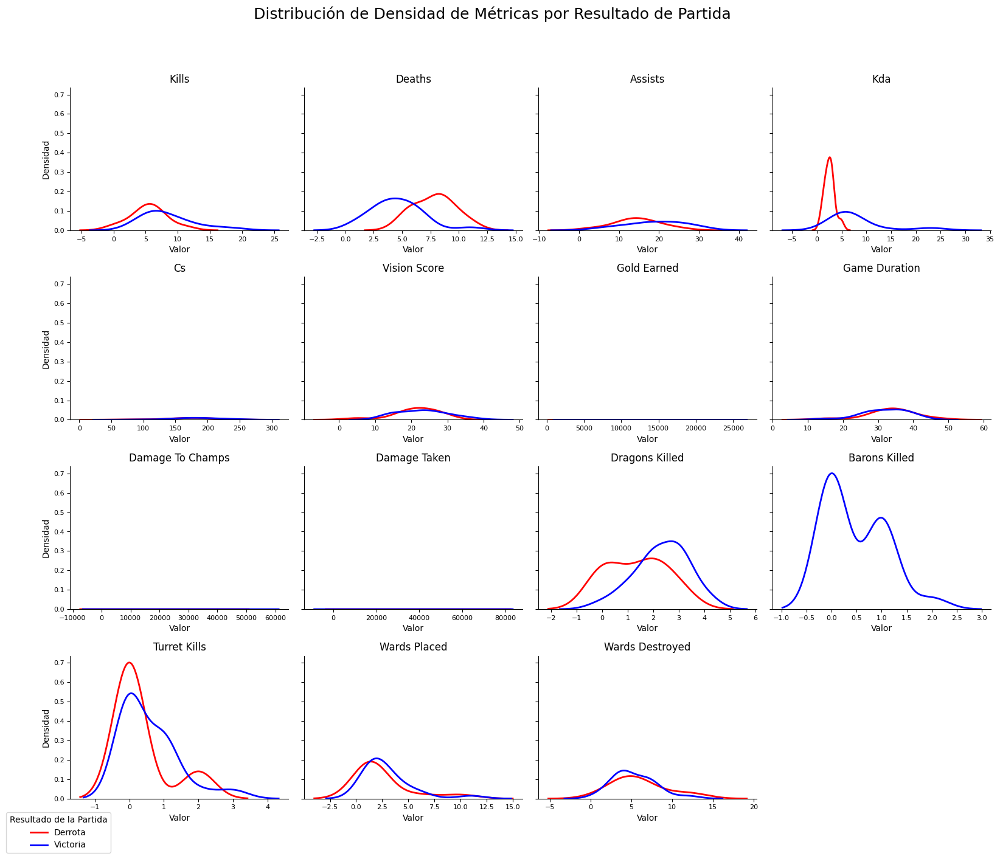

In [ ]:
plot_metric_density_by_win_outcome(Jarvan_ranked)

##Analisis de Rengar


In [ ]:
#DataFrame solo de Rengar ranked
Rengar_ranked = ranked_df[ranked_df['champion'] == 'Rengar']

###Mapa

In [ ]:
partida_Rengar_mas_duracion = ranked_df[ranked_df['champion'] == 'Rengar'].sort_values(by='game_duration', ascending=False).head(1)
partida_Rengar_mas_duracion

,match_id,champion,win,kills,deaths,assists,kda,cs,vision_score,gold_earned,...,team_position,items,summoner_spells,damage_to_champs,damage_taken,dragons_killed,barons_killed,turret_kills,wards_placed,wards_destroyed
86,LA1_1611834185,Rengar,0,21,7,2,3.29,287,34,19951,...,JUNGLE,"[3142, 6698, 3171, 3036, 3814, 6695, 3364]","[11, 4]",47500,54277,2,1,1,7,5


✅ Imagen del mapa cargada correctamente desde Drive: /content/drive/MyDrive/Imagenmapalol.png
Dimensiones de la imagen de fondo: (701, 705, 3)


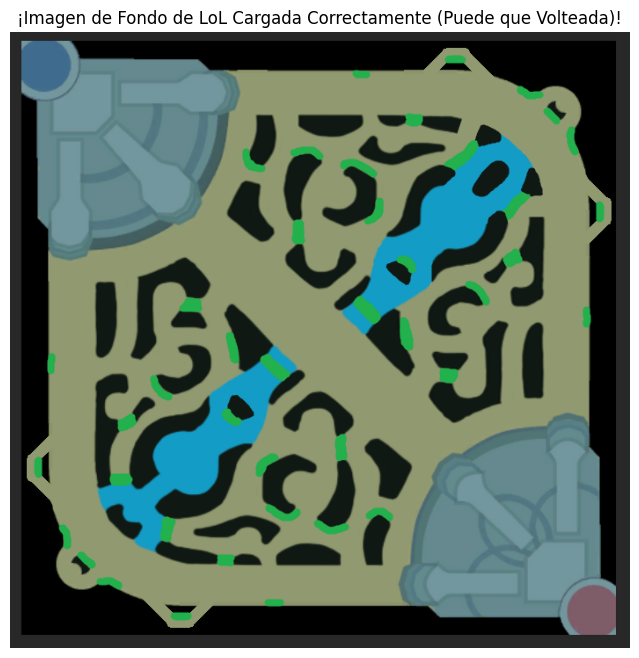

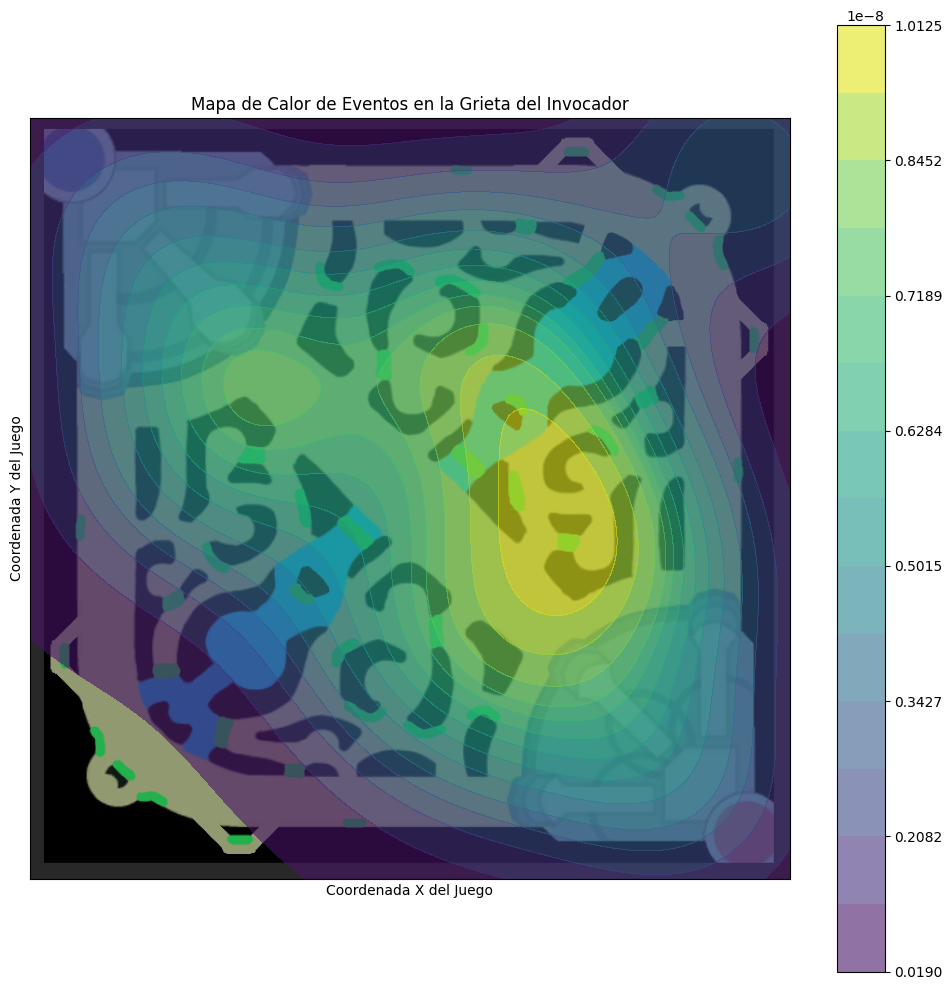

In [ ]:
partida_Rengar_mas_duracion = ranked_df[ranked_df['champion'] == 'Rengar'].sort_values(by='game_duration', ascending=False).head(1)
match_id=partida_Rengar_mas_duracion['match_id'].values[0]
puuid='CEHgYdCxn7fQTZUFFQOvV9RP1Zq41i9mCDwhQ7RaETA64oP6CAgMGQtuz1sL0hWLjtkFErNuOf5gXw'
api_key='RGAPI-5be6d7d5-f46c-4148-83d4-05e3ca821934'
plot_lol_heatmap_on_map(coordenadas_lol(match_id, puuid, api_key), '/content/drive/MyDrive/Imagenmapalol.png')

Mounted at /content/drive
🔍 Buscando imagen en: /content/drive/MyDrive/Imagenmapalol.png
✅ Imagen cargada. Dimensiones: (350, 352, 3)


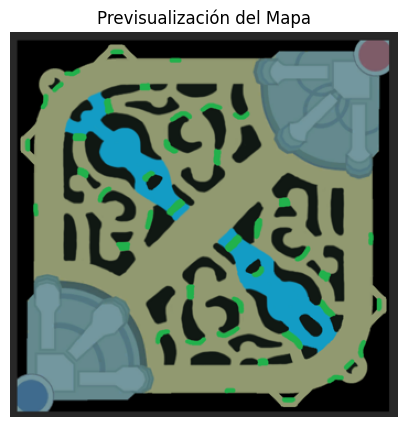

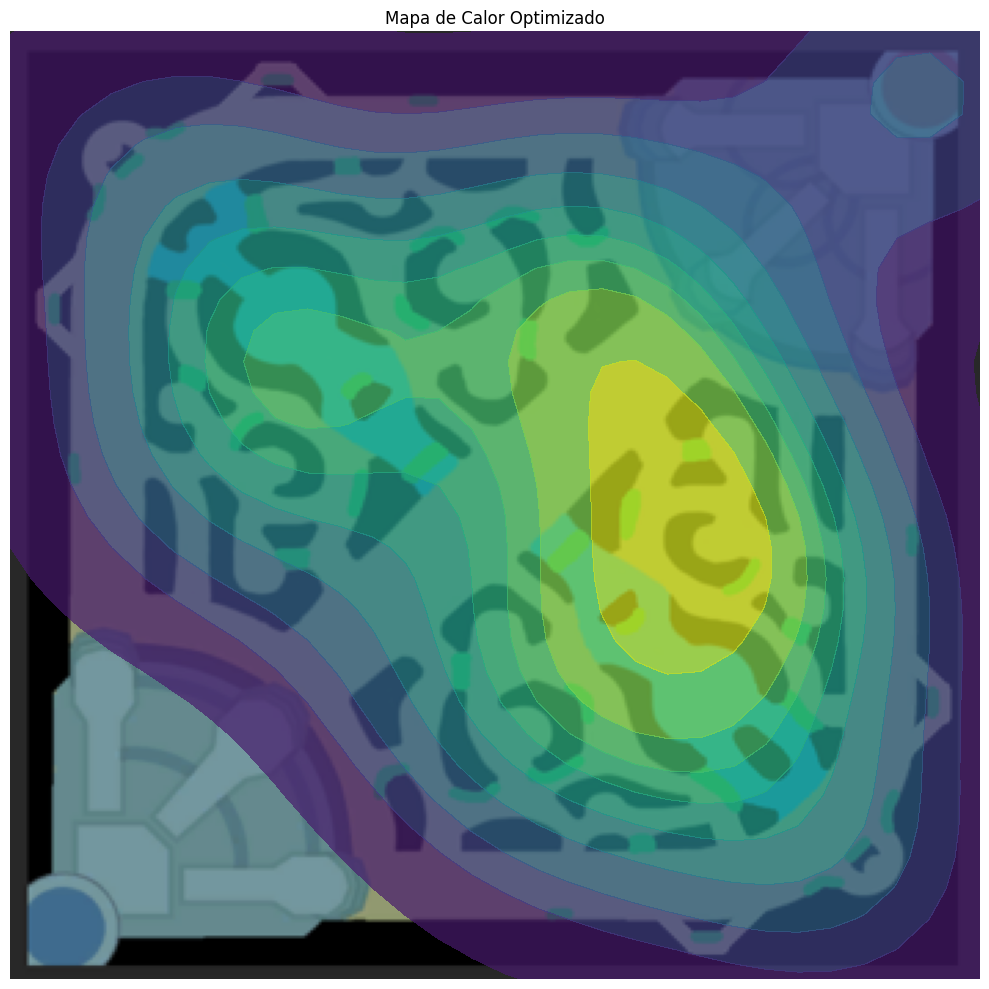

✅ Visualización completada


In [ ]:
partida_Rengar_mas_duracion = ranked_df[ranked_df['champion'] == 'Rengar'].sort_values(by='game_duration', ascending=False).head(1)
match_id=partida_Rengar_mas_duracion['match_id'].values[0]
puuid='CEHgYdCxn7fQTZUFFQOvV9RP1Zq41i9mCDwhQ7RaETA64oP6CAgMGQtuz1sL0hWLjtkFErNuOf5gXw'
api_key='RGAPI-5be6d7d5-f46c-4148-83d4-05e3ca821934'
plot_lol_heatmap_optimized(coordenadas_lol(match_id, puuid, api_key), '/content/drive/MyDrive/Imagenmapalol.png')

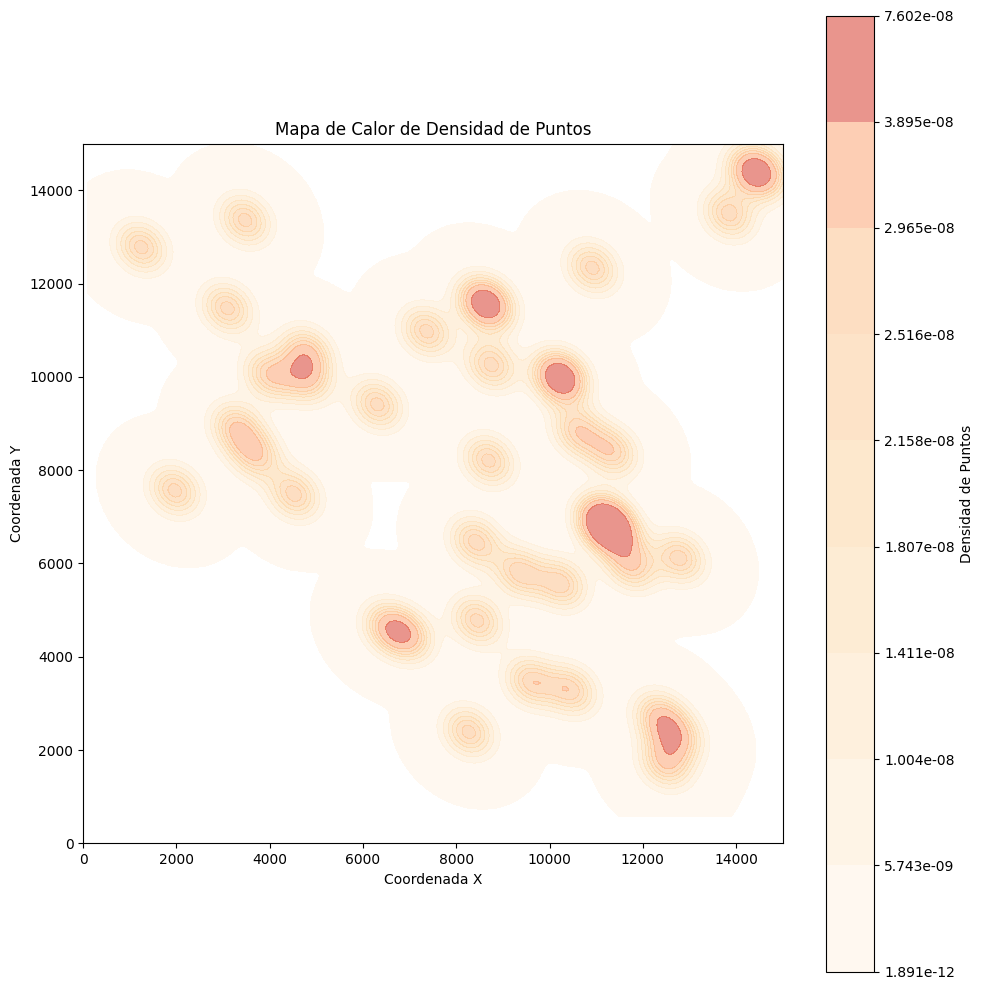

In [ ]:
partida_Rengar_mas_duracion = ranked_df[ranked_df['champion'] == 'Rengar'].sort_values(by='game_duration', ascending=False).head(1)
match_id=partida_Rengar_mas_duracion['match_id'].values[0]
puuid='CEHgYdCxn7fQTZUFFQOvV9RP1Zq41i9mCDwhQ7RaETA64oP6CAgMGQtuz1sL0hWLjtkFErNuOf5gXw'
api_key='RGAPI-5be6d7d5-f46c-4148-83d4-05e3ca821934'
plot_heatmap_no_background(coordenadas_lol(match_id, puuid, api_key))

✅ Imagen de fondo cargada correctamente.
Dimensiones de la imagen: (701, 705, 3) (alto, ancho, canales)


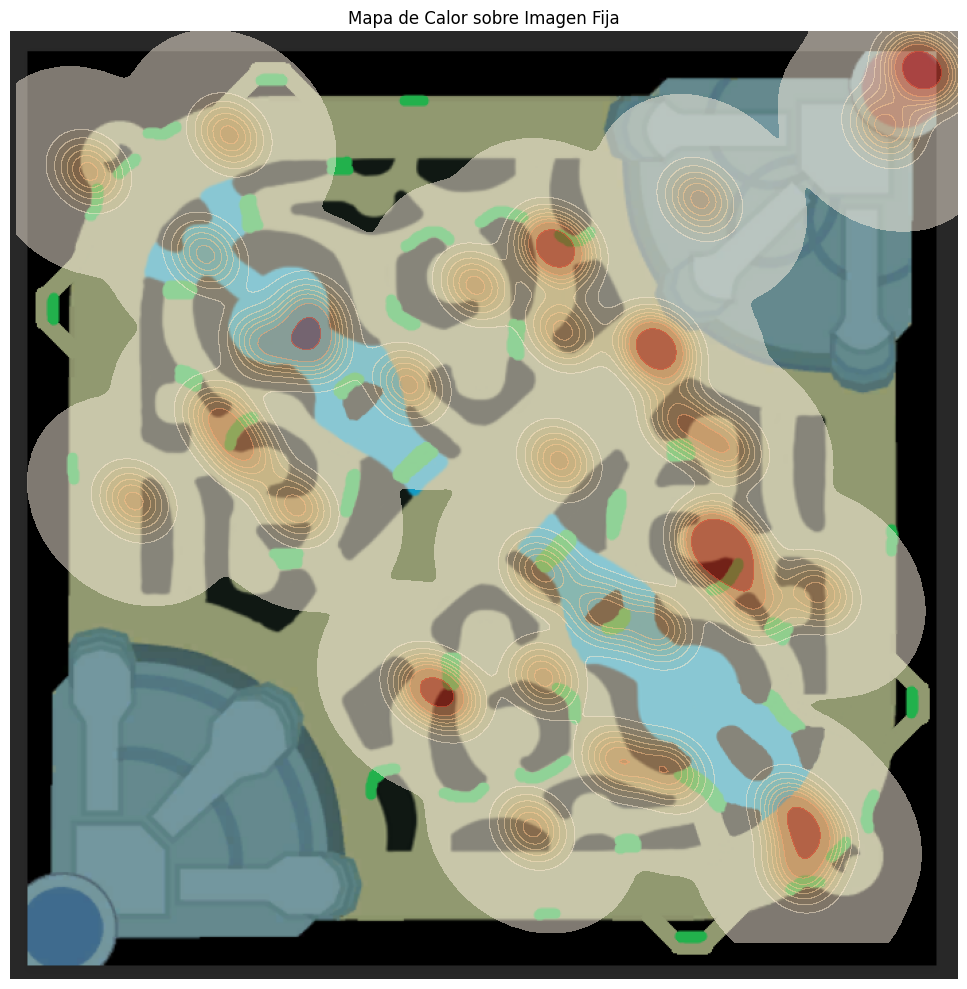

In [ ]:
partida_Rengar_mas_duracion = ranked_df[ranked_df['champion'] == 'Rengar'].sort_values(by='game_duration', ascending=False).head(1)
match_id=partida_Rengar_mas_duracion['match_id'].values[0]
puuid='CEHgYdCxn7fQTZUFFQOvV9RP1Zq41i9mCDwhQ7RaETA64oP6CAgMGQtuz1sL0hWLjtkFErNuOf5gXw'
api_key='RGAPI-5be6d7d5-f46c-4148-83d4-05e3ca821934'
plot_lol_heatmap_fixed_background(coordenadas_lol(match_id, puuid, api_key), '/content/drive/MyDrive/Imagenmapalol.png')

✅ Imagen del mapa cargada correctamente desde: /content/drive/MyDrive/Imagenmapalol.png
Dimensiones de la imagen de fondo: (701, 705, 3)


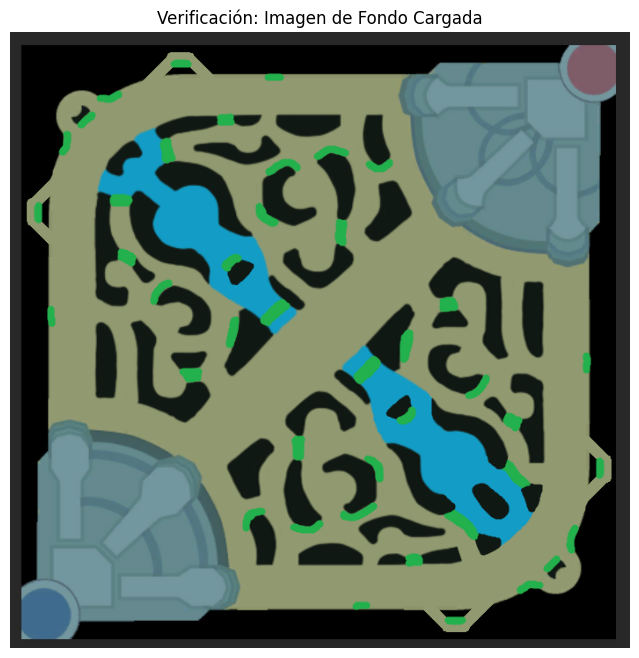

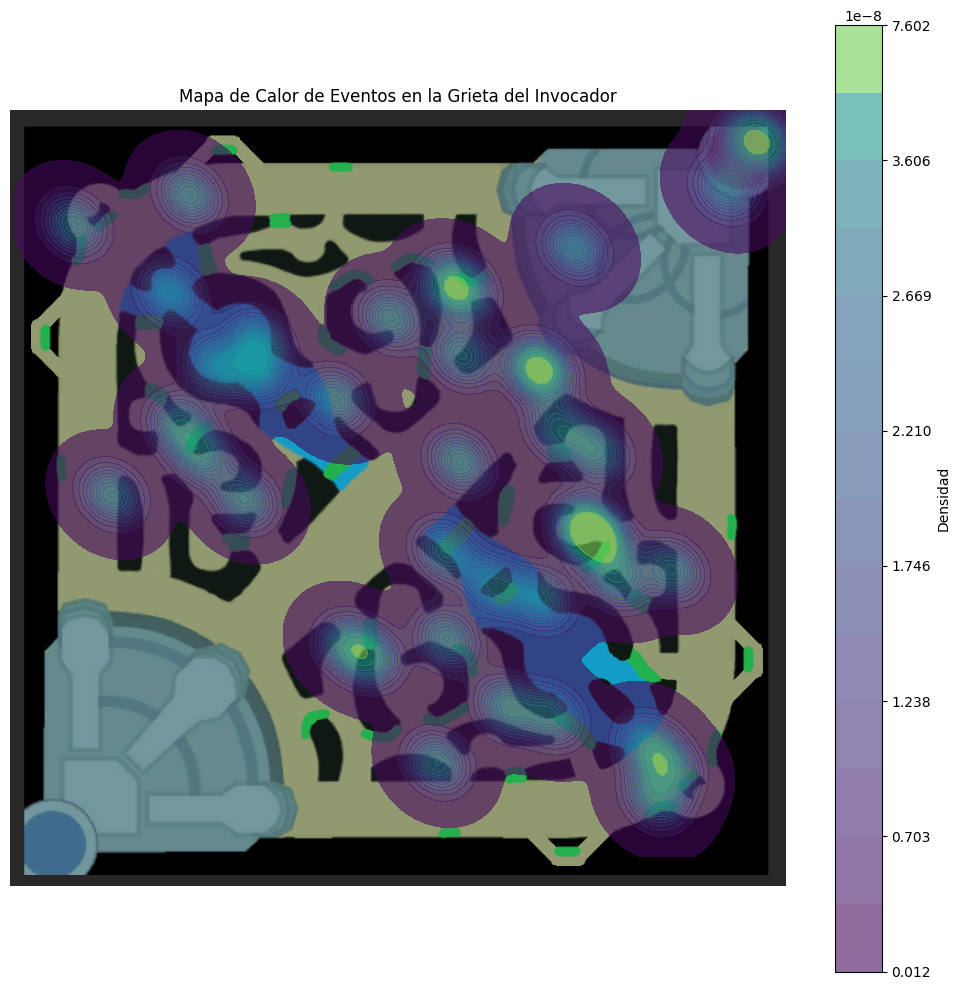

In [ ]:
partida_Rengar_mas_duracion = ranked_df[ranked_df['champion'] == 'Rengar'].sort_values(by='game_duration', ascending=False).head(1)
match_id=partida_Rengar_mas_duracion['match_id'].values[0]
puuid='CEHgYdCxn7fQTZUFFQOvV9RP1Zq41i9mCDwhQ7RaETA64oP6CAgMGQtuz1sL0hWLjtkFErNuOf5gXw'
api_key='RGAPI-5be6d7d5-f46c-4148-83d4-05e3ca821934'
plot_lol_heatmap_on_map2_fixed(coordenadas_lol(match_id, puuid, api_key), '/content/drive/MyDrive/Imagenmapalol.png')

✅ Imagen del mapa cargada correctamente desde: /content/drive/MyDrive/Imagenmapalol.png
Dimensiones de la imagen de fondo: (701, 705, 3)


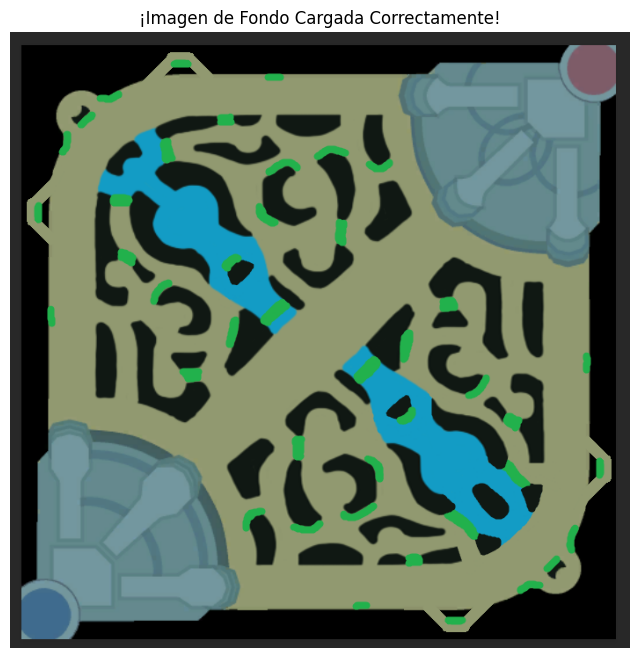

Número de puntos de datos: 41
Rango original X: [1248, 14539]
Rango original Y: [1714, 14394]
Las coordenadas Y han sido invertidas para coincidir con el origen 'upper' de la imagen.
Dimensiones de la imagen para escalado: Ancho=705, Alto=701
Rango escalado X: [58.656, 683.3330000000001]
Rango escalado Y: [28.32039999999995, 620.8990666666666]
Forma del heatmap generado: (150, 150)
Valor máximo en el heatmap: 2.0


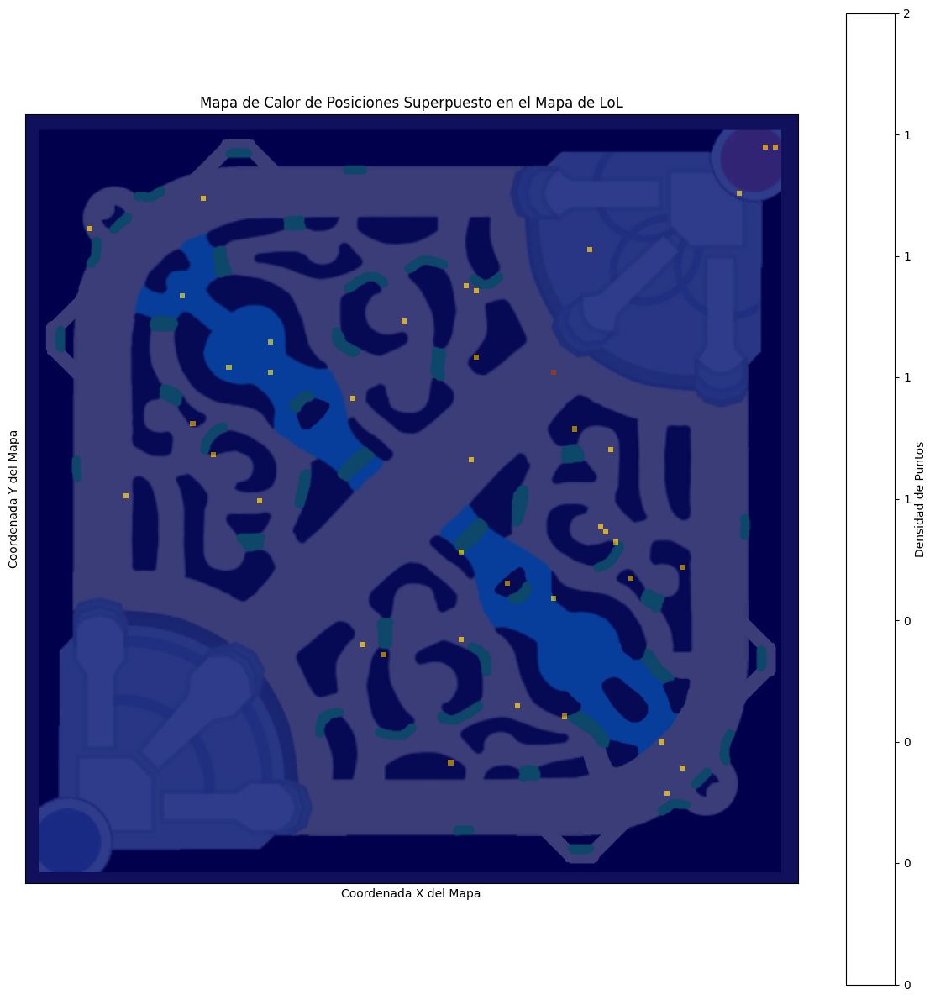

In [ ]:
partida_Rengar_mas_duracion = ranked_df[ranked_df['champion'] == 'Rengar'].sort_values(by='game_duration', ascending=False).head(1)
match_id=partida_Rengar_mas_duracion['match_id'].values[0]
puuid='CEHgYdCxn7fQTZUFFQOvV9RP1Zq41i9mCDwhQ7RaETA64oP6CAgMGQtuz1sL0hWLjtkFErNuOf5gXw'
api_key='RGAPI-5be6d7d5-f46c-4148-83d4-05e3ca821934'
plot_lol_heatmap_histogram(coordenadas_lol(match_id, puuid, api_key), '/content/drive/MyDrive/Imagenmapalol.png')

###Comparación

In [ ]:
stats_Rengar={
    'CS/min': 6.39,
    'Daño/min': 692,
    'Oro/min': 435,
    'Wards/min': 0.20,
    'KDA': (8.2, 6.7, 5.9)
}

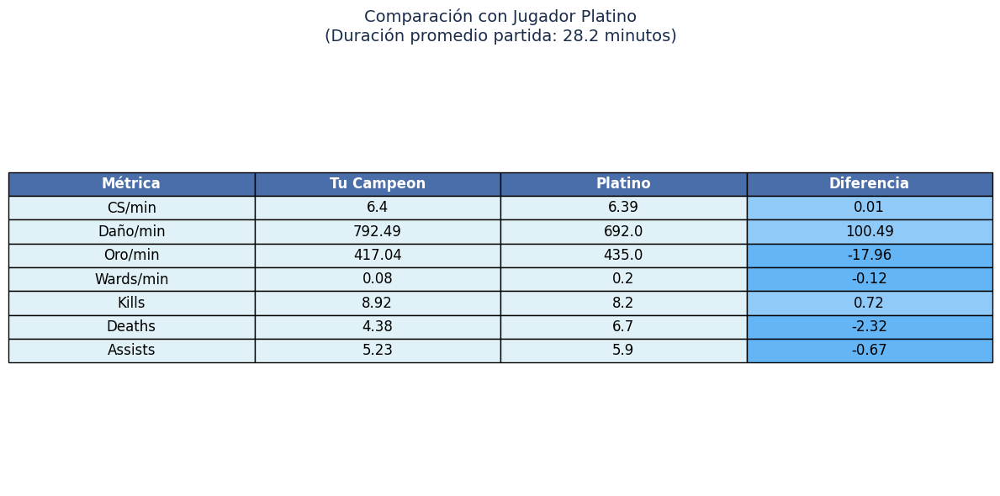

In [ ]:
comparar_stats(Rengar_ranked, stats_Rengar)

###Correlación

In [ ]:
plot_correlation_heatmap_azul(Rengar_ranked, metricas)

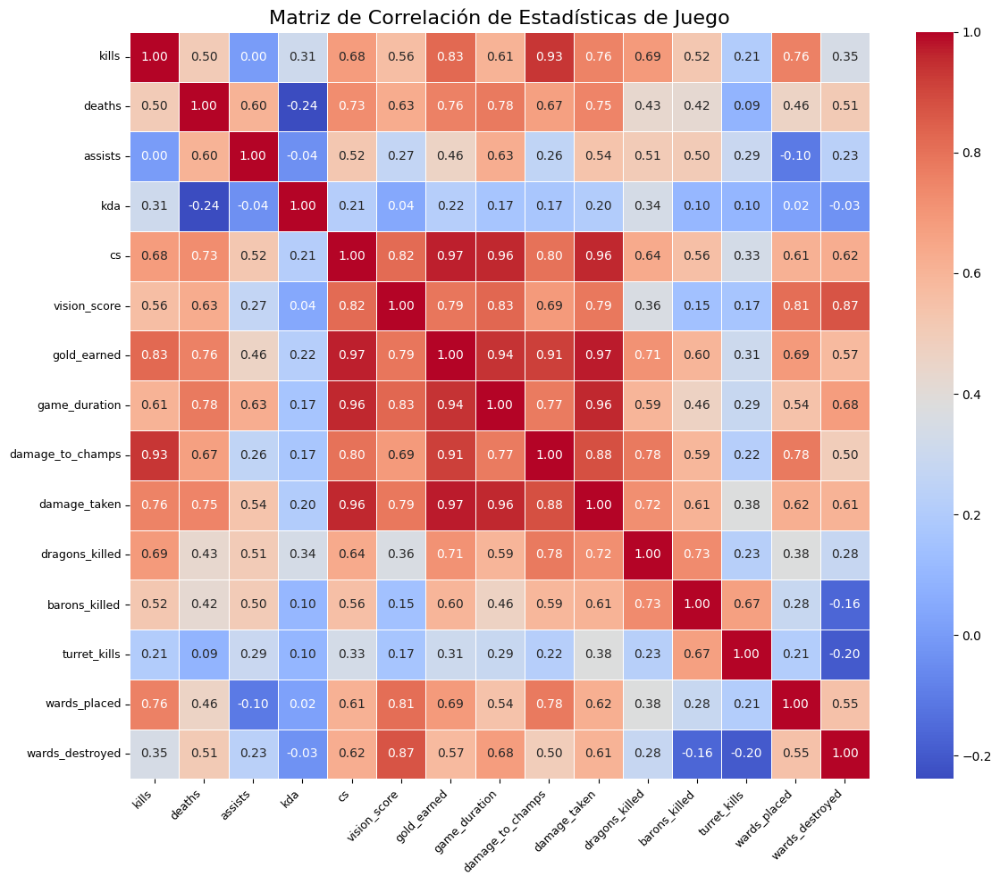

In [ ]:
plot_correlation_heatmap(Rengar_ranked, metricas)

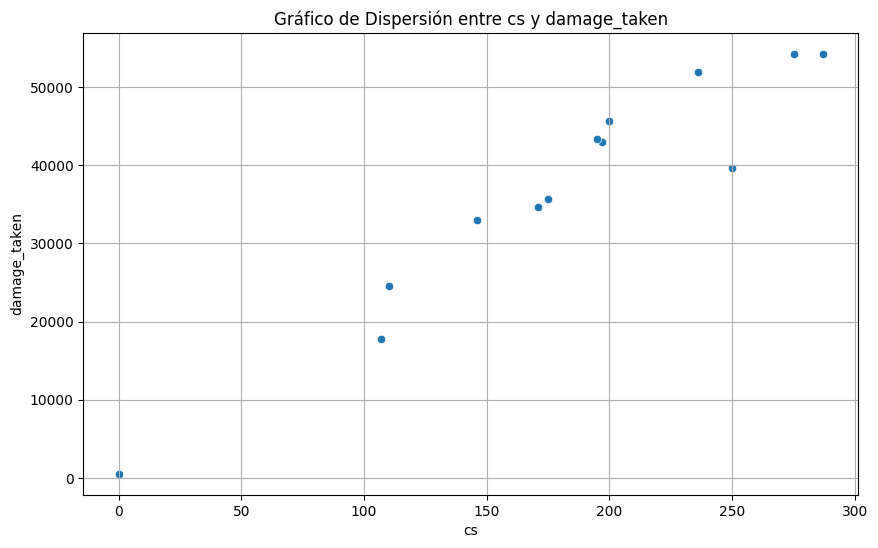

In [ ]:
comparar_columnas_df(Rengar_ranked,'cs','damage_taken')

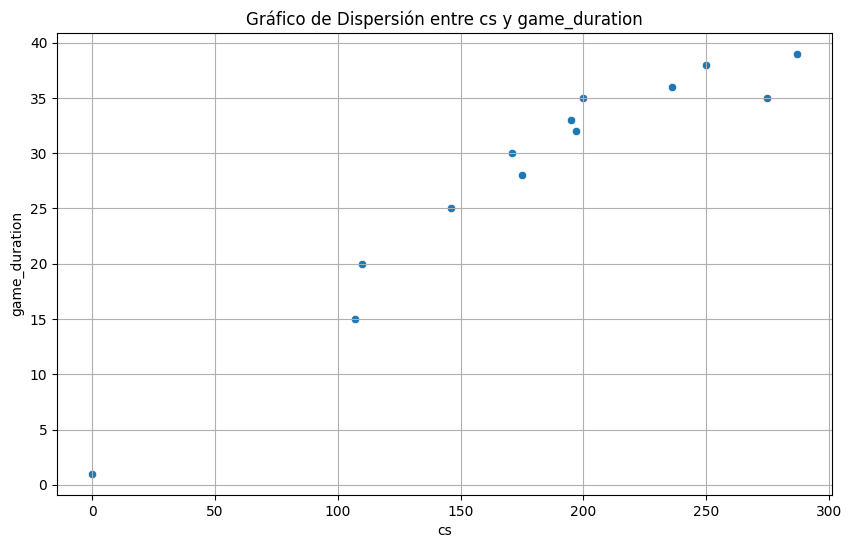

In [ ]:
comparar_columnas_df(Rengar_ranked,'cs','game_duration')

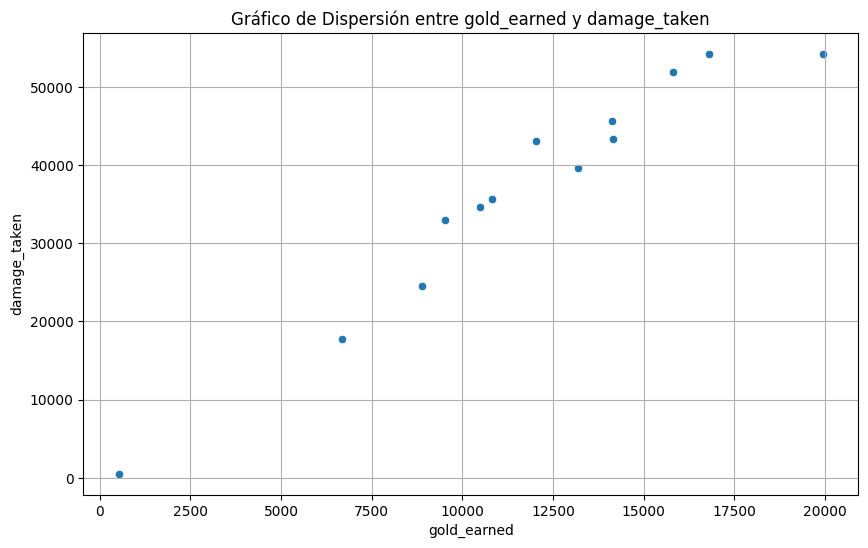

In [ ]:
comparar_columnas_df(Rengar_ranked,'gold_earned','damage_taken')

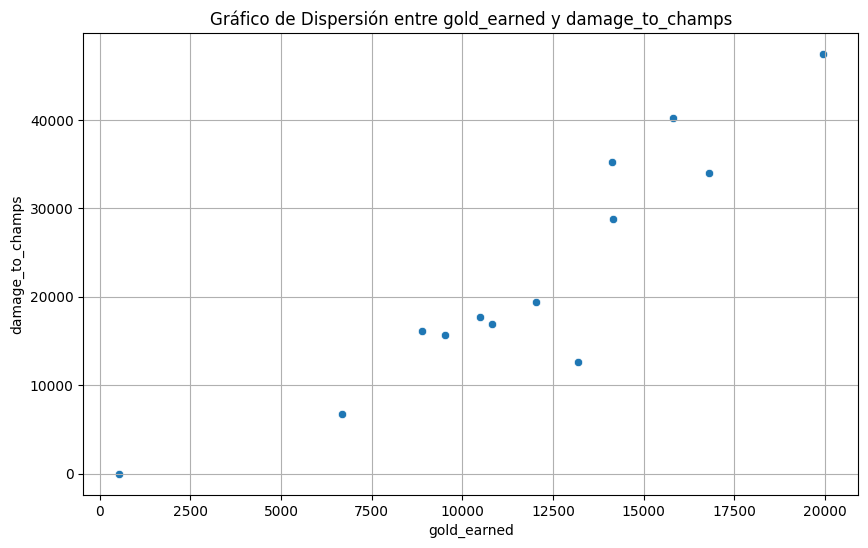

In [ ]:
comparar_columnas_df(Rengar_ranked,'gold_earned','damage_to_champs')

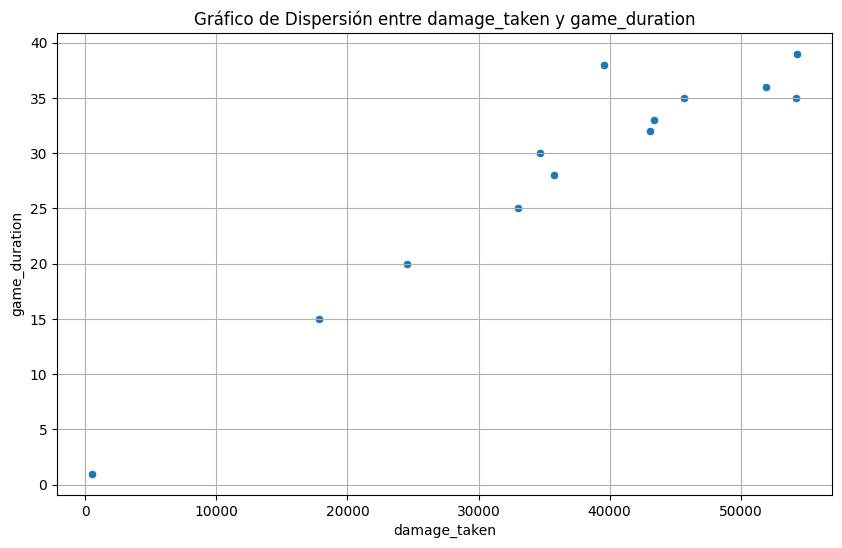

In [ ]:
comparar_columnas_df(Rengar_ranked,'damage_taken','game_duration')

###Perfil de Rendimeinto

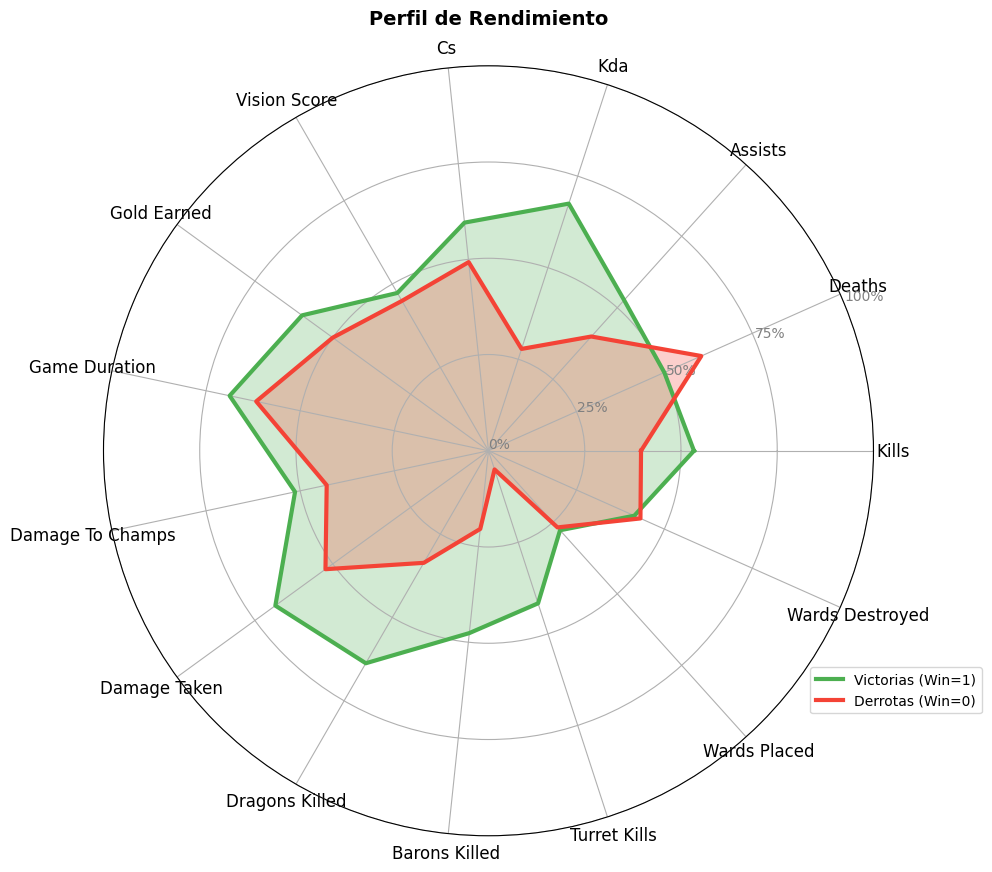

In [ ]:
plot_performance_radar_chart_standalone(Rengar_ranked, metricas)

###Comparación con el Winrate

<ipython-input-28-ca8af1589229>:26: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

<ipython-input-28-ca8af1589229>:45: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-28-ca8af1589229>:45: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-28-ca8af1589229>:45: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-28-ca8af1589229>:45: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the

DEBUG: Columna 'win' convertida a tipo 'category'.


<ipython-input-28-ca8af1589229>:45: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-28-ca8af1589229>:45: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-28-ca8af1589229>:45: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-28-ca8af1589229>:45: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-28-ca8af1589229>:45: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and wi

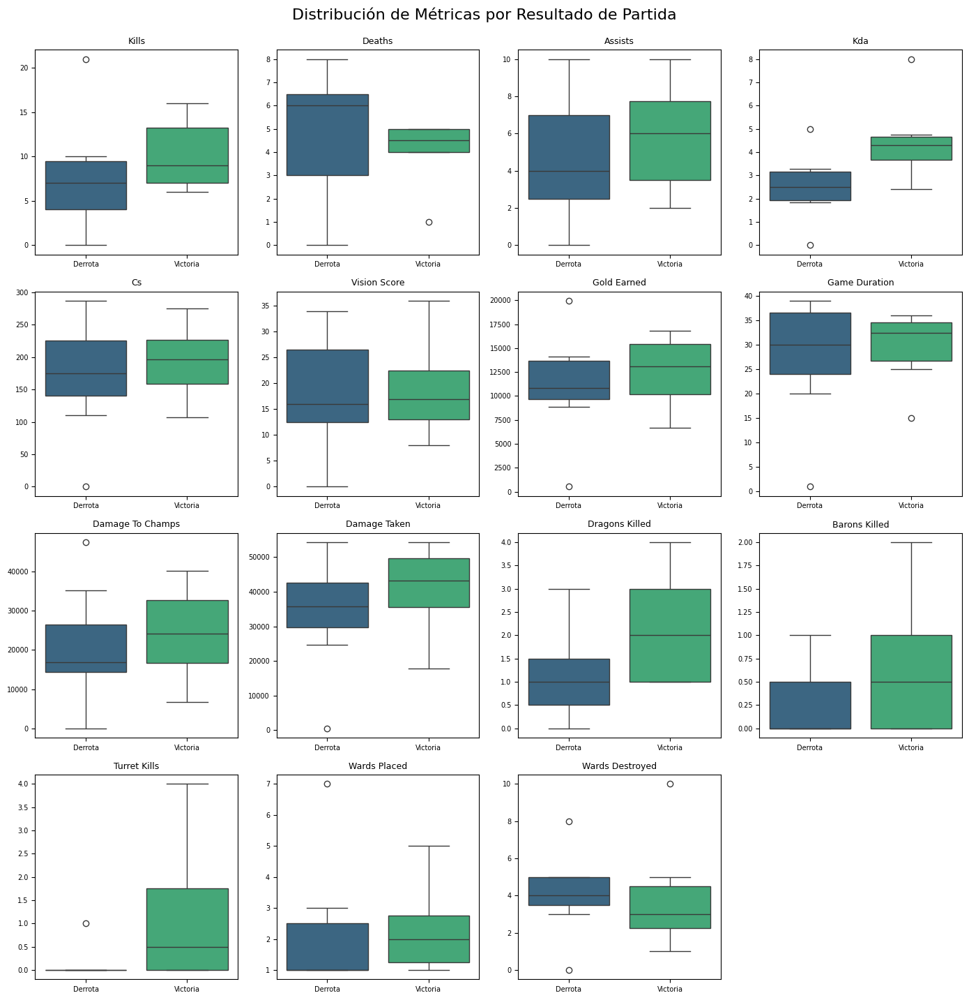

In [ ]:
plot_metric_boxplots_by_win_outcome(Rengar_ranked)

<ipython-input-32-50e8ba909eaa>:17: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



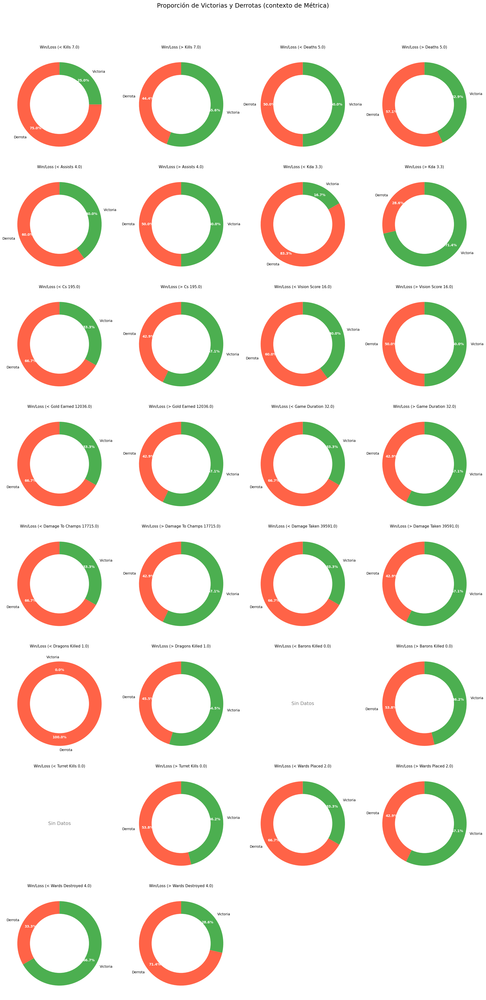

In [ ]:
plot_contextual_win_loss_donut_charts(Rengar_ranked, metricas)

<ipython-input-27-28b7a8afa8af>:15: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



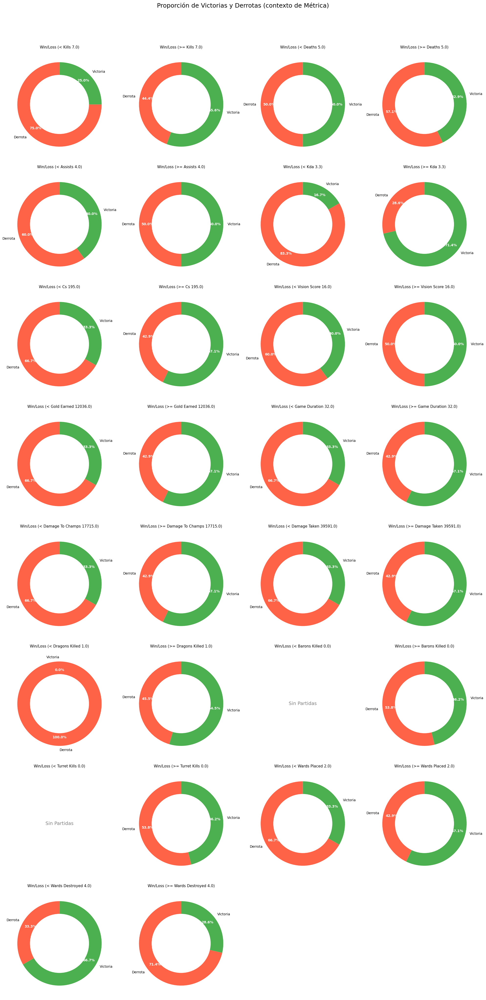

In [ ]:
plot_global_win_loss_donut_charts(Rengar_ranked, metricas)

<ipython-input-26-03aa5cd79986>:22: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



DEBUG: Columna 'win' convertida a tipo 'category'.


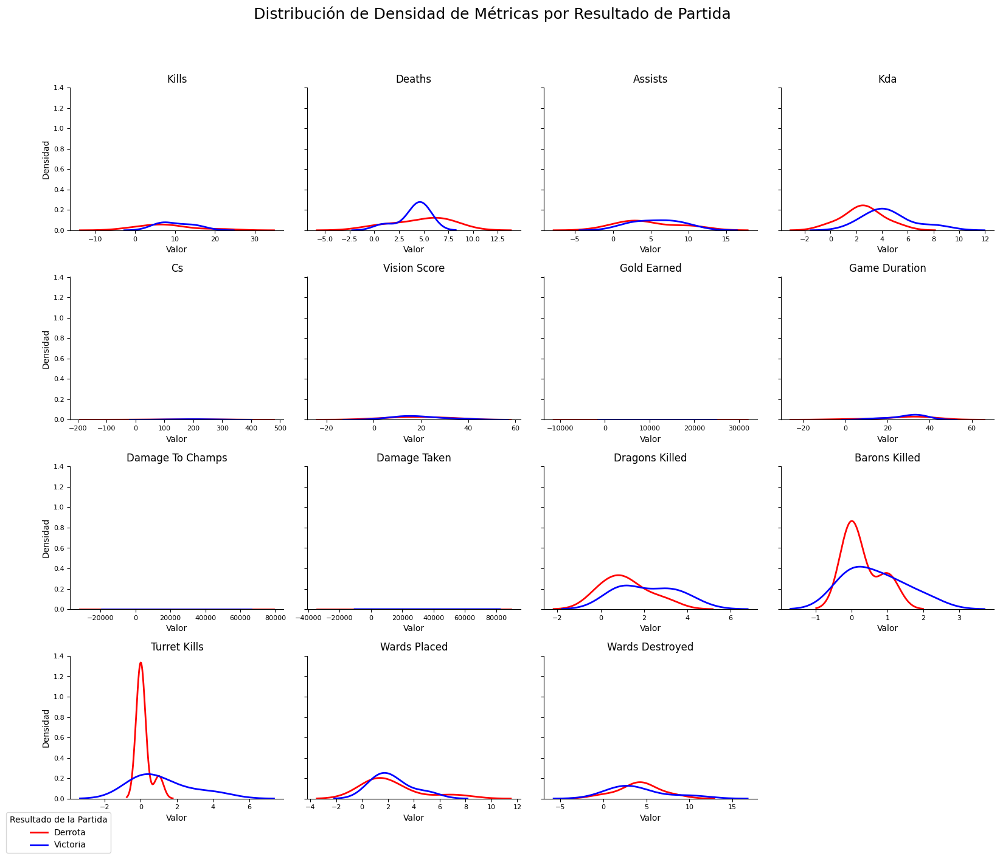

In [ ]:
plot_metric_density_by_win_outcome(Rengar_ranked)